In [1]:
!pip install mne

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 7.5 MB 4.4 MB/s 


In [2]:
from glob import glob
import os
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
from operator import itemgetter
from statistics import mean

def get_file_paths_cat(files, cat_type):
  new_list = []
  for file_path in files:
    file = file_path.split('/')[-1]
    if cat_type in file:
      new_list.append(file_path)
  return new_list

def get_results(results, filter):
  filtered_results = []
  for result_path in results:
    result = result_path.split('/')[-1]
    if filter in result:
      filtered_results.append(result)
  return filtered_results

def max_val(l, i):
    return max(enumerate(sub[i] for sub in l), key=itemgetter(1))

def get_fold_results(results_path, experiment_filter):
  result_files = get_results(results_path, experiment_filter)
  summary = []
  fold_acc = []
  fold_loss = []
  for file in result_files:  
    acc = float(file.split('_')[-1].split('-')[-1].split('=')[-1].replace('.hdf5', ''))
    loss = float(file.split('_')[-1].split('-')[0].replace('loss=', ''))
    fold = int(file.split('_')[-3].replace('f-', ''))
    epoch = int(file.split('_')[-2].replace('e-', ''))
    summary.append([fold, epoch, acc, loss])
    # print(file)
    # print('Fold\t', fold)
    # print('Epoch\t', epoch)
    # print('Acc\t', acc)
    # print('Loss\t', loss)
  for cur_fold in range(1,11):
    fold_k_results = []
    for item in summary:
      if item[0] == cur_fold:
        fold_k_results.append(item)
    # print(fold_k_results)
    (best_idx, best_acc) = max_val(fold_k_results,-2)
    fold_acc.append(best_acc)
    fold_loss.append(fold_k_results[best_idx][-1])

  print(experiment_filter, '\n')
  print('Accuracy:\t', mean(fold_acc), '')
  print(fold_acc)
  print('\nLoss:\t\t', mean(fold_loss), '')
  print(fold_loss, '\n\n')

In [4]:
result_file_paths = glob('/content/drive/MyDrive/Thesis/filters_model/*.hdf5')
get_fold_results(result_file_paths, 'cnn-512_lr-0.001_do-0.2')

ValueError: ignored

In [5]:
all_file_paths = glob('/content/drive/MyDrive/Thesis/EEG Data/*.edf')
all_file_paths_ec = get_file_paths_cat(all_file_paths, 'EC')
print("Number of files loaded:\t",len(all_file_paths_ec))
h_file_paths = get_file_paths_cat(all_file_paths_ec, 'H')
mdd_file_paths = get_file_paths_cat(all_file_paths_ec, 'MDD')

Number of files loaded:	 58


In [6]:
print(len(h_file_paths))
print(len(mdd_file_paths))

28
30


In [85]:
# for file in h_file_paths:
#   print(file)
# for file in mdd_file_paths:
#   print(file)

In [146]:
def read_data(file_path):
  datax = mne.io.read_raw_edf(file_path, preload=True)
  left_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
  ]

  right_ch = [
           'EEG Fp2-LE',
           'EEG F4-LE',
           'EEG C4-LE',
           'EEG P4-LE',
           'EEG O2-LE',
           'EEG F8-LE',
           'EEG T4-LE',
           'EEG T6-LE',
           'EEG Fz-LE',
           'EEG Cz-LE',
           'EEG Pz-LE'
  ]

  front_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG Fz-LE',
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG Cz-LE',
  ]

  back_ch = [
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Cz-LE',
          'EEG Pz-LE',
  ]

  front_left_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
  ]

  back_left_ch = [
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
  ]

  front_right_ch =[
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
  ]

  back_right_ch =[
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
  ]

  # datax.pick_channels(datax.info['ch_names'][0:20])    # ALL channels

  # datax.pick_channels(left_ch)                         # LEFT channels
  # datax.pick_channels(right_ch)                        # RIGHT channels

  datax.pick_channels(front_ch)                        # FRONT channels
  # datax.pick_channels(back_ch)                         # BACK channels

  # datax.pick_channels(front_left_ch)                   # FRONT-LEFT channels
  # datax.pick_channels(back_left_ch)                    # BACK-LEFT channels

  # datax.pick_channels(front_right_ch)                  # FRONT-RIGHT channels
  # datax.pick_channels(back_right_ch)                   # BACK-RIGHT channels


  datax.set_eeg_reference()
  datax.filter(l_freq=0.5, h_freq=41)                                         # high pass and low pass filter
  epochs = mne.make_fixed_length_epochs(datax, duration=3, overlap=0.005)   # duration is the segment size in seconds
  array = epochs.get_data()                                                 # QUESTION FOR HEZAM: WHAT OVERLAP TO SET???  *******************************
  return array                                                              # trials, channels, length of signal

In [ ]:
fp = mdd_file_paths[0]
test_data = mne.io.read_raw_edf(fp, preload=True, verbose=0)
# print(test_data.info['ch_names'][0:20])

left_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
]

front_left_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
]

back_left_ch = [
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
]

right_ch =[
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
]

front_right_ch =[
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG Fz-LE',
          'EEG Cz-LE',
]

back_right_ch =[
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Cz-LE',
          'EEG Pz-LE'
]

front_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG Fz-LE',
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG Cz-LE',
]

back_ch = [
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Cz-LE',
          'EEG Pz-LE',
]


full_ch = [
          'EEG Fp1-LE',
          'EEG F3-LE',
          'EEG C3-LE',
          'EEG P3-LE',
          'EEG O1-LE',
          'EEG F7-LE',
          'EEG T3-LE',
          'EEG T5-LE',
          'EEG Fz-LE',
          'EEG Fp2-LE',
          'EEG F4-LE',
          'EEG C4-LE',
          'EEG P4-LE',
          'EEG O2-LE',
          'EEG F8-LE',
          'EEG T4-LE',
          'EEG T6-LE',
          'EEG Cz-LE',
          'EEG Pz-LE',
          'EEG A2-A1'
]


print(len(full_ch))                                       # fb

print(len(left_ch))                                       # lh
print(len(right_ch))                                      # rh

print(len(back_ch))                                       # bh
print(len(front_ch))                                      # fh

print(len(back_left_ch))                                  # bl
print(len(front_left_ch))                                 # fl
print(len(back_right_ch))                                 # br
print(len(front_right_ch))                                # fr


test_data.pick_channels(full_ch)
# test_data.filter(l_freq=5, h_freq=40)                                         # high pass and low pass filter


20
11
11
12
12
7
7
7
7


<RawEDF | MDD S9 EC.edf, 20 x 76800 (300.0 s), ~11.7 MB, data loaded>

In [147]:
%%capture
h_array = [read_data(i) for i in h_file_paths]
mdd_array = [read_data(i) for i in mdd_file_paths]

h_label = [len(i)*[0] for i in h_array]
mdd_label = [len(i)*[1] for i in mdd_array]

data_list = h_array + mdd_array
label_list = h_label + mdd_label

group_list = [[i]*len(j) for i, j in enumerate(data_list)]            # split the data by subjects to avoid biases when training/testing model
len(group_list)

In [148]:
data_array = np.vstack(data_list)
label_array = np.hstack(label_list)
group_array = np.hstack(group_list)

data_array = np.moveaxis(data_array, 1, 2)
print(data_array.shape, label_array.shape, group_array.shape)
print(data_array.shape[2])

(5779, 768, 12) (5779,) (5779,)
12


# **Model Creation**

In [149]:
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, BatchNormalization, LeakyReLU, MaxPool1D, GlobalAveragePooling1D, AveragePooling1D, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.backend import clear_session
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau                    # ****************************** PLAY AROUND WITH THESE *********************************

In [90]:
def cnnmodel_5():
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=5, kernel_size=3, strides=1, input_shape=(768, 20)))       # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  
  model.add(Conv1D(filters=5, kernel_size=3, strides=1))                              # 2
  model.add(Dropout(0.5))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=5, kernel_size=3, strides=1))                              # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=5, kernel_size=3, strides=1))                              # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                

  model.add(Conv1D(filters=5, kernel_size=3, strides=1))                              # 5
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                           # 6

  model.compile('adam', loss='binary_crossentropy', metrics=['accuracy'])
  return model


def cnnmodel_128():
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=128, kernel_size=3, strides=1, input_shape=(768, 20)))     # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=64, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(0.5))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=32, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=16, kernel_size=3, strides=1))                             # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 

  model.add(Conv1D(filters=8, kernel_size=3, strides=1))                              # 5
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                           # 6

  model.compile('adam', loss='binary_crossentropy', metrics=['accuracy'])
  return model


def cnnmodel_128_sgd():
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=128, kernel_size=3, strides=1, input_shape=(768, 20)))     # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=64, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(0.5))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=32, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(0.5))

  model.add(Conv1D(filters=16, kernel_size=3, strides=1))                             # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 

  model.add(Conv1D(filters=8, kernel_size=3, strides=1))                              # 5
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                           # 6

  model.compile('sgd', loss='binary_crossentropy', metrics=['accuracy'])
  return model

In [150]:
from tensorflow.keras.optimizers import Adam 

NO_CHANNELS = data_array.shape[2]


def cnnmodel_128x5_lr(lr, do, fs):
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=fs, kernel_size=3, strides=1, input_shape=(768, NO_CHANNELS)))        # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=fs/2, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(do))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/4, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(do))                               

  model.add(Conv1D(filters=fs/8 , kernel_size=3, strides=1))                            # 4
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                             # 5

  model.compile(optimizer=Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
  return model


def cnnmodel_128x6_lr(lr, do, fs):
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=fs, kernel_size=3, strides=1, input_shape=(768, NO_CHANNELS)))        # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=fs/2, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(do))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/4, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/8, kernel_size=3, strides=1))                             # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                  

  model.add(Conv1D(filters=fs/16 , kernel_size=3, strides=1))                            # 5
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                              # 6

  model.compile(optimizer=Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
  return model


def cnnmodel_128x7_lr(lr, do, fs):
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=fs, kernel_size=3, strides=1, input_shape=(768, NO_CHANNELS)))        # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=fs/2, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(do))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/4, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/8, kernel_size=3, strides=1))                             # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                  

  model.add(Conv1D(filters=fs/16, kernel_size=3, strides=1))                             # 5
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))   

  model.add(Conv1D(filters=fs/32 , kernel_size=3, strides=1))                            # 6
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                              # 7

  model.compile(optimizer=Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
  return model


def cnnmodel_128x8_lr(lr, do, fs):
  clear_session()
  model = Sequential()
  
  model.add(Conv1D(filters=fs, kernel_size=3, strides=1, input_shape=(768, NO_CHANNELS)))        # 1
  model.add(BatchNormalization())
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        

  model.add(Conv1D(filters=fs/2, kernel_size=3, strides=1))                             # 2
  model.add(Dropout(do))
  model.add(LeakyReLU())
  model.add(MaxPool1D(pool_size=2, strides=2))                                        
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/4, kernel_size=3, strides=1))                             # 3
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                 
  model.add(Dropout(do))

  model.add(Conv1D(filters=fs/8, kernel_size=3, strides=1))                             # 4
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))                                  

  model.add(Conv1D(filters=fs/16, kernel_size=3, strides=1))                             # 5
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))   

  model.add(Conv1D(filters=fs/32, kernel_size=3, strides=1))                             # 6
  model.add(LeakyReLU())
  model.add(AveragePooling1D(pool_size=2, strides=2))   


  model.add(Conv1D(filters=fs/64 , kernel_size=3, strides=1))                            # 7
  model.add(LeakyReLU())
  model.add(GlobalAveragePooling1D())                                                 

  model.add(Dense(1, activation='sigmoid'))                                              # 8

  model.compile(optimizer=Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
  return model

In [109]:
# model = cnnmodel_128_lr()
# model.summary()

In [159]:
model_list = [
              # ("gkf_cnn-128_lr-0.0001",cnnmodel_128_lr(0.0001)),
              # ("gkf_cnn-128_lr-0.001",cnnmodel_128_lr(0.001)),
              # ("gkf_cnn-128_lr-0.002",cnnmodel_128_lr(0.002)),
              # ("gkf_cnn-128_lr-0.003",cnnmodel_128_lr(0.003)),
              # ("gkf_cnn-128_lr-0.004",cnnmodel_128_lr(0.004)),
              # ("gkf_cnn-128_lr-0.005",cnnmodel_128_lr(0.005)),
              # ("gkf_cnn-128_lr-0.006",cnnmodel_128_lr(0.006)),
               # ("gkf_cnn-128_lr-0.007",cnnmodel_128_lr(0.007)),
              # ("gkf_cnn-128_lr-0.008",cnnmodel_128_lr(0.008)),
              # ("gkf_cnn-128_lr-0.009",cnnmodel_128_lr(0.009)),
              # ("gkf_cnn-128_lr-0.01",cnnmodel_128_lr(0.01))

              # ("gkf_cnn-128_lr-0.001_do-0.05",cnnmodel_128_lr(0.001, 0.05)),
              # ("gkf_cnn-128_lr-0.001_do-0.10",cnnmodel_128_lr(0.001, 0.1)),
              # ("gkf_cnn-128_lr-0.001_do-0.15",cnnmodel_128_lr(0.001, 0.15)),
              # ("gkf_cnn-128_lr-0.001_do-0.20",cnnmodel_128_lr(0.001, 0.2)),
              # ("gkf_cnn-128_lr-0.001_do-0.25",cnnmodel_128_lr(0.001, 0.25)),
              # ("gkf_cnn-128_lr-0.001_do-0.30",cnnmodel_128_lr(0.001, 0.3)),
              # ("gkf_cnn-128_lr-0.001_do-0.35",cnnmodel_128_lr(0.001, 0.35)),
              # ("gkf_cnn-128_lr-0.001_do-0.40",cnnmodel_128_lr(0.001, 0.4)),
              # ("gkf_cnn-128_lr-0.001_do-0.45",cnnmodel_128_lr(0.001, 0.45)),
              # ("gkf_cnn-128_lr-0.001_do-0.50",cnnmodel_128_lr(0.001, 0.5))

              
              # ("gkf_cnn-032_lr-0.001_do-0.20",cnnmodel_128_lr(0.001, 0.2, 32)),



              # ("gkf_cnn-128x5_lr-0.001_do-0.20",cnnmodel_128x5_lr(0.001, 0.2, 128))


              # ("gkf_cnn-128x7_lr-0.001_do-0.20",cnnmodel_128x7_lr(0.001, 0.2, 128))
              # ("gkf_cnn-128x8_lr-0.001_do-0.20",cnnmodel_128x8_lr(0.001, 0.2, 128))
              
              ("gkf_fh-6_cnn-128x6_lr-0.001_do-0.20",cnnmodel_128x6_lr(0.001, 0.2, 128)),
              ("gkf_fh-7_cnn-128x6_lr-0.001_do-0.20",cnnmodel_128x6_lr(0.001, 0.2, 128)),
              ("gkf_fh-8_cnn-128x6_lr-0.001_do-0.20",cnnmodel_128x6_lr(0.001, 0.2, 128)),
              ("gkf_fh-9_cnn-128x6_lr-0.001_do-0.20",cnnmodel_128x6_lr(0.001, 0.2, 128))



              # ("gkf_cnn-128_lr-0.009_do-0.1",cnnmodel_128_lr(0.009,0.1)),
              # ("gkf_cnn-128_lr-0.009_do-0.2",cnnmodel_128_lr(0.009,0.2)),
              # ("gkf_cnn-128_lr-0.009_do-0.3",cnnmodel_128_lr(0.009,0.3)),
              # ("gkf_cnn-128_lr-0.009_do-0.4",cnnmodel_128_lr(0.009,0.4)),
              # ("gkf_cnn-128_lr-0.009_do-0.5",cnnmodel_128_lr(0.009,0.5))

]

In [160]:
# 0.0001, 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009 0.01

# /gkf-cnn-128-lr-0.006_f-8_e-06_loss=0.39675-acc=0.80134.hdf5


In [161]:
for (model_name, model) in model_list:
  # print(model_name)
  print ('{:*^100}'.format('\t'+model_name+'\t'))
  # print("\n**********************************************************\t"+model_name+"\t**********************************************************")
  # model.summary()
  #Execute Training Loop Below:

*******************************	gkf_fh-6_cnn-128x6_lr-0.001_do-0.20	********************************
*******************************	gkf_fh-7_cnn-128x6_lr-0.001_do-0.20	********************************
*******************************	gkf_fh-8_cnn-128x6_lr-0.001_do-0.20	********************************
*******************************	gkf_fh-9_cnn-128x6_lr-0.001_do-0.20	********************************


In [162]:
from sklearn.model_selection import KFold, GroupKFold, LeaveOneGroupOut
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import LearningRateScheduler

OUTDIR = '/content/drive/MyDrive/Thesis/logs/'

gkf = GroupKFold(10)
kf = KFold(10, shuffle=True, random_state=42)
accuracy = []
loss = []

In [163]:
for (model_name, model) in model_list:
  print ('{:*^150}'.format('\t'+model_name+'\t'))
  k=1
  # for train_idx, val_idx, in kf.split(data_array, label_array):
  for train_idx, val_idx, in gkf.split(data_array, label_array, groups=group_array):
    train_features, train_labels = data_array[train_idx], label_array[train_idx]
    val_features, val_labels = data_array[val_idx], label_array[val_idx]

    scaler = StandardScaler()
    train_features = scaler.fit_transform(train_features.reshape(-1, train_features.shape[-1])).reshape(train_features.shape)
    val_features = scaler.transform(val_features.reshape(-1, val_features.shape[-1])).reshape(val_features.shape)

    # Callback definitions
    # model_name = "early-stop-trial-model"                                                      # THE FOR LOOP CREATES NAMES EACH MODEL

    filepath = "/content/drive/MyDrive/Thesis/saved_models/"+model_name+"_f-"+str(k)+"_e-{epoch:02d}_loss={val_loss:.5f}-acc={val_accuracy:.5f}.hdf5"
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

    early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

    OUTDIR_KFOLD = OUTDIR+model_name+"_f-"+str(k)
    tb_callback = tf.keras.callbacks.TensorBoard(log_dir=OUTDIR_KFOLD)
    
    callback_list = [checkpoint, early_stop, tb_callback]

    # Create model and compile
    # model = cnnmodel()                                                                          # THE FOR LOOP CREATES AND COMPILE EACH MODEL
    
    # Fit model with one of the k-folds
    print("\n\n****************************************\t#"+str(k)+" K-Fold Results:\t****************************************")
    model.fit(train_features, train_labels, epochs=100, batch_size=64, validation_data=(val_features, val_labels), callbacks=callback_list)
    k = k + 1
    
    # accuracy.append(model.evaluate(val_features, val_labels)[1])
    # loss.append(model.evaluate(val_features, val_labels)[0])

********************************************************	gkf_fh-6_cnn-128x6_lr-0.001_do-0.20	*********************************************************


****************************************	#1 K-Fold Results:	****************************************
Epoch 1/100
82/83 [============================>.] - ETA: 0s - loss: 0.4482 - accuracy: 0.7750
Epoch 1: val_accuracy improved from -inf to 0.85305, saving model to /content/drive/MyDrive/Thesis/saved_models/gkf_fh-6_cnn-128x6_lr-0.001_do-0.20_f-1_e-01_loss=0.44591-acc=0.85305.hdf5
83/83 [==============================] - 2s 14ms/step - loss: 0.4478 - accuracy: 0.7753 - val_loss: 0.4459 - val_accuracy: 0.8531
Epoch 2/100
78/83 [===========================>..] - ETA: 0s - loss: 0.2583 - accuracy: 0.8962
Epoch 2: val_accuracy did not improve from 0.85305
83/83 [==============================] - 1s 11ms/step - loss: 0.2551 - accuracy: 0.8980 - val_loss: 0.3319 - val_accuracy: 0.8511
Epoch 3/100
79/83 [===========================>..] - ETA: 

In [164]:
result_file_paths = glob('/content/drive/MyDrive/Thesis/saved_models/*.hdf5')
# get_fold_results(result_file_paths, 'gkf_br_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fr_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_bl_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fl_cnn-128x6_lr-0.001_do-0.20')

# get_fold_results(result_file_paths, 'gkf_bh_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh_cnn-128x6_lr-0.001_do-0.20')

# get_fold_results(result_file_paths, 'gkf_rh_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_lh_cnn-128x6_lr-0.001_do-0.20')

# get_fold_results(result_file_paths, 'gkf_fb_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fb-2_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fb-3_cnn-128x6_lr-0.001_do-0.20')



# REPEATED TRIALS:

# get_fold_results(result_file_paths, 'gkf_bh-2_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_bh-3_cnn-128x6_lr-0.001_do-0.20')

get_fold_results(result_file_paths, 'gkf_fh-2_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-3_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-4_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-5_cnn-128x6_lr-0.001_do-0.20')


get_fold_results(result_file_paths, 'gkf_fh-6_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-7_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-8_cnn-128x6_lr-0.001_do-0.20')
get_fold_results(result_file_paths, 'gkf_fh-9_cnn-128x6_lr-0.001_do-0.20')

# get_fold_results(result_file_paths, 'gkf_rh-2_cnn-128x6_lr-0.001_do-0.20')

# get_fold_results(result_file_paths, 'gkf_fr-2_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fr-3_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fr-4_cnn-128x6_lr-0.001_do-0.20')
# get_fold_results(result_file_paths, 'gkf_fr-5_cnn-128x6_lr-0.001_do-0.20')


gkf_fh_cnn-128x6_lr-0.001_do-0.20 

Accuracy:	 0.9755739999999999 
[0.88359, 0.99613, 0.99644, 0.98667, 0.99833, 0.97826, 0.99312, 0.94658, 0.98664, 0.98998]

Loss:		 0.083086 
[0.30866, 0.04619, 0.02779, 0.05157, 0.01957, 0.05073, 0.03565, 0.14031, 0.11196, 0.03843] 


gkf_fh-2_cnn-128x6_lr-0.001_do-0.20 

Accuracy:	 0.972691 
[0.90458, 0.99226, 0.98932, 0.985, 0.995, 0.99833, 0.97762, 0.92821, 0.96661, 0.98998]

Loss:		 0.112288 
[0.43249, 0.08434, 0.05115, 0.04769, 0.0291, 0.02107, 0.06825, 0.1839, 0.16171, 0.04318] 


gkf_fh-3_cnn-128x6_lr-0.001_do-0.20 

Accuracy:	 0.975484 
[0.89504, 0.9942, 0.99466, 0.98833, 0.99833, 0.99498, 0.98279, 0.94324, 0.96995, 0.99332]

Loss:		 0.090137 
[0.32809, 0.04197, 0.0487, 0.05133, 0.01569, 0.04611, 0.0557, 0.13494, 0.14195, 0.03689] 


gkf_fh-4_cnn-128x6_lr-0.001_do-0.20 

Accuracy:	 0.97457 
[0.91603, 0.99033, 0.97865, 0.975, 0.99833, 0.99498, 0.97418, 0.96828, 0.97663, 0.97329]

Loss:		 0.108402 
[0.2767, 0.06408, 0.04747, 0.20748, 0.03841, 0

In [1]:
%load_ext tensorboard
%tensorboard  --logdir /content/drive/MyDrive/Thesis/logs/
# %reload_ext tensorboard

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 0.0001, 0.001, 0.01, 0.005,

In [ ]:
from sklearn.metrics import classification_report

loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/saved_models/early-stop-trial-model_fold-9_epoch-11_0.91.hdf5')

# loaded_model.summary()
y_pred = loaded_model.predict(val_features)

# print(classification_report(val_labels, np.round(y_pred,0)))
loaded_model.evaluate(val_features, val_labels)

19/19 [==============================] - 1s 29ms/step - loss: 0.3424 - accuracy: 0.8440


[0.3423575162887573, 0.8440207839012146]

In [ ]:
k = 1
for train_idx, val_idx, in gkf.split(data_array, label_array, groups=group_array):
# for train_idx, val_idx, in kf.split(data_array, label_array):
  train_features, train_labels = data_array[train_idx], label_array[train_idx]
  val_features, val_labels = data_array[val_idx], label_array[val_idx]

  print("FOLD\t", k)
  print(group_array[val_idx])
  # print(val_labels)
  # print(len(val_labels))
  # print(len(train_labels))
  # print(len(val_labels)+len(train_labels))
  print("\n")
  k = k + 1


  # print(val_labels)
  # for train_idx, val_idx, in kf.split(data_array, label_array):
  #   train_features, train_labels = data_array[train_idx], label_array[train_idx]
  #   val_features, val_labels = data_array[val_idx], label_array[val_idx]


#   scaler = StandardScaler()
#   train_features = scaler.fit_transform(train_features.reshape(-1, train_features.shape[-1])).reshape(train_features.shape)
#   val_features = scaler.transform(val_features.reshape(-1, val_features.shape[-1])).reshape(val_features.shape)

#   tb_callback = tf.keras.callbacks.TensorBoard(log_dir=OUTDIR, histogram_freq=1)
  
#   # Create model and compile
#   model = cnnmodel()
  
#   # Fit model with one of the k-folds
#   model.fit(train_features, train_labels, epochs=1, batch_size=64, validation_data=(val_features, val_labels), callbacks=[tb_callback])
  

#   # print(np.unique(val_labels, return_counts=True))
#   # print(train_features.shape, val_features.shape)

FOLD	 1
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21
 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21
 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21
 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21
 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21 21
 21 21 21 21 21 21 21 21 21 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 47 

In [ ]:
 for train_idx, val_idx, in gkf.split(data_array, label_array, groups=group_array):
  train_features, train_labels = data_array[train_idx], label_array[train_idx]
  val_features, val_labels = data_array[val_idx], label_array[val_idx]
  print(np.unique(val_labels, return_counts=True))
  print(train_features.shape, val_features.shape)

(array([0, 1]), array([186, 149]))
(1388, 2560, 20) (335, 2560, 20)
(array([0, 1]), array([214, 119]))
(1390, 2560, 20) (333, 2560, 20)
(array([0, 1]), array([120, 237]))
(1366, 2560, 20) (357, 2560, 20)
(array([0, 1]), array([180, 172]))
(1371, 2560, 20) (352, 2560, 20)
(array([0, 1]), array([150, 196]))
(1377, 2560, 20) (346, 2560, 20)


In [ ]:
y_pred = model.predict(val_features)


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_labels, np.round(y_pred,0)))
# print(val_labels)

              precision    recall  f1-score   support

           0       0.43      1.00      0.60       150
           1       0.00      0.00      0.00       196

    accuracy                           0.43       346
   macro avg       0.22      0.50      0.30       346
weighted avg       0.19      0.43      0.26       346



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model.evaluate(val_features, val_labels)

11/11 [==============================] - 0s 38ms/step - loss: 0.7138 - accuracy: 0.4335


[0.7138065695762634, 0.43352600932121277]

In [ ]:
loss

[0.589618980884552,
 0.5781329274177551,
 0.5775184631347656,
 0.6852633357048035,
 0.6237232685089111,
 0.7034952044487,
 0.7875966429710388,
 0.5780271887779236,
 0.7141197919845581,
 1.283461570739746,
 0.5773427486419678]

# **Rough Notes**

In [ ]:
# sample length 3s, batch size = 64, epoch=100, patients allowed to be mixed through both testing and training sets. (unlike experiments below!)

Epoch 1/100
82/82 [==============================] - 6s 62ms/step - loss: 0.6562 - accuracy: 0.5510 - val_loss: 0.5937 - val_accuracy: 0.7439
Epoch 2/100
82/82 [==============================] - 5s 58ms/step - loss: 0.5279 - accuracy: 0.7456 - val_loss: 0.4769 - val_accuracy: 0.8010
Epoch 3/100
82/82 [==============================] - 5s 58ms/step - loss: 0.4388 - accuracy: 0.7954 - val_loss: 0.4274 - val_accuracy: 0.8253
Epoch 4/100
82/82 [==============================] - 5s 57ms/step - loss: 0.3697 - accuracy: 0.8273 - val_loss: 0.3789 - val_accuracy: 0.8322
Epoch 5/100
82/82 [==============================] - 5s 58ms/step - loss: 0.3239 - accuracy: 0.8529 - val_loss: 0.3169 - val_accuracy: 0.8633
Epoch 6/100
82/82 [==============================] - 5s 57ms/step - loss: 0.2998 - accuracy: 0.8658 - val_loss: 0.2956 - val_accuracy: 0.8754
Epoch 7/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2853 - accuracy: 0.8754 - val_loss: 0.2836 - val_accuracy: 0.8824
Epoch 8/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2813 - accuracy: 0.8783 - val_loss: 0.2730 - val_accuracy: 0.8875
Epoch 9/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2795 - accuracy: 0.8781 - val_loss: 0.2589 - val_accuracy: 0.8910
Epoch 10/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2653 - accuracy: 0.8864 - val_loss: 0.2595 - val_accuracy: 0.9031
Epoch 11/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2581 - accuracy: 0.8877 - val_loss: 0.2565 - val_accuracy: 0.9152
Epoch 12/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2516 - accuracy: 0.8969 - val_loss: 0.2457 - val_accuracy: 0.9135
Epoch 13/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2442 - accuracy: 0.8944 - val_loss: 0.2348 - val_accuracy: 0.9221
Epoch 14/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2200 - accuracy: 0.9075 - val_loss: 0.2254 - val_accuracy: 0.9014
Epoch 15/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2274 - accuracy: 0.9048 - val_loss: 0.2200 - val_accuracy: 0.9066
Epoch 16/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2319 - accuracy: 0.9041 - val_loss: 0.2270 - val_accuracy: 0.9118
Epoch 17/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2285 - accuracy: 0.9039 - val_loss: 0.2174 - val_accuracy: 0.9343
Epoch 18/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2143 - accuracy: 0.9119 - val_loss: 0.2108 - val_accuracy: 0.9256
Epoch 19/100
82/82 [==============================] - 5s 57ms/step - loss: 0.2103 - accuracy: 0.9119 - val_loss: 0.2062 - val_accuracy: 0.9170
Epoch 20/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2131 - accuracy: 0.9125 - val_loss: 0.2086 - val_accuracy: 0.9498
Epoch 21/100
82/82 [==============================] - 5s 57ms/step - loss: 0.2131 - accuracy: 0.9117 - val_loss: 0.2041 - val_accuracy: 0.9221
Epoch 22/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1983 - accuracy: 0.9175 - val_loss: 0.1973 - val_accuracy: 0.9273
Epoch 23/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2107 - accuracy: 0.9150 - val_loss: 0.2103 - val_accuracy: 0.9481
Epoch 24/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2076 - accuracy: 0.9152 - val_loss: 0.1915 - val_accuracy: 0.9273
Epoch 25/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2019 - accuracy: 0.9202 - val_loss: 0.1869 - val_accuracy: 0.9516
Epoch 26/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2045 - accuracy: 0.9162 - val_loss: 0.1898 - val_accuracy: 0.9412
Epoch 27/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1939 - accuracy: 0.9208 - val_loss: 0.1918 - val_accuracy: 0.9360
Epoch 28/100
82/82 [==============================] - 5s 57ms/step - loss: 0.1959 - accuracy: 0.9219 - val_loss: 0.1846 - val_accuracy: 0.9412
Epoch 29/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2030 - accuracy: 0.9212 - val_loss: 0.1790 - val_accuracy: 0.9412
Epoch 30/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2016 - accuracy: 0.9164 - val_loss: 0.1738 - val_accuracy: 0.9567
Epoch 31/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1955 - accuracy: 0.9264 - val_loss: 0.1732 - val_accuracy: 0.9498
Epoch 32/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1845 - accuracy: 0.9281 - val_loss: 0.1765 - val_accuracy: 0.9516
Epoch 33/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1921 - accuracy: 0.9204 - val_loss: 0.1765 - val_accuracy: 0.9446
Epoch 34/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1879 - accuracy: 0.9256 - val_loss: 0.1728 - val_accuracy: 0.9446
Epoch 35/100
82/82 [==============================] - 5s 57ms/step - loss: 0.1860 - accuracy: 0.9208 - val_loss: 0.1649 - val_accuracy: 0.9464
Epoch 36/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1875 - accuracy: 0.9239 - val_loss: 0.1677 - val_accuracy: 0.9394
Epoch 37/100
82/82 [==============================] - 5s 57ms/step - loss: 0.1881 - accuracy: 0.9202 - val_loss: 0.1794 - val_accuracy: 0.9619
Epoch 38/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1895 - accuracy: 0.9256 - val_loss: 0.2103 - val_accuracy: 0.9308
Epoch 39/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1876 - accuracy: 0.9316 - val_loss: 0.1665 - val_accuracy: 0.9602
Epoch 40/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1680 - accuracy: 0.9339 - val_loss: 0.1746 - val_accuracy: 0.9516
Epoch 41/100
82/82 [==============================] - 5s 57ms/step - loss: 0.1784 - accuracy: 0.9262 - val_loss: 0.1753 - val_accuracy: 0.9516
Epoch 42/100
82/82 [==============================] - 5s 57ms/step - loss: 0.1764 - accuracy: 0.9262 - val_loss: 0.1558 - val_accuracy: 0.9654
Epoch 43/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1789 - accuracy: 0.9298 - val_loss: 0.1739 - val_accuracy: 0.9516
Epoch 44/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1785 - accuracy: 0.9291 - val_loss: 0.1952 - val_accuracy: 0.9360
Epoch 45/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1660 - accuracy: 0.9316 - val_loss: 0.1697 - val_accuracy: 0.9464
Epoch 46/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1686 - accuracy: 0.9294 - val_loss: 0.1664 - val_accuracy: 0.9516
Epoch 47/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1613 - accuracy: 0.9344 - val_loss: 0.1525 - val_accuracy: 0.9637
Epoch 48/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1830 - accuracy: 0.9248 - val_loss: 0.1556 - val_accuracy: 0.9550
Epoch 49/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1713 - accuracy: 0.9273 - val_loss: 0.1470 - val_accuracy: 0.9689
Epoch 50/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1710 - accuracy: 0.9362 - val_loss: 0.1566 - val_accuracy: 0.9637
Epoch 51/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1655 - accuracy: 0.9335 - val_loss: 0.1751 - val_accuracy: 0.9377
Epoch 52/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1698 - accuracy: 0.9346 - val_loss: 0.1366 - val_accuracy: 0.9723
Epoch 53/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1800 - accuracy: 0.9267 - val_loss: 0.1605 - val_accuracy: 0.9637
Epoch 54/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1782 - accuracy: 0.9308 - val_loss: 0.1581 - val_accuracy: 0.9654
Epoch 55/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1580 - accuracy: 0.9389 - val_loss: 0.1894 - val_accuracy: 0.9377
Epoch 56/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1613 - accuracy: 0.9371 - val_loss: 0.1899 - val_accuracy: 0.9325
Epoch 57/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1591 - accuracy: 0.9339 - val_loss: 0.1254 - val_accuracy: 0.9740
Epoch 58/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1622 - accuracy: 0.9354 - val_loss: 0.1295 - val_accuracy: 0.9723
Epoch 59/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1664 - accuracy: 0.9352 - val_loss: 0.1272 - val_accuracy: 0.9689
Epoch 60/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1598 - accuracy: 0.9333 - val_loss: 0.1309 - val_accuracy: 0.9671
Epoch 61/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1672 - accuracy: 0.9339 - val_loss: 0.1361 - val_accuracy: 0.9723
Epoch 62/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1539 - accuracy: 0.9375 - val_loss: 0.1608 - val_accuracy: 0.9567
Epoch 63/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1669 - accuracy: 0.9333 - val_loss: 0.1502 - val_accuracy: 0.9619
Epoch 64/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1511 - accuracy: 0.9439 - val_loss: 0.1302 - val_accuracy: 0.9689
Epoch 65/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1604 - accuracy: 0.9392 - val_loss: 0.1303 - val_accuracy: 0.9671
Epoch 66/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1552 - accuracy: 0.9391 - val_loss: 0.1966 - val_accuracy: 0.9256
Epoch 67/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1542 - accuracy: 0.9423 - val_loss: 0.1215 - val_accuracy: 0.9706
Epoch 68/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1538 - accuracy: 0.9400 - val_loss: 0.1178 - val_accuracy: 0.9706
Epoch 69/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1483 - accuracy: 0.9435 - val_loss: 0.1296 - val_accuracy: 0.9654
Epoch 70/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1458 - accuracy: 0.9452 - val_loss: 0.1136 - val_accuracy: 0.9706
Epoch 71/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1461 - accuracy: 0.9419 - val_loss: 0.1182 - val_accuracy: 0.9654
Epoch 72/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1458 - accuracy: 0.9439 - val_loss: 0.1122 - val_accuracy: 0.9689
Epoch 73/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1448 - accuracy: 0.9458 - val_loss: 0.1127 - val_accuracy: 0.9740
Epoch 74/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1424 - accuracy: 0.9419 - val_loss: 0.1231 - val_accuracy: 0.9671
Epoch 75/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1660 - accuracy: 0.9352 - val_loss: 0.1563 - val_accuracy: 0.9464
Epoch 76/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1505 - accuracy: 0.9423 - val_loss: 0.1399 - val_accuracy: 0.9619
Epoch 77/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1439 - accuracy: 0.9415 - val_loss: 0.1177 - val_accuracy: 0.9740
Epoch 78/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1495 - accuracy: 0.9494 - val_loss: 0.1135 - val_accuracy: 0.9706
Epoch 79/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1435 - accuracy: 0.9435 - val_loss: 0.1125 - val_accuracy: 0.9671
Epoch 80/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1343 - accuracy: 0.9498 - val_loss: 0.1192 - val_accuracy: 0.9671
Epoch 81/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1448 - accuracy: 0.9444 - val_loss: 0.1511 - val_accuracy: 0.9481
Epoch 82/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1427 - accuracy: 0.9456 - val_loss: 0.1111 - val_accuracy: 0.9758
Epoch 83/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1440 - accuracy: 0.9423 - val_loss: 0.1241 - val_accuracy: 0.9585
Epoch 84/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1300 - accuracy: 0.9512 - val_loss: 0.1054 - val_accuracy: 0.9689
Epoch 85/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1460 - accuracy: 0.9400 - val_loss: 0.1046 - val_accuracy: 0.9758
Epoch 86/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1462 - accuracy: 0.9431 - val_loss: 0.1185 - val_accuracy: 0.9654
Epoch 87/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1451 - accuracy: 0.9471 - val_loss: 0.1075 - val_accuracy: 0.9740
Epoch 88/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1349 - accuracy: 0.9477 - val_loss: 0.1022 - val_accuracy: 0.9758
Epoch 89/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1363 - accuracy: 0.9456 - val_loss: 0.1111 - val_accuracy: 0.9723
Epoch 90/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1402 - accuracy: 0.9425 - val_loss: 0.1635 - val_accuracy: 0.9429
Epoch 91/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1410 - accuracy: 0.9483 - val_loss: 0.1182 - val_accuracy: 0.9689
Epoch 92/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1419 - accuracy: 0.9435 - val_loss: 0.1085 - val_accuracy: 0.9723
Epoch 93/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1346 - accuracy: 0.9490 - val_loss: 0.1373 - val_accuracy: 0.9533
Epoch 94/100
82/82 [==============================] - 5s 58ms/step - loss: 0.1373 - accuracy: 0.9473 - val_loss: 0.1180 - val_accuracy: 0.9689
Epoch 95/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1343 - accuracy: 0.9481 - val_loss: 0.1383 - val_accuracy: 0.9585
Epoch 96/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1315 - accuracy: 0.9479 - val_loss: 0.1125 - val_accuracy: 0.9706
Epoch 97/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1233 - accuracy: 0.9523 - val_loss: 0.1015 - val_accuracy: 0.9671
Epoch 98/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1416 - accuracy: 0.9456 - val_loss: 0.1017 - val_accuracy: 0.9706
Epoch 99/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1260 - accuracy: 0.9502 - val_loss: 0.1123 - val_accuracy: 0.9567
Epoch 100/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1261 - accuracy: 0.9515 - val_loss: 0.1010 - val_accuracy: 0.9706
19/19 [==============================] - 0s 14ms/step - loss: 0.1010 - accuracy: 0.9706
19/19 [==============================] - 0s 13ms/step - loss: 0.1010 - accuracy: 0.9706
Epoch 1/100
82/82 [==============================] - 7s 68ms/step - loss: 0.6149 - accuracy: 0.6574 - val_loss: 0.5665 - val_accuracy: 0.7180
Epoch 2/100
82/82 [==============================] - 5s 59ms/step - loss: 0.4639 - accuracy: 0.7737 - val_loss: 0.4597 - val_accuracy: 0.7664
Epoch 3/100
82/82 [==============================] - 5s 58ms/step - loss: 0.3952 - accuracy: 0.8162 - val_loss: 0.4456 - val_accuracy: 0.7716
Epoch 4/100
82/82 [==============================] - 5s 59ms/step - loss: 0.3418 - accuracy: 0.8462 - val_loss: 0.3300 - val_accuracy: 0.8460
Epoch 5/100
82/82 [==============================] - 8s 102ms/step - loss: 0.3245 - accuracy: 0.8539 - val_loss: 0.3424 - val_accuracy: 0.8270
Epoch 6/100
82/82 [==============================] - 7s 88ms/step - loss: 0.3080 - accuracy: 0.8616 - val_loss: 0.3197 - val_accuracy: 0.8599
Epoch 7/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2913 - accuracy: 0.8739 - val_loss: 0.3093 - val_accuracy: 0.8685
Epoch 8/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2806 - accuracy: 0.8793 - val_loss: 0.2845 - val_accuracy: 0.8962
Epoch 9/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2688 - accuracy: 0.8810 - val_loss: 0.2726 - val_accuracy: 0.9031
Epoch 10/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2599 - accuracy: 0.8866 - val_loss: 0.2807 - val_accuracy: 0.8962
Epoch 11/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2544 - accuracy: 0.8950 - val_loss: 0.2762 - val_accuracy: 0.8875
Epoch 12/100
82/82 [==============================] - 5s 58ms/step - loss: 0.2460 - accuracy: 0.8964 - val_loss: 0.2568 - val_accuracy: 0.9170
Epoch 13/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2469 - accuracy: 0.8912 - val_loss: 0.2678 - val_accuracy: 0.9066
Epoch 14/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2423 - accuracy: 0.8954 - val_loss: 0.2540 - val_accuracy: 0.9291
Epoch 15/100
82/82 [==============================] - 9s 108ms/step - loss: 0.2252 - accuracy: 0.9023 - val_loss: 0.2562 - val_accuracy: 0.9135
Epoch 16/100
82/82 [==============================] - 8s 99ms/step - loss: 0.2261 - accuracy: 0.9012 - val_loss: 0.2398 - val_accuracy: 0.9273
Epoch 17/100
82/82 [==============================] - 7s 91ms/step - loss: 0.2205 - accuracy: 0.9035 - val_loss: 0.2408 - val_accuracy: 0.9170
Epoch 18/100
82/82 [==============================] - 7s 85ms/step - loss: 0.2240 - accuracy: 0.9039 - val_loss: 0.2552 - val_accuracy: 0.8962
Epoch 19/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2133 - accuracy: 0.9060 - val_loss: 0.2395 - val_accuracy: 0.9100
Epoch 20/100
82/82 [==============================] - 7s 80ms/step - loss: 0.2138 - accuracy: 0.9067 - val_loss: 0.2385 - val_accuracy: 0.9118
Epoch 21/100
82/82 [==============================] - 8s 93ms/step - loss: 0.2044 - accuracy: 0.9135 - val_loss: 0.2236 - val_accuracy: 0.9308
Epoch 22/100
82/82 [==============================] - 7s 86ms/step - loss: 0.2063 - accuracy: 0.9116 - val_loss: 0.2129 - val_accuracy: 0.9221
Epoch 23/100
82/82 [==============================] - 9s 104ms/step - loss: 0.1981 - accuracy: 0.9169 - val_loss: 0.2240 - val_accuracy: 0.9170
Epoch 24/100
82/82 [==============================] - 9s 108ms/step - loss: 0.1977 - accuracy: 0.9154 - val_loss: 0.2035 - val_accuracy: 0.9533
Epoch 25/100
82/82 [==============================] - 9s 115ms/step - loss: 0.2040 - accuracy: 0.9177 - val_loss: 0.2075 - val_accuracy: 0.9394
Epoch 26/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2126 - accuracy: 0.9154 - val_loss: 0.2044 - val_accuracy: 0.9377
Epoch 27/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1923 - accuracy: 0.9198 - val_loss: 0.1980 - val_accuracy: 0.9360
Epoch 28/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1808 - accuracy: 0.9223 - val_loss: 0.1952 - val_accuracy: 0.9343
Epoch 29/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1901 - accuracy: 0.9254 - val_loss: 0.2042 - val_accuracy: 0.9394
Epoch 30/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1788 - accuracy: 0.9292 - val_loss: 0.2143 - val_accuracy: 0.9412
Epoch 31/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1908 - accuracy: 0.9158 - val_loss: 0.1953 - val_accuracy: 0.9637
Epoch 32/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1739 - accuracy: 0.9298 - val_loss: 0.2051 - val_accuracy: 0.9498
Epoch 33/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1797 - accuracy: 0.9271 - val_loss: 0.2043 - val_accuracy: 0.9602
Epoch 34/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1701 - accuracy: 0.9337 - val_loss: 0.1932 - val_accuracy: 0.9464
Epoch 35/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1775 - accuracy: 0.9300 - val_loss: 0.1902 - val_accuracy: 0.9498
Epoch 36/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1734 - accuracy: 0.9310 - val_loss: 0.1919 - val_accuracy: 0.9585
Epoch 37/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1720 - accuracy: 0.9316 - val_loss: 0.1920 - val_accuracy: 0.9602
Epoch 38/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1689 - accuracy: 0.9354 - val_loss: 0.1805 - val_accuracy: 0.9602
Epoch 39/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1671 - accuracy: 0.9287 - val_loss: 0.1832 - val_accuracy: 0.9464
Epoch 40/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1847 - accuracy: 0.9254 - val_loss: 0.1873 - val_accuracy: 0.9654
Epoch 41/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1730 - accuracy: 0.9335 - val_loss: 0.1827 - val_accuracy: 0.9619
Epoch 42/100
82/82 [==============================] - 6s 72ms/step - loss: 0.1623 - accuracy: 0.9325 - val_loss: 0.1837 - val_accuracy: 0.9602
Epoch 43/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1607 - accuracy: 0.9371 - val_loss: 0.1916 - val_accuracy: 0.9550
Epoch 44/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1693 - accuracy: 0.9308 - val_loss: 0.1931 - val_accuracy: 0.9585
Epoch 45/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1575 - accuracy: 0.9356 - val_loss: 0.1840 - val_accuracy: 0.9637
Epoch 46/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1589 - accuracy: 0.9362 - val_loss: 0.1839 - val_accuracy: 0.9654
Epoch 47/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1542 - accuracy: 0.9389 - val_loss: 0.2019 - val_accuracy: 0.9360
Epoch 48/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1527 - accuracy: 0.9425 - val_loss: 0.1768 - val_accuracy: 0.9654
Epoch 49/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1489 - accuracy: 0.9410 - val_loss: 0.2260 - val_accuracy: 0.9291
Epoch 50/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1430 - accuracy: 0.9421 - val_loss: 0.2331 - val_accuracy: 0.9239
Epoch 51/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1546 - accuracy: 0.9369 - val_loss: 0.2595 - val_accuracy: 0.8997
Epoch 52/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1480 - accuracy: 0.9448 - val_loss: 0.1964 - val_accuracy: 0.9481
Epoch 53/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1440 - accuracy: 0.9442 - val_loss: 0.2051 - val_accuracy: 0.9377
Epoch 54/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1639 - accuracy: 0.9341 - val_loss: 0.1649 - val_accuracy: 0.9637
Epoch 55/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1519 - accuracy: 0.9417 - val_loss: 0.1769 - val_accuracy: 0.9567
Epoch 56/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1383 - accuracy: 0.9494 - val_loss: 0.1657 - val_accuracy: 0.9706
Epoch 57/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1370 - accuracy: 0.9500 - val_loss: 0.1589 - val_accuracy: 0.9637
Epoch 58/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1491 - accuracy: 0.9456 - val_loss: 0.1687 - val_accuracy: 0.9671
Epoch 59/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1373 - accuracy: 0.9467 - val_loss: 0.1870 - val_accuracy: 0.9446
Epoch 60/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1342 - accuracy: 0.9464 - val_loss: 0.1869 - val_accuracy: 0.9498
Epoch 61/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1342 - accuracy: 0.9473 - val_loss: 0.2737 - val_accuracy: 0.8875
Epoch 62/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1454 - accuracy: 0.9450 - val_loss: 0.1985 - val_accuracy: 0.9481
Epoch 63/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1403 - accuracy: 0.9454 - val_loss: 0.1899 - val_accuracy: 0.9585
Epoch 64/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1285 - accuracy: 0.9479 - val_loss: 0.1632 - val_accuracy: 0.9654
Epoch 65/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1488 - accuracy: 0.9419 - val_loss: 0.1692 - val_accuracy: 0.9567
Epoch 66/100
82/82 [==============================] - 5s 59ms/step - loss: 0.1347 - accuracy: 0.9481 - val_loss: 0.1844 - val_accuracy: 0.9429
Epoch 67/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1358 - accuracy: 0.9460 - val_loss: 0.1740 - val_accuracy: 0.9498
Epoch 68/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1326 - accuracy: 0.9487 - val_loss: 0.2259 - val_accuracy: 0.9343
Epoch 69/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1389 - accuracy: 0.9442 - val_loss: 0.1668 - val_accuracy: 0.9619
Epoch 70/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1284 - accuracy: 0.9489 - val_loss: 0.2125 - val_accuracy: 0.9343
Epoch 71/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1326 - accuracy: 0.9473 - val_loss: 0.3326 - val_accuracy: 0.8495
Epoch 72/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1345 - accuracy: 0.9487 - val_loss: 0.2005 - val_accuracy: 0.9360
Epoch 73/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1401 - accuracy: 0.9533 - val_loss: 0.1719 - val_accuracy: 0.9498
Epoch 74/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1320 - accuracy: 0.9475 - val_loss: 0.2086 - val_accuracy: 0.9291
Epoch 75/100
82/82 [==============================] - 6s 79ms/step - loss: 0.1302 - accuracy: 0.9510 - val_loss: 0.2102 - val_accuracy: 0.9308
Epoch 76/100
82/82 [==============================] - 9s 107ms/step - loss: 0.1161 - accuracy: 0.9544 - val_loss: 0.1466 - val_accuracy: 0.9637
Epoch 77/100
82/82 [==============================] - 8s 96ms/step - loss: 0.1237 - accuracy: 0.9508 - val_loss: 0.1599 - val_accuracy: 0.9602
Epoch 78/100
82/82 [==============================] - 7s 81ms/step - loss: 0.1116 - accuracy: 0.9560 - val_loss: 0.1873 - val_accuracy: 0.9464
Epoch 79/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1286 - accuracy: 0.9540 - val_loss: 0.1803 - val_accuracy: 0.9464
Epoch 80/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1360 - accuracy: 0.9469 - val_loss: 0.1800 - val_accuracy: 0.9498
Epoch 81/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1226 - accuracy: 0.9562 - val_loss: 0.1566 - val_accuracy: 0.9585
Epoch 82/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1161 - accuracy: 0.9544 - val_loss: 0.2731 - val_accuracy: 0.8806
Epoch 83/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1153 - accuracy: 0.9554 - val_loss: 0.3127 - val_accuracy: 0.8875
Epoch 84/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1366 - accuracy: 0.9548 - val_loss: 0.1940 - val_accuracy: 0.9446
Epoch 85/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1346 - accuracy: 0.9514 - val_loss: 0.3370 - val_accuracy: 0.8460
Epoch 86/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1172 - accuracy: 0.9542 - val_loss: 0.1647 - val_accuracy: 0.9567
Epoch 87/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1253 - accuracy: 0.9537 - val_loss: 0.1339 - val_accuracy: 0.9671
Epoch 88/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1121 - accuracy: 0.9585 - val_loss: 0.2738 - val_accuracy: 0.8841
Epoch 89/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1177 - accuracy: 0.9571 - val_loss: 0.1442 - val_accuracy: 0.9619
Epoch 90/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1279 - accuracy: 0.9531 - val_loss: 0.2011 - val_accuracy: 0.9308
Epoch 91/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1195 - accuracy: 0.9562 - val_loss: 0.2622 - val_accuracy: 0.8962
Epoch 92/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1216 - accuracy: 0.9558 - val_loss: 0.1571 - val_accuracy: 0.9567
Epoch 93/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1269 - accuracy: 0.9498 - val_loss: 0.1256 - val_accuracy: 0.9689
Epoch 94/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1265 - accuracy: 0.9469 - val_loss: 0.2461 - val_accuracy: 0.9066
Epoch 95/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1192 - accuracy: 0.9539 - val_loss: 0.2301 - val_accuracy: 0.9204
Epoch 96/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1112 - accuracy: 0.9569 - val_loss: 0.3477 - val_accuracy: 0.8339
Epoch 97/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1229 - accuracy: 0.9533 - val_loss: 0.3211 - val_accuracy: 0.8460
Epoch 98/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1093 - accuracy: 0.9606 - val_loss: 0.1976 - val_accuracy: 0.9343
Epoch 99/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1044 - accuracy: 0.9585 - val_loss: 0.2405 - val_accuracy: 0.9204
Epoch 100/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1211 - accuracy: 0.9552 - val_loss: 0.1236 - val_accuracy: 0.9619
19/19 [==============================] - 0s 13ms/step - loss: 0.1236 - accuracy: 0.9619
19/19 [==============================] - 0s 14ms/step - loss: 0.1236 - accuracy: 0.9619
Epoch 1/100
82/82 [==============================] - 7s 65ms/step - loss: 0.6397 - accuracy: 0.5714 - val_loss: 0.6117 - val_accuracy: 0.7215
Epoch 2/100
82/82 [==============================] - 5s 63ms/step - loss: 0.5150 - accuracy: 0.7618 - val_loss: 0.5329 - val_accuracy: 0.7647
Epoch 3/100
82/82 [==============================] - 5s 61ms/step - loss: 0.4265 - accuracy: 0.7964 - val_loss: 0.5110 - val_accuracy: 0.7526
Epoch 4/100
82/82 [==============================] - 5s 60ms/step - loss: 0.3787 - accuracy: 0.8281 - val_loss: 0.4787 - val_accuracy: 0.7837
Epoch 5/100
82/82 [==============================] - 5s 61ms/step - loss: 0.3498 - accuracy: 0.8431 - val_loss: 0.4297 - val_accuracy: 0.8097
Epoch 6/100
82/82 [==============================] - 5s 61ms/step - loss: 0.3302 - accuracy: 0.8498 - val_loss: 0.3978 - val_accuracy: 0.8547
Epoch 7/100
82/82 [==============================] - 5s 60ms/step - loss: 0.3170 - accuracy: 0.8548 - val_loss: 0.3571 - val_accuracy: 0.8910
Epoch 8/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2948 - accuracy: 0.8643 - val_loss: 0.3490 - val_accuracy: 0.9152
Epoch 9/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2840 - accuracy: 0.8758 - val_loss: 0.3670 - val_accuracy: 0.9187
Epoch 10/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2705 - accuracy: 0.8816 - val_loss: 0.3812 - val_accuracy: 0.8962
Epoch 11/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2523 - accuracy: 0.8902 - val_loss: 0.4021 - val_accuracy: 0.8945
Epoch 12/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2481 - accuracy: 0.8912 - val_loss: 0.5269 - val_accuracy: 0.7837
Epoch 13/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2355 - accuracy: 0.9002 - val_loss: 0.4134 - val_accuracy: 0.9152
Epoch 14/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2340 - accuracy: 0.9016 - val_loss: 0.4701 - val_accuracy: 0.8806
Epoch 15/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2326 - accuracy: 0.9083 - val_loss: 0.4221 - val_accuracy: 0.9014
Epoch 16/100
82/82 [==============================] - 5s 59ms/step - loss: 0.2290 - accuracy: 0.9083 - val_loss: 0.5509 - val_accuracy: 0.7993
Epoch 17/100
82/82 [==============================] - 7s 92ms/step - loss: 0.2264 - accuracy: 0.9012 - val_loss: 0.4762 - val_accuracy: 0.8495
Epoch 18/100
82/82 [==============================] - 8s 100ms/step - loss: 0.2311 - accuracy: 0.9014 - val_loss: 0.4937 - val_accuracy: 0.8287
Epoch 19/100
82/82 [==============================] - 7s 91ms/step - loss: 0.2056 - accuracy: 0.9152 - val_loss: 0.5033 - val_accuracy: 0.8114
Epoch 20/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2200 - accuracy: 0.9129 - val_loss: 0.4859 - val_accuracy: 0.8460
Epoch 21/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2112 - accuracy: 0.9125 - val_loss: 0.4307 - val_accuracy: 0.8927
Epoch 22/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2067 - accuracy: 0.9166 - val_loss: 0.5121 - val_accuracy: 0.8080
Epoch 23/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2152 - accuracy: 0.9129 - val_loss: 0.5643 - val_accuracy: 0.7612
Epoch 24/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1905 - accuracy: 0.9194 - val_loss: 0.5005 - val_accuracy: 0.8633
Epoch 25/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2052 - accuracy: 0.9152 - val_loss: 0.7004 - val_accuracy: 0.7059
Epoch 26/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2192 - accuracy: 0.9114 - val_loss: 0.5597 - val_accuracy: 0.7716
Epoch 27/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1977 - accuracy: 0.9229 - val_loss: 0.4582 - val_accuracy: 0.8426
Epoch 28/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1980 - accuracy: 0.9206 - val_loss: 0.4684 - val_accuracy: 0.8599
Epoch 29/100
82/82 [==============================] - 5s 60ms/step - loss: 0.2059 - accuracy: 0.9156 - val_loss: 0.6586 - val_accuracy: 0.7336
Epoch 30/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1955 - accuracy: 0.9283 - val_loss: 0.6566 - val_accuracy: 0.7301
Epoch 31/100
82/82 [==============================] - 9s 111ms/step - loss: 0.1937 - accuracy: 0.9260 - val_loss: 0.5749 - val_accuracy: 0.7647
Epoch 32/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1925 - accuracy: 0.9221 - val_loss: 0.5711 - val_accuracy: 0.7785
Epoch 33/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1893 - accuracy: 0.9221 - val_loss: 0.5748 - val_accuracy: 0.7837
Epoch 34/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1848 - accuracy: 0.9294 - val_loss: 0.4966 - val_accuracy: 0.8581
Epoch 35/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1985 - accuracy: 0.9244 - val_loss: 0.5541 - val_accuracy: 0.8045
Epoch 36/100
82/82 [==============================] - 5s 61ms/step - loss: 0.2008 - accuracy: 0.9187 - val_loss: 0.4579 - val_accuracy: 0.8599
Epoch 37/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1915 - accuracy: 0.9254 - val_loss: 0.6086 - val_accuracy: 0.7682
Epoch 38/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1914 - accuracy: 0.9241 - val_loss: 0.4772 - val_accuracy: 0.8374
Epoch 39/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1900 - accuracy: 0.9279 - val_loss: 0.5530 - val_accuracy: 0.7837
Epoch 40/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1848 - accuracy: 0.9302 - val_loss: 0.5703 - val_accuracy: 0.7785
Epoch 41/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1821 - accuracy: 0.9304 - val_loss: 0.5628 - val_accuracy: 0.7924
Epoch 42/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1811 - accuracy: 0.9275 - val_loss: 0.6491 - val_accuracy: 0.7509
Epoch 43/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1925 - accuracy: 0.9271 - val_loss: 0.5482 - val_accuracy: 0.7958
Epoch 44/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1799 - accuracy: 0.9296 - val_loss: 0.5281 - val_accuracy: 0.8287
Epoch 45/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1797 - accuracy: 0.9333 - val_loss: 0.5155 - val_accuracy: 0.8443
Epoch 46/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1826 - accuracy: 0.9287 - val_loss: 0.5279 - val_accuracy: 0.8478
Epoch 47/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1778 - accuracy: 0.9314 - val_loss: 0.6871 - val_accuracy: 0.7578
Epoch 48/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1819 - accuracy: 0.9262 - val_loss: 0.4665 - val_accuracy: 0.8893
Epoch 49/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1666 - accuracy: 0.9337 - val_loss: 0.5103 - val_accuracy: 0.8599
Epoch 50/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1725 - accuracy: 0.9314 - val_loss: 0.5723 - val_accuracy: 0.8218
Epoch 51/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1786 - accuracy: 0.9333 - val_loss: 0.4553 - val_accuracy: 0.8997
Epoch 52/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1726 - accuracy: 0.9341 - val_loss: 0.5278 - val_accuracy: 0.8616
Epoch 53/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1741 - accuracy: 0.9312 - val_loss: 0.5636 - val_accuracy: 0.8391
Epoch 54/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1588 - accuracy: 0.9344 - val_loss: 0.5816 - val_accuracy: 0.8287
Epoch 55/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1620 - accuracy: 0.9350 - val_loss: 0.5688 - val_accuracy: 0.8478
Epoch 56/100
82/82 [==============================] - 5s 61ms/step - loss: 0.1678 - accuracy: 0.9366 - val_loss: 0.6266 - val_accuracy: 0.8166
Epoch 57/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1630 - accuracy: 0.9327 - val_loss: 0.6677 - val_accuracy: 0.7907
Epoch 58/100
82/82 [==============================] - 5s 60ms/step - loss: 0.1669 - accuracy: 0.9348 - val_loss: 0.5923 - val_accuracy: 0.8339
Epoch 59/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1613 - accuracy: 0.9379 - val_loss: 0.5394 - val_accuracy: 0.8772
Epoch 60/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1806 - accuracy: 0.9281 - val_loss: 0.5740 - val_accuracy: 0.8581
Epoch 61/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1545 - accuracy: 0.9425 - val_loss: 0.6434 - val_accuracy: 0.8408
Epoch 62/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1574 - accuracy: 0.9414 - val_loss: 0.7486 - val_accuracy: 0.7907
Epoch 63/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1518 - accuracy: 0.9400 - val_loss: 0.6883 - val_accuracy: 0.8478
Epoch 64/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1502 - accuracy: 0.9431 - val_loss: 0.7387 - val_accuracy: 0.7976
Epoch 65/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1682 - accuracy: 0.9385 - val_loss: 0.6919 - val_accuracy: 0.8235
Epoch 66/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1549 - accuracy: 0.9414 - val_loss: 0.7556 - val_accuracy: 0.7993
Epoch 67/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1552 - accuracy: 0.9398 - val_loss: 0.6957 - val_accuracy: 0.8460
Epoch 68/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1449 - accuracy: 0.9464 - val_loss: 0.7021 - val_accuracy: 0.8512
Epoch 69/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1532 - accuracy: 0.9435 - val_loss: 0.8403 - val_accuracy: 0.7855
Epoch 70/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1498 - accuracy: 0.9465 - val_loss: 0.6207 - val_accuracy: 0.8893
Epoch 71/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1453 - accuracy: 0.9433 - val_loss: 0.6710 - val_accuracy: 0.8720
Epoch 72/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1548 - accuracy: 0.9404 - val_loss: 0.6799 - val_accuracy: 0.8754
Epoch 73/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1495 - accuracy: 0.9419 - val_loss: 0.8258 - val_accuracy: 0.7907
Epoch 74/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1515 - accuracy: 0.9423 - val_loss: 0.8251 - val_accuracy: 0.7716
Epoch 75/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1514 - accuracy: 0.9417 - val_loss: 0.8720 - val_accuracy: 0.7647
Epoch 76/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1526 - accuracy: 0.9400 - val_loss: 0.8496 - val_accuracy: 0.7941
Epoch 77/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1456 - accuracy: 0.9485 - val_loss: 0.8052 - val_accuracy: 0.8183
Epoch 78/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1494 - accuracy: 0.9452 - val_loss: 0.8075 - val_accuracy: 0.8287
Epoch 79/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1465 - accuracy: 0.9433 - val_loss: 0.8509 - val_accuracy: 0.8045
Epoch 80/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1463 - accuracy: 0.9431 - val_loss: 0.9420 - val_accuracy: 0.7595
Epoch 81/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1451 - accuracy: 0.9454 - val_loss: 1.0957 - val_accuracy: 0.6972
Epoch 82/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1420 - accuracy: 0.9444 - val_loss: 0.9306 - val_accuracy: 0.7768
Epoch 83/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1461 - accuracy: 0.9483 - val_loss: 0.8341 - val_accuracy: 0.8304
Epoch 84/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1421 - accuracy: 0.9479 - val_loss: 0.9198 - val_accuracy: 0.7751
Epoch 85/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1441 - accuracy: 0.9462 - val_loss: 0.9678 - val_accuracy: 0.7664
Epoch 86/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1431 - accuracy: 0.9442 - val_loss: 0.8476 - val_accuracy: 0.8114
Epoch 87/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1408 - accuracy: 0.9510 - val_loss: 0.7896 - val_accuracy: 0.8495
Epoch 88/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1464 - accuracy: 0.9477 - val_loss: 1.0224 - val_accuracy: 0.7318
Epoch 89/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1295 - accuracy: 0.9496 - val_loss: 0.9272 - val_accuracy: 0.7976
Epoch 90/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1342 - accuracy: 0.9489 - val_loss: 0.8180 - val_accuracy: 0.8547
Epoch 91/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1359 - accuracy: 0.9462 - val_loss: 0.9730 - val_accuracy: 0.7889
Epoch 92/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1363 - accuracy: 0.9481 - val_loss: 0.9623 - val_accuracy: 0.8114
Epoch 93/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1391 - accuracy: 0.9469 - val_loss: 0.9605 - val_accuracy: 0.8010
Epoch 94/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1404 - accuracy: 0.9498 - val_loss: 0.8874 - val_accuracy: 0.8218
Epoch 95/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1373 - accuracy: 0.9479 - val_loss: 1.0274 - val_accuracy: 0.7785
Epoch 96/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1327 - accuracy: 0.9510 - val_loss: 0.9582 - val_accuracy: 0.8062
Epoch 97/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1324 - accuracy: 0.9483 - val_loss: 0.9614 - val_accuracy: 0.8062
Epoch 98/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1242 - accuracy: 0.9525 - val_loss: 1.1644 - val_accuracy: 0.7266
Epoch 99/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1417 - accuracy: 0.9494 - val_loss: 0.9415 - val_accuracy: 0.7976
Epoch 100/100
82/82 [==============================] - 5s 62ms/step - loss: 0.1339 - accuracy: 0.9479 - val_loss: 1.2773 - val_accuracy: 0.6696
19/19 [==============================] - 0s 14ms/step - loss: 1.2773 - accuracy: 0.6696
19/19 [==============================] - 0s 14ms/step - loss: 1.2773 - accuracy: 0.6696
Epoch 1/100
82/82 [==============================] - 7s 65ms/step - loss: 0.6713 - accuracy: 0.5293 - val_loss: 0.6333 - val_accuracy: 0.7024
Epoch 2/100
82/82 [==============================] - 5s 61ms/step - loss: 0.5435 - accuracy: 0.7410 - val_loss: 0.4790 - val_accuracy: 0.7872
Epoch 3/100
82/82 [==============================] - 5s 62ms/step - loss: 0.4674 - accuracy: 0.7806 - val_loss: 0.4946 - val_accuracy: 0.7474
Epoch 4/100
82/82 [==============================] - 5s 63ms/step - loss: 0.3862 - accuracy: 0.8270 - val_loss: 0.3925 - val_accuracy: 0.8218
Epoch 5/100
82/82 [==============================] - 5s 62ms/step - loss: 0.3498 - accuracy: 0.8454 - val_loss: 0.3338 - val_accuracy: 0.8512
Epoch 6/100
82/82 [==============================] - 5s 62ms/step - loss: 0.3331 - accuracy: 0.8496 - val_loss: 0.3148 - val_accuracy: 0.8599
Epoch 7/100
82/82 [==============================] - 5s 62ms/step - loss: 0.3097 - accuracy: 0.8623 - val_loss: 0.2926 - val_accuracy: 0.8789
Epoch 8/100
82/82 [==============================] - 5s 62ms/step - loss: 0.3125 - accuracy: 0.8587 - val_loss: 0.2828 - val_accuracy: 0.8927
Epoch 9/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2968 - accuracy: 0.8718 - val_loss: 0.2717 - val_accuracy: 0.8893
Epoch 10/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2871 - accuracy: 0.8764 - val_loss: 0.2767 - val_accuracy: 0.8702
Epoch 11/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2771 - accuracy: 0.8773 - val_loss: 0.2451 - val_accuracy: 0.9083
Epoch 12/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2652 - accuracy: 0.8821 - val_loss: 0.2406 - val_accuracy: 0.8997
Epoch 13/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2660 - accuracy: 0.8873 - val_loss: 0.2453 - val_accuracy: 0.8927
Epoch 14/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2527 - accuracy: 0.8937 - val_loss: 0.2469 - val_accuracy: 0.8841
Epoch 15/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2411 - accuracy: 0.8977 - val_loss: 0.2304 - val_accuracy: 0.8979
Epoch 16/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2473 - accuracy: 0.8996 - val_loss: 0.2356 - val_accuracy: 0.8910
Epoch 17/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2447 - accuracy: 0.8952 - val_loss: 0.2427 - val_accuracy: 0.8875
Epoch 18/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2431 - accuracy: 0.8946 - val_loss: 0.2308 - val_accuracy: 0.8962
Epoch 19/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2433 - accuracy: 0.8943 - val_loss: 0.2184 - val_accuracy: 0.9031
Epoch 20/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2299 - accuracy: 0.9002 - val_loss: 0.2120 - val_accuracy: 0.9014
Epoch 21/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2303 - accuracy: 0.9025 - val_loss: 0.2040 - val_accuracy: 0.9100
Epoch 22/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2320 - accuracy: 0.9044 - val_loss: 0.2138 - val_accuracy: 0.8997
Epoch 23/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2399 - accuracy: 0.8977 - val_loss: 0.2135 - val_accuracy: 0.9031
Epoch 24/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2239 - accuracy: 0.9073 - val_loss: 0.1992 - val_accuracy: 0.9118
Epoch 25/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2317 - accuracy: 0.9031 - val_loss: 0.2116 - val_accuracy: 0.8997
Epoch 26/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2294 - accuracy: 0.9044 - val_loss: 0.2052 - val_accuracy: 0.9031
Epoch 27/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2144 - accuracy: 0.9098 - val_loss: 0.2006 - val_accuracy: 0.9048
Epoch 28/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2172 - accuracy: 0.9104 - val_loss: 0.2005 - val_accuracy: 0.9083
Epoch 29/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2148 - accuracy: 0.9073 - val_loss: 0.1874 - val_accuracy: 0.9135
Epoch 30/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2105 - accuracy: 0.9127 - val_loss: 0.1695 - val_accuracy: 0.9256
Epoch 31/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2137 - accuracy: 0.9108 - val_loss: 0.1821 - val_accuracy: 0.9152
Epoch 32/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2123 - accuracy: 0.9135 - val_loss: 0.1982 - val_accuracy: 0.9100
Epoch 33/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2101 - accuracy: 0.9108 - val_loss: 0.1957 - val_accuracy: 0.9083
Epoch 34/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2204 - accuracy: 0.9104 - val_loss: 0.1938 - val_accuracy: 0.9100
Epoch 35/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2098 - accuracy: 0.9125 - val_loss: 0.2003 - val_accuracy: 0.9135
Epoch 36/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2049 - accuracy: 0.9142 - val_loss: 0.1598 - val_accuracy: 0.9343
Epoch 37/100
82/82 [==============================] - 5s 62ms/step - loss: 0.2023 - accuracy: 0.9135 - val_loss: 0.1847 - val_accuracy: 0.9152
Epoch 38/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2000 - accuracy: 0.9187 - val_loss: 0.2007 - val_accuracy: 0.9083
Epoch 39/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2061 - accuracy: 0.9200 - val_loss: 0.1793 - val_accuracy: 0.9187
Epoch 40/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2006 - accuracy: 0.9150 - val_loss: 0.1701 - val_accuracy: 0.9204
Epoch 41/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1968 - accuracy: 0.9160 - val_loss: 0.1820 - val_accuracy: 0.9152
Epoch 42/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1920 - accuracy: 0.9200 - val_loss: 0.1645 - val_accuracy: 0.9204
Epoch 43/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2098 - accuracy: 0.9083 - val_loss: 0.1730 - val_accuracy: 0.9170
Epoch 44/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2003 - accuracy: 0.9196 - val_loss: 0.1727 - val_accuracy: 0.9204
Epoch 45/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2154 - accuracy: 0.9131 - val_loss: 0.1644 - val_accuracy: 0.9291
Epoch 46/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1941 - accuracy: 0.9191 - val_loss: 0.1577 - val_accuracy: 0.9256
Epoch 47/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1889 - accuracy: 0.9225 - val_loss: 0.1753 - val_accuracy: 0.9221
Epoch 48/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1939 - accuracy: 0.9202 - val_loss: 0.1711 - val_accuracy: 0.9152
Epoch 49/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1965 - accuracy: 0.9183 - val_loss: 0.1601 - val_accuracy: 0.9239
Epoch 50/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2000 - accuracy: 0.9154 - val_loss: 0.1810 - val_accuracy: 0.9152
Epoch 51/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1889 - accuracy: 0.9204 - val_loss: 0.1764 - val_accuracy: 0.9204
Epoch 52/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1826 - accuracy: 0.9223 - val_loss: 0.1592 - val_accuracy: 0.9291
Epoch 53/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1903 - accuracy: 0.9192 - val_loss: 0.1526 - val_accuracy: 0.9325
Epoch 54/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1880 - accuracy: 0.9229 - val_loss: 0.1451 - val_accuracy: 0.9394
Epoch 55/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1882 - accuracy: 0.9237 - val_loss: 0.1468 - val_accuracy: 0.9343
Epoch 56/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1896 - accuracy: 0.9235 - val_loss: 0.1581 - val_accuracy: 0.9256
Epoch 57/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1824 - accuracy: 0.9291 - val_loss: 0.1700 - val_accuracy: 0.9187
Epoch 58/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1929 - accuracy: 0.9216 - val_loss: 0.1475 - val_accuracy: 0.9412
Epoch 59/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1802 - accuracy: 0.9283 - val_loss: 0.1572 - val_accuracy: 0.9291
Epoch 60/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1915 - accuracy: 0.9229 - val_loss: 0.1909 - val_accuracy: 0.9066
Epoch 61/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1876 - accuracy: 0.9242 - val_loss: 0.1615 - val_accuracy: 0.9308
Epoch 62/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1849 - accuracy: 0.9256 - val_loss: 0.2097 - val_accuracy: 0.8945
Epoch 63/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1856 - accuracy: 0.9256 - val_loss: 0.2099 - val_accuracy: 0.8858
Epoch 64/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1838 - accuracy: 0.9246 - val_loss: 0.1866 - val_accuracy: 0.9135
Epoch 65/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1916 - accuracy: 0.9235 - val_loss: 0.1673 - val_accuracy: 0.9239
Epoch 66/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1901 - accuracy: 0.9216 - val_loss: 0.1832 - val_accuracy: 0.9118
Epoch 67/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1821 - accuracy: 0.9258 - val_loss: 0.2098 - val_accuracy: 0.8979
Epoch 68/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1786 - accuracy: 0.9244 - val_loss: 0.1771 - val_accuracy: 0.9135
Epoch 69/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1762 - accuracy: 0.9281 - val_loss: 0.1572 - val_accuracy: 0.9273
Epoch 70/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1682 - accuracy: 0.9319 - val_loss: 0.1550 - val_accuracy: 0.9325
Epoch 71/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1756 - accuracy: 0.9298 - val_loss: 0.1515 - val_accuracy: 0.9325
Epoch 72/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1867 - accuracy: 0.9241 - val_loss: 0.1494 - val_accuracy: 0.9343
Epoch 73/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1782 - accuracy: 0.9291 - val_loss: 0.1931 - val_accuracy: 0.9031
Epoch 74/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1834 - accuracy: 0.9260 - val_loss: 0.1430 - val_accuracy: 0.9394
Epoch 75/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1725 - accuracy: 0.9323 - val_loss: 0.1783 - val_accuracy: 0.9152
Epoch 76/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1708 - accuracy: 0.9312 - val_loss: 0.1521 - val_accuracy: 0.9343
Epoch 77/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1770 - accuracy: 0.9281 - val_loss: 0.1465 - val_accuracy: 0.9360
Epoch 78/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1807 - accuracy: 0.9287 - val_loss: 0.1653 - val_accuracy: 0.9221
Epoch 79/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1834 - accuracy: 0.9246 - val_loss: 0.1627 - val_accuracy: 0.9291
Epoch 80/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1828 - accuracy: 0.9260 - val_loss: 0.1600 - val_accuracy: 0.9325
Epoch 81/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1718 - accuracy: 0.9329 - val_loss: 0.1360 - val_accuracy: 0.9498
Epoch 82/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1790 - accuracy: 0.9310 - val_loss: 0.1841 - val_accuracy: 0.9100
Epoch 83/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1687 - accuracy: 0.9281 - val_loss: 0.1788 - val_accuracy: 0.9170
Epoch 84/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1714 - accuracy: 0.9319 - val_loss: 0.1474 - val_accuracy: 0.9429
Epoch 85/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1779 - accuracy: 0.9223 - val_loss: 0.1451 - val_accuracy: 0.9464
Epoch 86/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1740 - accuracy: 0.9302 - val_loss: 0.1542 - val_accuracy: 0.9291
Epoch 87/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1662 - accuracy: 0.9331 - val_loss: 0.1523 - val_accuracy: 0.9343
Epoch 88/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1691 - accuracy: 0.9314 - val_loss: 0.1540 - val_accuracy: 0.9343
Epoch 89/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1612 - accuracy: 0.9341 - val_loss: 0.1907 - val_accuracy: 0.8979
Epoch 90/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1779 - accuracy: 0.9310 - val_loss: 0.1613 - val_accuracy: 0.9239
Epoch 91/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1596 - accuracy: 0.9337 - val_loss: 0.2217 - val_accuracy: 0.8772
Epoch 92/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1615 - accuracy: 0.9354 - val_loss: 0.1372 - val_accuracy: 0.9394
Epoch 93/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1699 - accuracy: 0.9327 - val_loss: 0.1749 - val_accuracy: 0.9100
Epoch 94/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1654 - accuracy: 0.9327 - val_loss: 0.1963 - val_accuracy: 0.8962
Epoch 95/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1615 - accuracy: 0.9381 - val_loss: 0.2125 - val_accuracy: 0.8875
Epoch 96/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1642 - accuracy: 0.9335 - val_loss: 0.1690 - val_accuracy: 0.9204
Epoch 97/100
82/82 [==============================] - 5s 63ms/step - loss: 0.1663 - accuracy: 0.9346 - val_loss: 0.1396 - val_accuracy: 0.9394
Epoch 98/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1564 - accuracy: 0.9394 - val_loss: 0.1695 - val_accuracy: 0.9204
Epoch 99/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1695 - accuracy: 0.9325 - val_loss: 0.2121 - val_accuracy: 0.8841
Epoch 100/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1536 - accuracy: 0.9406 - val_loss: 0.1886 - val_accuracy: 0.9031
19/19 [==============================] - 0s 14ms/step - loss: 0.1886 - accuracy: 0.9031
19/19 [==============================] - 0s 14ms/step - loss: 0.1886 - accuracy: 0.9031
Epoch 1/100
82/82 [==============================] - 7s 70ms/step - loss: 0.6276 - accuracy: 0.5609 - val_loss: 0.5944 - val_accuracy: 0.7042
Epoch 2/100
82/82 [==============================] - 5s 64ms/step - loss: 0.4766 - accuracy: 0.7689 - val_loss: 0.4728 - val_accuracy: 0.7785
Epoch 3/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3992 - accuracy: 0.8104 - val_loss: 0.4436 - val_accuracy: 0.7803
Epoch 4/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3594 - accuracy: 0.8302 - val_loss: 0.3630 - val_accuracy: 0.8651
Epoch 5/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3355 - accuracy: 0.8489 - val_loss: 0.3387 - val_accuracy: 0.8651
Epoch 6/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3154 - accuracy: 0.8591 - val_loss: 0.3137 - val_accuracy: 0.8824
Epoch 7/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2951 - accuracy: 0.8650 - val_loss: 0.3014 - val_accuracy: 0.8841
Epoch 8/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2852 - accuracy: 0.8779 - val_loss: 0.3157 - val_accuracy: 0.9031
Epoch 9/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2792 - accuracy: 0.8806 - val_loss: 0.3195 - val_accuracy: 0.8927
Epoch 10/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2813 - accuracy: 0.8731 - val_loss: 0.3043 - val_accuracy: 0.9014
Epoch 11/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2730 - accuracy: 0.8844 - val_loss: 0.2780 - val_accuracy: 0.9066
Epoch 12/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2654 - accuracy: 0.8889 - val_loss: 0.2784 - val_accuracy: 0.9031
Epoch 13/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2646 - accuracy: 0.8881 - val_loss: 0.2842 - val_accuracy: 0.9066
Epoch 14/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2566 - accuracy: 0.8885 - val_loss: 0.2727 - val_accuracy: 0.9048
Epoch 15/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2543 - accuracy: 0.8929 - val_loss: 0.2729 - val_accuracy: 0.9083
Epoch 16/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2481 - accuracy: 0.8948 - val_loss: 0.2631 - val_accuracy: 0.9100
Epoch 17/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2488 - accuracy: 0.8960 - val_loss: 0.2596 - val_accuracy: 0.9170
Epoch 18/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2414 - accuracy: 0.8998 - val_loss: 0.2536 - val_accuracy: 0.9118
Epoch 19/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2530 - accuracy: 0.8948 - val_loss: 0.2548 - val_accuracy: 0.9083
Epoch 20/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2337 - accuracy: 0.8996 - val_loss: 0.2395 - val_accuracy: 0.9135
Epoch 21/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2383 - accuracy: 0.9048 - val_loss: 0.2465 - val_accuracy: 0.9066
Epoch 22/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2268 - accuracy: 0.9039 - val_loss: 0.2341 - val_accuracy: 0.9083
Epoch 23/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2317 - accuracy: 0.9035 - val_loss: 0.2312 - val_accuracy: 0.9152
Epoch 24/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2323 - accuracy: 0.9029 - val_loss: 0.2362 - val_accuracy: 0.8997
Epoch 25/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2247 - accuracy: 0.9089 - val_loss: 0.2253 - val_accuracy: 0.9152
Epoch 26/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2245 - accuracy: 0.9037 - val_loss: 0.2338 - val_accuracy: 0.9135
Epoch 27/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2101 - accuracy: 0.9125 - val_loss: 0.2218 - val_accuracy: 0.9100
Epoch 28/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2093 - accuracy: 0.9135 - val_loss: 0.2299 - val_accuracy: 0.9187
Epoch 29/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2163 - accuracy: 0.9135 - val_loss: 0.2264 - val_accuracy: 0.9031
Epoch 30/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2196 - accuracy: 0.9058 - val_loss: 0.2368 - val_accuracy: 0.9187
Epoch 31/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2042 - accuracy: 0.9129 - val_loss: 0.2448 - val_accuracy: 0.9066
Epoch 32/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2089 - accuracy: 0.9117 - val_loss: 0.2185 - val_accuracy: 0.9204
Epoch 33/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1990 - accuracy: 0.9212 - val_loss: 0.2073 - val_accuracy: 0.9170
Epoch 34/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2038 - accuracy: 0.9142 - val_loss: 0.2236 - val_accuracy: 0.9187
Epoch 35/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2158 - accuracy: 0.9081 - val_loss: 0.2133 - val_accuracy: 0.9273
Epoch 36/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2006 - accuracy: 0.9167 - val_loss: 0.2861 - val_accuracy: 0.8789
Epoch 37/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1946 - accuracy: 0.9189 - val_loss: 0.3791 - val_accuracy: 0.8166
Epoch 38/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2107 - accuracy: 0.9127 - val_loss: 0.4145 - val_accuracy: 0.8045
Epoch 39/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1894 - accuracy: 0.9214 - val_loss: 0.3653 - val_accuracy: 0.8322
Epoch 40/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1917 - accuracy: 0.9166 - val_loss: 0.2952 - val_accuracy: 0.8806
Epoch 41/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1925 - accuracy: 0.9183 - val_loss: 0.4153 - val_accuracy: 0.8045
Epoch 42/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1960 - accuracy: 0.9223 - val_loss: 0.3016 - val_accuracy: 0.8720
Epoch 43/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1940 - accuracy: 0.9189 - val_loss: 0.2716 - val_accuracy: 0.8893
Epoch 44/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1837 - accuracy: 0.9289 - val_loss: 0.3282 - val_accuracy: 0.8478
Epoch 45/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1948 - accuracy: 0.9175 - val_loss: 0.2357 - val_accuracy: 0.9066
Epoch 46/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1886 - accuracy: 0.9200 - val_loss: 0.2925 - val_accuracy: 0.8772
Epoch 47/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1834 - accuracy: 0.9231 - val_loss: 0.3727 - val_accuracy: 0.8201
Epoch 48/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1799 - accuracy: 0.9271 - val_loss: 0.2143 - val_accuracy: 0.9221
Epoch 49/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1941 - accuracy: 0.9158 - val_loss: 0.1883 - val_accuracy: 0.9308
Epoch 50/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1950 - accuracy: 0.9152 - val_loss: 0.3010 - val_accuracy: 0.8702
Epoch 51/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1861 - accuracy: 0.9221 - val_loss: 0.2345 - val_accuracy: 0.9083
Epoch 52/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1746 - accuracy: 0.9277 - val_loss: 0.2262 - val_accuracy: 0.9066
Epoch 53/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1734 - accuracy: 0.9246 - val_loss: 0.2148 - val_accuracy: 0.9187
Epoch 54/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1816 - accuracy: 0.9248 - val_loss: 0.2187 - val_accuracy: 0.9187
Epoch 55/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1772 - accuracy: 0.9256 - val_loss: 0.2059 - val_accuracy: 0.9204
Epoch 56/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1778 - accuracy: 0.9264 - val_loss: 0.2746 - val_accuracy: 0.8893
Epoch 57/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1885 - accuracy: 0.9235 - val_loss: 0.2092 - val_accuracy: 0.9187
Epoch 58/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1758 - accuracy: 0.9292 - val_loss: 0.2418 - val_accuracy: 0.9031
Epoch 59/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1887 - accuracy: 0.9192 - val_loss: 0.2240 - val_accuracy: 0.9135
Epoch 60/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1721 - accuracy: 0.9291 - val_loss: 0.3976 - val_accuracy: 0.8166
Epoch 61/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1717 - accuracy: 0.9273 - val_loss: 0.1930 - val_accuracy: 0.9291
Epoch 62/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1712 - accuracy: 0.9283 - val_loss: 0.1907 - val_accuracy: 0.9273
Epoch 63/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1734 - accuracy: 0.9264 - val_loss: 0.2155 - val_accuracy: 0.9152
Epoch 64/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1696 - accuracy: 0.9300 - val_loss: 0.1859 - val_accuracy: 0.9343
Epoch 65/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1707 - accuracy: 0.9281 - val_loss: 0.2058 - val_accuracy: 0.9187
Epoch 66/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1629 - accuracy: 0.9312 - val_loss: 0.2083 - val_accuracy: 0.9152
Epoch 67/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1610 - accuracy: 0.9350 - val_loss: 0.2040 - val_accuracy: 0.9187
Epoch 68/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1562 - accuracy: 0.9371 - val_loss: 0.1745 - val_accuracy: 0.9360
Epoch 69/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1717 - accuracy: 0.9321 - val_loss: 0.1951 - val_accuracy: 0.9256
Epoch 70/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1637 - accuracy: 0.9362 - val_loss: 0.2132 - val_accuracy: 0.9170
Epoch 71/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1594 - accuracy: 0.9344 - val_loss: 0.1897 - val_accuracy: 0.9221
Epoch 72/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1682 - accuracy: 0.9298 - val_loss: 0.2137 - val_accuracy: 0.9152
Epoch 73/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1621 - accuracy: 0.9319 - val_loss: 0.2016 - val_accuracy: 0.9256
Epoch 74/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1622 - accuracy: 0.9346 - val_loss: 0.1902 - val_accuracy: 0.9187
Epoch 75/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1626 - accuracy: 0.9281 - val_loss: 0.1755 - val_accuracy: 0.9325
Epoch 76/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1529 - accuracy: 0.9358 - val_loss: 0.1985 - val_accuracy: 0.9204
Epoch 77/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1531 - accuracy: 0.9369 - val_loss: 0.1806 - val_accuracy: 0.9291
Epoch 78/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1497 - accuracy: 0.9419 - val_loss: 0.2108 - val_accuracy: 0.9170
Epoch 79/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1462 - accuracy: 0.9415 - val_loss: 0.2411 - val_accuracy: 0.9100
Epoch 80/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1518 - accuracy: 0.9373 - val_loss: 0.1755 - val_accuracy: 0.9291
Epoch 81/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1610 - accuracy: 0.9350 - val_loss: 0.1853 - val_accuracy: 0.9239
Epoch 82/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1561 - accuracy: 0.9358 - val_loss: 0.1800 - val_accuracy: 0.9273
Epoch 83/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1528 - accuracy: 0.9375 - val_loss: 0.2467 - val_accuracy: 0.9048
Epoch 84/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1608 - accuracy: 0.9344 - val_loss: 0.1875 - val_accuracy: 0.9256
Epoch 85/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1452 - accuracy: 0.9427 - val_loss: 0.1889 - val_accuracy: 0.9221
Epoch 86/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1494 - accuracy: 0.9415 - val_loss: 0.1770 - val_accuracy: 0.9256
Epoch 87/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1531 - accuracy: 0.9381 - val_loss: 0.1637 - val_accuracy: 0.9412
Epoch 88/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1447 - accuracy: 0.9419 - val_loss: 0.1651 - val_accuracy: 0.9394
Epoch 89/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1430 - accuracy: 0.9400 - val_loss: 0.1621 - val_accuracy: 0.9343
Epoch 90/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1411 - accuracy: 0.9404 - val_loss: 0.1612 - val_accuracy: 0.9360
Epoch 91/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1473 - accuracy: 0.9367 - val_loss: 0.1893 - val_accuracy: 0.9291
Epoch 92/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1440 - accuracy: 0.9450 - val_loss: 0.1584 - val_accuracy: 0.9360
Epoch 93/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1429 - accuracy: 0.9425 - val_loss: 0.1690 - val_accuracy: 0.9343
Epoch 94/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1410 - accuracy: 0.9452 - val_loss: 0.1514 - val_accuracy: 0.9498
Epoch 95/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1528 - accuracy: 0.9389 - val_loss: 0.1692 - val_accuracy: 0.9325
Epoch 96/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1364 - accuracy: 0.9425 - val_loss: 0.1670 - val_accuracy: 0.9343
Epoch 97/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1379 - accuracy: 0.9406 - val_loss: 0.1628 - val_accuracy: 0.9377
Epoch 98/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1320 - accuracy: 0.9456 - val_loss: 0.1513 - val_accuracy: 0.9464
Epoch 99/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1342 - accuracy: 0.9450 - val_loss: 0.1659 - val_accuracy: 0.9273
Epoch 100/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1283 - accuracy: 0.9477 - val_loss: 0.1876 - val_accuracy: 0.9187
19/19 [==============================] - 0s 14ms/step - loss: 0.1876 - accuracy: 0.9187
19/19 [==============================] - 0s 14ms/step - loss: 0.1876 - accuracy: 0.9187
Epoch 1/100
82/82 [==============================] - 7s 67ms/step - loss: 0.6482 - accuracy: 0.5572 - val_loss: 0.6214 - val_accuracy: 0.6713
Epoch 2/100
82/82 [==============================] - 5s 64ms/step - loss: 0.5093 - accuracy: 0.7524 - val_loss: 0.4847 - val_accuracy: 0.7941
Epoch 3/100
82/82 [==============================] - 5s 63ms/step - loss: 0.4051 - accuracy: 0.8072 - val_loss: 0.4865 - val_accuracy: 0.7595
Epoch 4/100
82/82 [==============================] - 5s 64ms/step - loss: 0.3522 - accuracy: 0.8393 - val_loss: 0.3536 - val_accuracy: 0.8408
Epoch 5/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3139 - accuracy: 0.8589 - val_loss: 0.3147 - val_accuracy: 0.8581
Epoch 6/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2935 - accuracy: 0.8694 - val_loss: 0.2922 - val_accuracy: 0.8875
Epoch 7/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2630 - accuracy: 0.8893 - val_loss: 0.2614 - val_accuracy: 0.8997
Epoch 8/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2604 - accuracy: 0.8835 - val_loss: 0.2621 - val_accuracy: 0.8962
Epoch 9/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2539 - accuracy: 0.8891 - val_loss: 0.2456 - val_accuracy: 0.9083
Epoch 10/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2514 - accuracy: 0.8931 - val_loss: 0.2485 - val_accuracy: 0.9083
Epoch 11/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2448 - accuracy: 0.8952 - val_loss: 0.2343 - val_accuracy: 0.9152
Epoch 12/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2404 - accuracy: 0.8971 - val_loss: 0.2287 - val_accuracy: 0.9100
Epoch 13/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2339 - accuracy: 0.9037 - val_loss: 0.2291 - val_accuracy: 0.9066
Epoch 14/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2280 - accuracy: 0.8979 - val_loss: 0.2219 - val_accuracy: 0.9118
Epoch 15/100
82/82 [==============================] - 5s 63ms/step - loss: 0.2248 - accuracy: 0.9094 - val_loss: 0.2225 - val_accuracy: 0.9031
Epoch 16/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2276 - accuracy: 0.9052 - val_loss: 0.2188 - val_accuracy: 0.9066
Epoch 17/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2275 - accuracy: 0.9025 - val_loss: 0.2154 - val_accuracy: 0.9152
Epoch 18/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2228 - accuracy: 0.9037 - val_loss: 0.2098 - val_accuracy: 0.9170
Epoch 19/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2138 - accuracy: 0.9085 - val_loss: 0.2051 - val_accuracy: 0.9170
Epoch 20/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2118 - accuracy: 0.9112 - val_loss: 0.2071 - val_accuracy: 0.9135
Epoch 21/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2157 - accuracy: 0.9154 - val_loss: 0.2410 - val_accuracy: 0.8927
Epoch 22/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2146 - accuracy: 0.9091 - val_loss: 0.2172 - val_accuracy: 0.9152
Epoch 23/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2114 - accuracy: 0.9102 - val_loss: 0.2034 - val_accuracy: 0.9152
Epoch 24/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2073 - accuracy: 0.9127 - val_loss: 0.2212 - val_accuracy: 0.9014
Epoch 25/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2124 - accuracy: 0.9137 - val_loss: 0.2297 - val_accuracy: 0.8979
Epoch 26/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2117 - accuracy: 0.9077 - val_loss: 0.2119 - val_accuracy: 0.9100
Epoch 27/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2039 - accuracy: 0.9133 - val_loss: 0.1962 - val_accuracy: 0.9170
Epoch 28/100
82/82 [==============================] - 5s 64ms/step - loss: 0.2000 - accuracy: 0.9179 - val_loss: 0.2172 - val_accuracy: 0.9031
Epoch 29/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1917 - accuracy: 0.9144 - val_loss: 0.1958 - val_accuracy: 0.9204
Epoch 30/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1994 - accuracy: 0.9169 - val_loss: 0.2027 - val_accuracy: 0.9170
Epoch 31/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1999 - accuracy: 0.9192 - val_loss: 0.2236 - val_accuracy: 0.8997
Epoch 32/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2005 - accuracy: 0.9171 - val_loss: 0.2123 - val_accuracy: 0.9100
Epoch 33/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1921 - accuracy: 0.9227 - val_loss: 0.2164 - val_accuracy: 0.9031
Epoch 34/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1887 - accuracy: 0.9204 - val_loss: 0.2305 - val_accuracy: 0.8979
Epoch 35/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1833 - accuracy: 0.9254 - val_loss: 0.2098 - val_accuracy: 0.9066
Epoch 36/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1844 - accuracy: 0.9200 - val_loss: 0.2095 - val_accuracy: 0.9100
Epoch 37/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1915 - accuracy: 0.9216 - val_loss: 0.2366 - val_accuracy: 0.8893
Epoch 38/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1839 - accuracy: 0.9233 - val_loss: 0.2090 - val_accuracy: 0.9083
Epoch 39/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1810 - accuracy: 0.9271 - val_loss: 0.2116 - val_accuracy: 0.9083
Epoch 40/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1796 - accuracy: 0.9279 - val_loss: 0.1803 - val_accuracy: 0.9256
Epoch 41/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1832 - accuracy: 0.9241 - val_loss: 0.1937 - val_accuracy: 0.9135
Epoch 42/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1866 - accuracy: 0.9239 - val_loss: 0.2187 - val_accuracy: 0.8962
Epoch 43/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1842 - accuracy: 0.9262 - val_loss: 0.2019 - val_accuracy: 0.9135
Epoch 44/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1882 - accuracy: 0.9252 - val_loss: 0.2776 - val_accuracy: 0.8599
Epoch 45/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1757 - accuracy: 0.9289 - val_loss: 0.2074 - val_accuracy: 0.9066
Epoch 46/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1789 - accuracy: 0.9273 - val_loss: 0.2017 - val_accuracy: 0.9170
Epoch 47/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1694 - accuracy: 0.9325 - val_loss: 0.1893 - val_accuracy: 0.9170
Epoch 48/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1798 - accuracy: 0.9325 - val_loss: 0.1905 - val_accuracy: 0.9170
Epoch 49/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1666 - accuracy: 0.9360 - val_loss: 0.2195 - val_accuracy: 0.8997
Epoch 50/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1694 - accuracy: 0.9306 - val_loss: 0.2191 - val_accuracy: 0.9031
Epoch 51/100
82/82 [==============================] - 7s 89ms/step - loss: 0.1620 - accuracy: 0.9350 - val_loss: 0.1890 - val_accuracy: 0.9221
Epoch 52/100
82/82 [==============================] - 6s 74ms/step - loss: 0.1732 - accuracy: 0.9362 - val_loss: 0.2496 - val_accuracy: 0.8893
Epoch 53/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1586 - accuracy: 0.9329 - val_loss: 0.1930 - val_accuracy: 0.9170
Epoch 54/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1735 - accuracy: 0.9344 - val_loss: 0.2323 - val_accuracy: 0.8979
Epoch 55/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1828 - accuracy: 0.9269 - val_loss: 0.2087 - val_accuracy: 0.9118
Epoch 56/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1729 - accuracy: 0.9310 - val_loss: 0.1964 - val_accuracy: 0.9204
Epoch 57/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1624 - accuracy: 0.9385 - val_loss: 0.2059 - val_accuracy: 0.9048
Epoch 58/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1689 - accuracy: 0.9306 - val_loss: 0.2073 - val_accuracy: 0.9048
Epoch 59/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1644 - accuracy: 0.9323 - val_loss: 0.1913 - val_accuracy: 0.9256
Epoch 60/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1662 - accuracy: 0.9356 - val_loss: 0.1884 - val_accuracy: 0.9221
Epoch 61/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1707 - accuracy: 0.9337 - val_loss: 0.2150 - val_accuracy: 0.9066
Epoch 62/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1679 - accuracy: 0.9289 - val_loss: 0.2293 - val_accuracy: 0.8997
Epoch 63/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1527 - accuracy: 0.9412 - val_loss: 0.1944 - val_accuracy: 0.9152
Epoch 64/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1613 - accuracy: 0.9335 - val_loss: 0.2166 - val_accuracy: 0.8979
Epoch 65/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1546 - accuracy: 0.9391 - val_loss: 0.2323 - val_accuracy: 0.8945
Epoch 66/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1583 - accuracy: 0.9391 - val_loss: 0.1792 - val_accuracy: 0.9291
Epoch 67/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1520 - accuracy: 0.9402 - val_loss: 0.1950 - val_accuracy: 0.9170
Epoch 68/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1546 - accuracy: 0.9412 - val_loss: 0.1778 - val_accuracy: 0.9221
Epoch 69/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1487 - accuracy: 0.9419 - val_loss: 0.1844 - val_accuracy: 0.9273
Epoch 70/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1568 - accuracy: 0.9421 - val_loss: 0.2101 - val_accuracy: 0.9048
Epoch 71/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1448 - accuracy: 0.9437 - val_loss: 0.1961 - val_accuracy: 0.9100
Epoch 72/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1496 - accuracy: 0.9394 - val_loss: 0.2324 - val_accuracy: 0.8893
Epoch 73/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1503 - accuracy: 0.9425 - val_loss: 0.2480 - val_accuracy: 0.8858
Epoch 74/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1581 - accuracy: 0.9435 - val_loss: 0.2393 - val_accuracy: 0.8945
Epoch 75/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1450 - accuracy: 0.9444 - val_loss: 0.1974 - val_accuracy: 0.9100
Epoch 76/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1520 - accuracy: 0.9402 - val_loss: 0.2279 - val_accuracy: 0.8927
Epoch 77/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1559 - accuracy: 0.9389 - val_loss: 0.1929 - val_accuracy: 0.9118
Epoch 78/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1529 - accuracy: 0.9423 - val_loss: 0.1681 - val_accuracy: 0.9291
Epoch 79/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1560 - accuracy: 0.9387 - val_loss: 0.1976 - val_accuracy: 0.9135
Epoch 80/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1388 - accuracy: 0.9435 - val_loss: 0.2022 - val_accuracy: 0.9031
Epoch 81/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1426 - accuracy: 0.9444 - val_loss: 0.2517 - val_accuracy: 0.8806
Epoch 82/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1493 - accuracy: 0.9465 - val_loss: 0.3321 - val_accuracy: 0.8270
Epoch 83/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1474 - accuracy: 0.9381 - val_loss: 0.1746 - val_accuracy: 0.9308
Epoch 84/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1400 - accuracy: 0.9439 - val_loss: 0.2303 - val_accuracy: 0.8910
Epoch 85/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1372 - accuracy: 0.9458 - val_loss: 0.1789 - val_accuracy: 0.9221
Epoch 86/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1335 - accuracy: 0.9475 - val_loss: 0.1810 - val_accuracy: 0.9204
Epoch 87/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1378 - accuracy: 0.9477 - val_loss: 0.1826 - val_accuracy: 0.9187
Epoch 88/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1409 - accuracy: 0.9469 - val_loss: 0.2204 - val_accuracy: 0.8945
Epoch 89/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1502 - accuracy: 0.9417 - val_loss: 0.2047 - val_accuracy: 0.9066
Epoch 90/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1366 - accuracy: 0.9481 - val_loss: 0.1933 - val_accuracy: 0.9170
Epoch 91/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1489 - accuracy: 0.9454 - val_loss: 0.1745 - val_accuracy: 0.9239
Epoch 92/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1403 - accuracy: 0.9469 - val_loss: 0.1903 - val_accuracy: 0.9100
Epoch 93/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1296 - accuracy: 0.9515 - val_loss: 0.1845 - val_accuracy: 0.9187
Epoch 94/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1384 - accuracy: 0.9452 - val_loss: 0.1657 - val_accuracy: 0.9360
Epoch 95/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1403 - accuracy: 0.9481 - val_loss: 0.1706 - val_accuracy: 0.9256
Epoch 96/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1288 - accuracy: 0.9494 - val_loss: 0.2511 - val_accuracy: 0.8789
Epoch 97/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1225 - accuracy: 0.9523 - val_loss: 0.3017 - val_accuracy: 0.8599
Epoch 98/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1447 - accuracy: 0.9483 - val_loss: 0.2096 - val_accuracy: 0.9031
Epoch 99/100
82/82 [==============================] - 5s 65ms/step - loss: 0.1361 - accuracy: 0.9504 - val_loss: 0.2335 - val_accuracy: 0.8893
Epoch 100/100
82/82 [==============================] - 5s 64ms/step - loss: 0.1384 - accuracy: 0.9458 - val_loss: 0.1704 - val_accuracy: 0.9256
19/19 [==============================] - 0s 15ms/step - loss: 0.1704 - accuracy: 0.9256
19/19 [==============================] - 0s 14ms/step - loss: 0.1704 - accuracy: 0.9256
Epoch 1/100
82/82 [==============================] - 7s 68ms/step - loss: 0.6655 - accuracy: 0.5057 - val_loss: 0.6415 - val_accuracy: 0.6869
Epoch 2/100
82/82 [==============================] - 5s 65ms/step - loss: 0.5779 - accuracy: 0.6816 - val_loss: 0.5650 - val_accuracy: 0.7163
Epoch 3/100
82/82 [==============================] - 5s 66ms/step - loss: 0.5031 - accuracy: 0.7525 - val_loss: 0.4964 - val_accuracy: 0.7647
Epoch 4/100
82/82 [==============================] - 5s 66ms/step - loss: 0.4554 - accuracy: 0.7793 - val_loss: 0.4652 - val_accuracy: 0.7907
Epoch 5/100
82/82 [==============================] - 5s 65ms/step - loss: 0.4275 - accuracy: 0.7945 - val_loss: 0.4158 - val_accuracy: 0.8183
Epoch 6/100
82/82 [==============================] - 5s 65ms/step - loss: 0.4069 - accuracy: 0.8122 - val_loss: 0.3842 - val_accuracy: 0.8322
Epoch 7/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3804 - accuracy: 0.8206 - val_loss: 0.3670 - val_accuracy: 0.8391
Epoch 8/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3690 - accuracy: 0.8327 - val_loss: 0.3369 - val_accuracy: 0.8702
Epoch 9/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3483 - accuracy: 0.8452 - val_loss: 0.3215 - val_accuracy: 0.8789
Epoch 10/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3305 - accuracy: 0.8527 - val_loss: 0.3107 - val_accuracy: 0.8772
Epoch 11/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3285 - accuracy: 0.8466 - val_loss: 0.3637 - val_accuracy: 0.8391
Epoch 12/100
82/82 [==============================] - 5s 65ms/step - loss: 0.3192 - accuracy: 0.8571 - val_loss: 0.3119 - val_accuracy: 0.8806
Epoch 13/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3064 - accuracy: 0.8631 - val_loss: 0.2812 - val_accuracy: 0.8875
Epoch 14/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3099 - accuracy: 0.8643 - val_loss: 0.2905 - val_accuracy: 0.8858
Epoch 15/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2914 - accuracy: 0.8694 - val_loss: 0.2807 - val_accuracy: 0.8910
Epoch 16/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2899 - accuracy: 0.8706 - val_loss: 0.3093 - val_accuracy: 0.8720
Epoch 17/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2827 - accuracy: 0.8810 - val_loss: 0.2687 - val_accuracy: 0.8997
Epoch 18/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2789 - accuracy: 0.8781 - val_loss: 0.2596 - val_accuracy: 0.8997
Epoch 19/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2810 - accuracy: 0.8835 - val_loss: 0.2547 - val_accuracy: 0.8997
Epoch 20/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2704 - accuracy: 0.8806 - val_loss: 0.2558 - val_accuracy: 0.8979
Epoch 21/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2715 - accuracy: 0.8839 - val_loss: 0.2577 - val_accuracy: 0.9083
Epoch 22/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2621 - accuracy: 0.8798 - val_loss: 0.2456 - val_accuracy: 0.9014
Epoch 23/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2680 - accuracy: 0.8844 - val_loss: 0.2411 - val_accuracy: 0.9031
Epoch 24/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2670 - accuracy: 0.8875 - val_loss: 0.2407 - val_accuracy: 0.9066
Epoch 25/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2597 - accuracy: 0.8879 - val_loss: 0.2421 - val_accuracy: 0.9014
Epoch 26/100
82/82 [==============================] - 6s 67ms/step - loss: 0.2597 - accuracy: 0.8877 - val_loss: 0.2387 - val_accuracy: 0.9066
Epoch 27/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2556 - accuracy: 0.8916 - val_loss: 0.2431 - val_accuracy: 0.9048
Epoch 28/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2518 - accuracy: 0.8937 - val_loss: 0.2309 - val_accuracy: 0.9118
Epoch 29/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2493 - accuracy: 0.8966 - val_loss: 0.2250 - val_accuracy: 0.9083
Epoch 30/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2484 - accuracy: 0.8941 - val_loss: 0.2344 - val_accuracy: 0.9066
Epoch 31/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2514 - accuracy: 0.8944 - val_loss: 0.2548 - val_accuracy: 0.9014
Epoch 32/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2489 - accuracy: 0.8952 - val_loss: 0.2585 - val_accuracy: 0.8997
Epoch 33/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2472 - accuracy: 0.9010 - val_loss: 0.2529 - val_accuracy: 0.8962
Epoch 34/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2321 - accuracy: 0.8987 - val_loss: 0.2189 - val_accuracy: 0.9118
Epoch 35/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2411 - accuracy: 0.9002 - val_loss: 0.2299 - val_accuracy: 0.9048
Epoch 36/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2491 - accuracy: 0.8960 - val_loss: 0.2262 - val_accuracy: 0.9135
Epoch 37/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2282 - accuracy: 0.9029 - val_loss: 0.2283 - val_accuracy: 0.9083
Epoch 38/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2272 - accuracy: 0.9114 - val_loss: 0.2219 - val_accuracy: 0.9152
Epoch 39/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2338 - accuracy: 0.9023 - val_loss: 0.2492 - val_accuracy: 0.8997
Epoch 40/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2302 - accuracy: 0.9016 - val_loss: 0.2070 - val_accuracy: 0.9221
Epoch 41/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2297 - accuracy: 0.9092 - val_loss: 0.2406 - val_accuracy: 0.9048
Epoch 42/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2278 - accuracy: 0.9060 - val_loss: 0.2716 - val_accuracy: 0.8893
Epoch 43/100
82/82 [==============================] - 5s 65ms/step - loss: 0.2223 - accuracy: 0.9077 - val_loss: 0.2406 - val_accuracy: 0.8979
Epoch 44/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2272 - accuracy: 0.9102 - val_loss: 0.2083 - val_accuracy: 0.9187
Epoch 45/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2120 - accuracy: 0.9116 - val_loss: 0.2247 - val_accuracy: 0.9100
Epoch 46/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2187 - accuracy: 0.9079 - val_loss: 0.2012 - val_accuracy: 0.9187
Epoch 47/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2234 - accuracy: 0.9079 - val_loss: 0.2262 - val_accuracy: 0.9066
Epoch 48/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2116 - accuracy: 0.9127 - val_loss: 0.2184 - val_accuracy: 0.9100
Epoch 49/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2204 - accuracy: 0.9104 - val_loss: 0.1941 - val_accuracy: 0.9152
Epoch 50/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2071 - accuracy: 0.9135 - val_loss: 0.1805 - val_accuracy: 0.9273
Epoch 51/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2156 - accuracy: 0.9106 - val_loss: 0.2132 - val_accuracy: 0.9066
Epoch 52/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2059 - accuracy: 0.9192 - val_loss: 0.1915 - val_accuracy: 0.9204
Epoch 53/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2126 - accuracy: 0.9123 - val_loss: 0.1961 - val_accuracy: 0.9170
Epoch 54/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2056 - accuracy: 0.9160 - val_loss: 0.2105 - val_accuracy: 0.9187
Epoch 55/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1979 - accuracy: 0.9181 - val_loss: 0.2149 - val_accuracy: 0.9118
Epoch 56/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2051 - accuracy: 0.9150 - val_loss: 0.1924 - val_accuracy: 0.9256
Epoch 57/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2056 - accuracy: 0.9150 - val_loss: 0.1788 - val_accuracy: 0.9187
Epoch 58/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2076 - accuracy: 0.9158 - val_loss: 0.1771 - val_accuracy: 0.9221
Epoch 59/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1948 - accuracy: 0.9241 - val_loss: 0.2165 - val_accuracy: 0.9118
Epoch 60/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1943 - accuracy: 0.9223 - val_loss: 0.1805 - val_accuracy: 0.9187
Epoch 61/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1958 - accuracy: 0.9216 - val_loss: 0.1720 - val_accuracy: 0.9239
Epoch 62/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2045 - accuracy: 0.9160 - val_loss: 0.1695 - val_accuracy: 0.9325
Epoch 63/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2014 - accuracy: 0.9192 - val_loss: 0.1817 - val_accuracy: 0.9239
Epoch 64/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1907 - accuracy: 0.9217 - val_loss: 0.1833 - val_accuracy: 0.9204
Epoch 65/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1990 - accuracy: 0.9169 - val_loss: 0.1752 - val_accuracy: 0.9204
Epoch 66/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1982 - accuracy: 0.9179 - val_loss: 0.1653 - val_accuracy: 0.9325
Epoch 67/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1899 - accuracy: 0.9229 - val_loss: 0.1631 - val_accuracy: 0.9239
Epoch 68/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1911 - accuracy: 0.9246 - val_loss: 0.1632 - val_accuracy: 0.9256
Epoch 69/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1908 - accuracy: 0.9283 - val_loss: 0.1664 - val_accuracy: 0.9256
Epoch 70/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1850 - accuracy: 0.9262 - val_loss: 0.1769 - val_accuracy: 0.9239
Epoch 71/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1955 - accuracy: 0.9223 - val_loss: 0.1621 - val_accuracy: 0.9291
Epoch 72/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1879 - accuracy: 0.9237 - val_loss: 0.1712 - val_accuracy: 0.9291
Epoch 73/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1839 - accuracy: 0.9291 - val_loss: 0.1551 - val_accuracy: 0.9343
Epoch 74/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1900 - accuracy: 0.9279 - val_loss: 0.1672 - val_accuracy: 0.9221
Epoch 75/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1868 - accuracy: 0.9267 - val_loss: 0.1736 - val_accuracy: 0.9256
Epoch 76/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1941 - accuracy: 0.9235 - val_loss: 0.1674 - val_accuracy: 0.9291
Epoch 77/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1849 - accuracy: 0.9275 - val_loss: 0.1595 - val_accuracy: 0.9325
Epoch 78/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1870 - accuracy: 0.9277 - val_loss: 0.1579 - val_accuracy: 0.9291
Epoch 79/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1841 - accuracy: 0.9227 - val_loss: 0.1584 - val_accuracy: 0.9343
Epoch 80/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1967 - accuracy: 0.9181 - val_loss: 0.1614 - val_accuracy: 0.9291
Epoch 81/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1841 - accuracy: 0.9252 - val_loss: 0.1820 - val_accuracy: 0.9273
Epoch 82/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1778 - accuracy: 0.9310 - val_loss: 0.1847 - val_accuracy: 0.9360
Epoch 83/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1804 - accuracy: 0.9296 - val_loss: 0.1577 - val_accuracy: 0.9377
Epoch 84/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1716 - accuracy: 0.9310 - val_loss: 0.1733 - val_accuracy: 0.9273
Epoch 85/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1871 - accuracy: 0.9256 - val_loss: 0.1559 - val_accuracy: 0.9325
Epoch 86/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1793 - accuracy: 0.9310 - val_loss: 0.1574 - val_accuracy: 0.9412
Epoch 87/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1671 - accuracy: 0.9342 - val_loss: 0.1466 - val_accuracy: 0.9429
Epoch 88/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1776 - accuracy: 0.9329 - val_loss: 0.1547 - val_accuracy: 0.9343
Epoch 89/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1783 - accuracy: 0.9316 - val_loss: 0.1577 - val_accuracy: 0.9360
Epoch 90/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1747 - accuracy: 0.9317 - val_loss: 0.1456 - val_accuracy: 0.9412
Epoch 91/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1763 - accuracy: 0.9319 - val_loss: 0.1582 - val_accuracy: 0.9394
Epoch 92/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1761 - accuracy: 0.9291 - val_loss: 0.1455 - val_accuracy: 0.9446
Epoch 93/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1761 - accuracy: 0.9342 - val_loss: 0.1526 - val_accuracy: 0.9377
Epoch 94/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1827 - accuracy: 0.9239 - val_loss: 0.1528 - val_accuracy: 0.9429
Epoch 95/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1633 - accuracy: 0.9354 - val_loss: 0.1564 - val_accuracy: 0.9394
Epoch 96/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1725 - accuracy: 0.9310 - val_loss: 0.1477 - val_accuracy: 0.9325
Epoch 97/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1804 - accuracy: 0.9252 - val_loss: 0.1470 - val_accuracy: 0.9464
Epoch 98/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1688 - accuracy: 0.9327 - val_loss: 0.1496 - val_accuracy: 0.9360
Epoch 99/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1660 - accuracy: 0.9356 - val_loss: 0.1473 - val_accuracy: 0.9394
Epoch 100/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1698 - accuracy: 0.9369 - val_loss: 0.1505 - val_accuracy: 0.9360
19/19 [==============================] - 0s 14ms/step - loss: 0.1505 - accuracy: 0.9360
19/19 [==============================] - 0s 15ms/step - loss: 0.1505 - accuracy: 0.9360
Epoch 1/100
82/82 [==============================] - 7s 70ms/step - loss: 0.6606 - accuracy: 0.5078 - val_loss: 0.6297 - val_accuracy: 0.6955
Epoch 2/100
82/82 [==============================] - 5s 67ms/step - loss: 0.5417 - accuracy: 0.7349 - val_loss: 0.5311 - val_accuracy: 0.7266
Epoch 3/100
82/82 [==============================] - 5s 66ms/step - loss: 0.4078 - accuracy: 0.8097 - val_loss: 0.4116 - val_accuracy: 0.7993
Epoch 4/100
82/82 [==============================] - 5s 66ms/step - loss: 0.3463 - accuracy: 0.8427 - val_loss: 0.3705 - val_accuracy: 0.8633
Epoch 5/100
82/82 [==============================] - 5s 67ms/step - loss: 0.3136 - accuracy: 0.8629 - val_loss: 0.3826 - val_accuracy: 0.8270
Epoch 6/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2885 - accuracy: 0.8768 - val_loss: 0.4032 - val_accuracy: 0.7820
Epoch 7/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2711 - accuracy: 0.8852 - val_loss: 0.4401 - val_accuracy: 0.7370
Epoch 8/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2670 - accuracy: 0.8889 - val_loss: 0.4166 - val_accuracy: 0.7630
Epoch 9/100
82/82 [==============================] - 6s 67ms/step - loss: 0.2510 - accuracy: 0.9023 - val_loss: 0.4025 - val_accuracy: 0.7647
Epoch 10/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2346 - accuracy: 0.9096 - val_loss: 0.4032 - val_accuracy: 0.7734
Epoch 11/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2362 - accuracy: 0.9087 - val_loss: 0.2920 - val_accuracy: 0.9048
Epoch 12/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2319 - accuracy: 0.9052 - val_loss: 0.3303 - val_accuracy: 0.8426
Epoch 13/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2290 - accuracy: 0.9102 - val_loss: 0.3103 - val_accuracy: 0.8633
Epoch 14/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2123 - accuracy: 0.9196 - val_loss: 0.2667 - val_accuracy: 0.9100
Epoch 15/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2138 - accuracy: 0.9171 - val_loss: 0.2909 - val_accuracy: 0.8824
Epoch 16/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2244 - accuracy: 0.9127 - val_loss: 0.3079 - val_accuracy: 0.8789
Epoch 17/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2260 - accuracy: 0.9148 - val_loss: 0.2863 - val_accuracy: 0.9014
Epoch 18/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2083 - accuracy: 0.9198 - val_loss: 0.2292 - val_accuracy: 0.9308
Epoch 19/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2123 - accuracy: 0.9194 - val_loss: 0.2557 - val_accuracy: 0.9152
Epoch 20/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2060 - accuracy: 0.9181 - val_loss: 0.2357 - val_accuracy: 0.9291
Epoch 21/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2011 - accuracy: 0.9208 - val_loss: 0.2661 - val_accuracy: 0.9014
Epoch 22/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2113 - accuracy: 0.9181 - val_loss: 0.3356 - val_accuracy: 0.8374
Epoch 23/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2009 - accuracy: 0.9208 - val_loss: 0.2928 - val_accuracy: 0.8772
Epoch 24/100
82/82 [==============================] - 5s 67ms/step - loss: 0.2008 - accuracy: 0.9192 - val_loss: 0.2751 - val_accuracy: 0.8910
Epoch 25/100
82/82 [==============================] - 5s 66ms/step - loss: 0.2000 - accuracy: 0.9260 - val_loss: 0.3928 - val_accuracy: 0.7820
Epoch 26/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1923 - accuracy: 0.9260 - val_loss: 0.3298 - val_accuracy: 0.8304
Epoch 27/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1886 - accuracy: 0.9212 - val_loss: 0.3274 - val_accuracy: 0.8304
Epoch 28/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1866 - accuracy: 0.9241 - val_loss: 0.3220 - val_accuracy: 0.8391
Epoch 29/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1938 - accuracy: 0.9306 - val_loss: 0.3265 - val_accuracy: 0.8391
Epoch 30/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1854 - accuracy: 0.9306 - val_loss: 0.3297 - val_accuracy: 0.8339
Epoch 31/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1978 - accuracy: 0.9239 - val_loss: 0.2616 - val_accuracy: 0.8979
Epoch 32/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1884 - accuracy: 0.9262 - val_loss: 0.2664 - val_accuracy: 0.8945
Epoch 33/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1877 - accuracy: 0.9279 - val_loss: 0.2465 - val_accuracy: 0.9100
Epoch 34/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1889 - accuracy: 0.9287 - val_loss: 0.3149 - val_accuracy: 0.8408
Epoch 35/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1809 - accuracy: 0.9314 - val_loss: 0.2121 - val_accuracy: 0.9343
Epoch 36/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1833 - accuracy: 0.9258 - val_loss: 0.3290 - val_accuracy: 0.8339
Epoch 37/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1843 - accuracy: 0.9289 - val_loss: 0.3516 - val_accuracy: 0.8149
Epoch 38/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1827 - accuracy: 0.9287 - val_loss: 0.2610 - val_accuracy: 0.8945
Epoch 39/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1842 - accuracy: 0.9287 - val_loss: 0.2560 - val_accuracy: 0.9031
Epoch 40/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1792 - accuracy: 0.9287 - val_loss: 0.2721 - val_accuracy: 0.8806
Epoch 41/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1793 - accuracy: 0.9291 - val_loss: 0.1996 - val_accuracy: 0.9429
Epoch 42/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1765 - accuracy: 0.9331 - val_loss: 0.2263 - val_accuracy: 0.9273
Epoch 43/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1749 - accuracy: 0.9321 - val_loss: 0.2165 - val_accuracy: 0.9273
Epoch 44/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1780 - accuracy: 0.9331 - val_loss: 0.2116 - val_accuracy: 0.9325
Epoch 45/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1778 - accuracy: 0.9312 - val_loss: 0.2307 - val_accuracy: 0.9204
Epoch 46/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1744 - accuracy: 0.9342 - val_loss: 0.2123 - val_accuracy: 0.9291
Epoch 47/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1926 - accuracy: 0.9306 - val_loss: 0.2074 - val_accuracy: 0.9325
Epoch 48/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1783 - accuracy: 0.9337 - val_loss: 0.2209 - val_accuracy: 0.9273
Epoch 49/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1683 - accuracy: 0.9396 - val_loss: 0.2358 - val_accuracy: 0.9152
Epoch 50/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1710 - accuracy: 0.9325 - val_loss: 0.3105 - val_accuracy: 0.8529
Epoch 51/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1774 - accuracy: 0.9335 - val_loss: 0.3799 - val_accuracy: 0.7941
Epoch 52/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1791 - accuracy: 0.9329 - val_loss: 0.3351 - val_accuracy: 0.8235
Epoch 53/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1755 - accuracy: 0.9348 - val_loss: 0.3941 - val_accuracy: 0.7907
Epoch 54/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1708 - accuracy: 0.9341 - val_loss: 0.3061 - val_accuracy: 0.8426
Epoch 55/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1678 - accuracy: 0.9360 - val_loss: 0.3177 - val_accuracy: 0.8374
Epoch 56/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1762 - accuracy: 0.9335 - val_loss: 0.4374 - val_accuracy: 0.7682
Epoch 57/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1785 - accuracy: 0.9331 - val_loss: 0.2237 - val_accuracy: 0.9135
Epoch 58/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1742 - accuracy: 0.9348 - val_loss: 0.3316 - val_accuracy: 0.8253
Epoch 59/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1774 - accuracy: 0.9335 - val_loss: 0.2474 - val_accuracy: 0.8858
Epoch 60/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1651 - accuracy: 0.9408 - val_loss: 0.1920 - val_accuracy: 0.9429
Epoch 61/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1649 - accuracy: 0.9410 - val_loss: 0.1877 - val_accuracy: 0.9429
Epoch 62/100
82/82 [==============================] - 5s 66ms/step - loss: 0.1592 - accuracy: 0.9387 - val_loss: 0.1899 - val_accuracy: 0.9429
Epoch 63/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1732 - accuracy: 0.9352 - val_loss: 0.1800 - val_accuracy: 0.9429
Epoch 64/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1651 - accuracy: 0.9385 - val_loss: 0.2231 - val_accuracy: 0.9135
Epoch 65/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1609 - accuracy: 0.9440 - val_loss: 0.1895 - val_accuracy: 0.9377
Epoch 66/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1602 - accuracy: 0.9408 - val_loss: 0.2615 - val_accuracy: 0.8754
Epoch 67/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1665 - accuracy: 0.9394 - val_loss: 0.2622 - val_accuracy: 0.8720
Epoch 68/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1556 - accuracy: 0.9431 - val_loss: 0.2457 - val_accuracy: 0.8824
Epoch 69/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1584 - accuracy: 0.9454 - val_loss: 0.2263 - val_accuracy: 0.9031
Epoch 70/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1744 - accuracy: 0.9344 - val_loss: 0.3300 - val_accuracy: 0.8253
Epoch 71/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1570 - accuracy: 0.9404 - val_loss: 0.2849 - val_accuracy: 0.8581
Epoch 72/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1593 - accuracy: 0.9429 - val_loss: 0.3080 - val_accuracy: 0.8408
Epoch 73/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1645 - accuracy: 0.9367 - val_loss: 0.4147 - val_accuracy: 0.7768
Epoch 74/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1647 - accuracy: 0.9414 - val_loss: 0.2214 - val_accuracy: 0.9118
Epoch 75/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1497 - accuracy: 0.9469 - val_loss: 0.1818 - val_accuracy: 0.9308
Epoch 76/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1586 - accuracy: 0.9421 - val_loss: 0.2086 - val_accuracy: 0.9152
Epoch 77/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1523 - accuracy: 0.9419 - val_loss: 0.2368 - val_accuracy: 0.8927
Epoch 78/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1677 - accuracy: 0.9402 - val_loss: 0.2782 - val_accuracy: 0.8651
Epoch 79/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1520 - accuracy: 0.9433 - val_loss: 0.3863 - val_accuracy: 0.7993
Epoch 80/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1526 - accuracy: 0.9435 - val_loss: 0.2955 - val_accuracy: 0.8547
Epoch 81/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1644 - accuracy: 0.9400 - val_loss: 0.2394 - val_accuracy: 0.8945
Epoch 82/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1557 - accuracy: 0.9448 - val_loss: 0.2894 - val_accuracy: 0.8495
Epoch 83/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1494 - accuracy: 0.9435 - val_loss: 0.2288 - val_accuracy: 0.8910
Epoch 84/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1615 - accuracy: 0.9414 - val_loss: 0.1973 - val_accuracy: 0.9291
Epoch 85/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1476 - accuracy: 0.9412 - val_loss: 0.3236 - val_accuracy: 0.8391
Epoch 86/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1505 - accuracy: 0.9479 - val_loss: 0.1969 - val_accuracy: 0.9239
Epoch 87/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1487 - accuracy: 0.9450 - val_loss: 0.1756 - val_accuracy: 0.9394
Epoch 88/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1565 - accuracy: 0.9415 - val_loss: 0.1912 - val_accuracy: 0.9239
Epoch 89/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1569 - accuracy: 0.9429 - val_loss: 0.1405 - val_accuracy: 0.9533
Epoch 90/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1622 - accuracy: 0.9392 - val_loss: 0.1675 - val_accuracy: 0.9446
Epoch 91/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1523 - accuracy: 0.9448 - val_loss: 0.1507 - val_accuracy: 0.9516
Epoch 92/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1521 - accuracy: 0.9471 - val_loss: 0.1977 - val_accuracy: 0.9170
Epoch 93/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1427 - accuracy: 0.9469 - val_loss: 0.2149 - val_accuracy: 0.9066
Epoch 94/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1541 - accuracy: 0.9439 - val_loss: 0.1731 - val_accuracy: 0.9394
Epoch 95/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1321 - accuracy: 0.9483 - val_loss: 0.2386 - val_accuracy: 0.8927
Epoch 96/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1375 - accuracy: 0.9483 - val_loss: 0.1425 - val_accuracy: 0.9585
Epoch 97/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1394 - accuracy: 0.9496 - val_loss: 0.1606 - val_accuracy: 0.9412
Epoch 98/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1476 - accuracy: 0.9465 - val_loss: 0.2306 - val_accuracy: 0.8979
Epoch 99/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1528 - accuracy: 0.9429 - val_loss: 0.1481 - val_accuracy: 0.9464
Epoch 100/100
82/82 [==============================] - 6s 67ms/step - loss: 0.1556 - accuracy: 0.9454 - val_loss: 0.2214 - val_accuracy: 0.9100
19/19 [==============================] - 0s 17ms/step - loss: 0.2214 - accuracy: 0.9100
19/19 [==============================] - 0s 15ms/step - loss: 0.2214 - accuracy: 0.9100
Epoch 1/100
82/82 [==============================] - 8s 71ms/step - loss: 0.6190 - accuracy: 0.6133 - val_loss: 0.6045 - val_accuracy: 0.6903
Epoch 2/100
82/82 [==============================] - 6s 68ms/step - loss: 0.5185 - accuracy: 0.7506 - val_loss: 0.5720 - val_accuracy: 0.6972
Epoch 3/100
82/82 [==============================] - 6s 68ms/step - loss: 0.4361 - accuracy: 0.7950 - val_loss: 0.5060 - val_accuracy: 0.7318
Epoch 4/100
82/82 [==============================] - 6s 68ms/step - loss: 0.3630 - accuracy: 0.8389 - val_loss: 0.3862 - val_accuracy: 0.8235
Epoch 5/100
82/82 [==============================] - 6s 68ms/step - loss: 0.3227 - accuracy: 0.8591 - val_loss: 0.3244 - val_accuracy: 0.8893
Epoch 6/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2870 - accuracy: 0.8748 - val_loss: 0.2852 - val_accuracy: 0.9031
Epoch 7/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2819 - accuracy: 0.8793 - val_loss: 0.2987 - val_accuracy: 0.8875
Epoch 8/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2625 - accuracy: 0.8954 - val_loss: 0.2693 - val_accuracy: 0.9014
Epoch 9/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2698 - accuracy: 0.8896 - val_loss: 0.2591 - val_accuracy: 0.9152
Epoch 10/100
82/82 [==============================] - 6s 67ms/step - loss: 0.2477 - accuracy: 0.9006 - val_loss: 0.2581 - val_accuracy: 0.9100
Epoch 11/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2574 - accuracy: 0.8927 - val_loss: 0.2877 - val_accuracy: 0.8668
Epoch 12/100
82/82 [==============================] - 6s 67ms/step - loss: 0.2360 - accuracy: 0.9064 - val_loss: 0.2247 - val_accuracy: 0.9239
Epoch 13/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2322 - accuracy: 0.9079 - val_loss: 0.2223 - val_accuracy: 0.9239
Epoch 14/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2247 - accuracy: 0.9091 - val_loss: 0.2211 - val_accuracy: 0.9239
Epoch 15/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2254 - accuracy: 0.9104 - val_loss: 0.2416 - val_accuracy: 0.9100
Epoch 16/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2180 - accuracy: 0.9135 - val_loss: 0.2120 - val_accuracy: 0.9256
Epoch 17/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2158 - accuracy: 0.9152 - val_loss: 0.2180 - val_accuracy: 0.9204
Epoch 18/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2116 - accuracy: 0.9158 - val_loss: 0.2110 - val_accuracy: 0.9221
Epoch 19/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2148 - accuracy: 0.9187 - val_loss: 0.2034 - val_accuracy: 0.9291
Epoch 20/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2145 - accuracy: 0.9158 - val_loss: 0.1989 - val_accuracy: 0.9239
Epoch 21/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2144 - accuracy: 0.9148 - val_loss: 0.2068 - val_accuracy: 0.9291
Epoch 22/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2138 - accuracy: 0.9121 - val_loss: 0.2009 - val_accuracy: 0.9325
Epoch 23/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2091 - accuracy: 0.9169 - val_loss: 0.2035 - val_accuracy: 0.9325
Epoch 24/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1956 - accuracy: 0.9214 - val_loss: 0.2106 - val_accuracy: 0.9256
Epoch 25/100
82/82 [==============================] - 6s 68ms/step - loss: 0.2023 - accuracy: 0.9208 - val_loss: 0.2002 - val_accuracy: 0.9273
Epoch 26/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1983 - accuracy: 0.9198 - val_loss: 0.2085 - val_accuracy: 0.9187
Epoch 27/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1981 - accuracy: 0.9169 - val_loss: 0.1958 - val_accuracy: 0.9360
Epoch 28/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1988 - accuracy: 0.9217 - val_loss: 0.1955 - val_accuracy: 0.9308
Epoch 29/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1904 - accuracy: 0.9206 - val_loss: 0.1918 - val_accuracy: 0.9343
Epoch 30/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1864 - accuracy: 0.9285 - val_loss: 0.1872 - val_accuracy: 0.9412
Epoch 31/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1988 - accuracy: 0.9233 - val_loss: 0.1883 - val_accuracy: 0.9325
Epoch 32/100
82/82 [==============================] - 5s 67ms/step - loss: 0.1877 - accuracy: 0.9229 - val_loss: 0.1987 - val_accuracy: 0.9308
Epoch 33/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1885 - accuracy: 0.9260 - val_loss: 0.1896 - val_accuracy: 0.9394
Epoch 34/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1845 - accuracy: 0.9252 - val_loss: 0.2173 - val_accuracy: 0.9221
Epoch 35/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1840 - accuracy: 0.9262 - val_loss: 0.1942 - val_accuracy: 0.9325
Epoch 36/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1855 - accuracy: 0.9264 - val_loss: 0.1832 - val_accuracy: 0.9360
Epoch 37/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1817 - accuracy: 0.9298 - val_loss: 0.1781 - val_accuracy: 0.9377
Epoch 38/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1897 - accuracy: 0.9217 - val_loss: 0.1834 - val_accuracy: 0.9429
Epoch 39/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1818 - accuracy: 0.9287 - val_loss: 0.1804 - val_accuracy: 0.9394
Epoch 40/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1756 - accuracy: 0.9312 - val_loss: 0.1748 - val_accuracy: 0.9429
Epoch 41/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1788 - accuracy: 0.9325 - val_loss: 0.1727 - val_accuracy: 0.9394
Epoch 42/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1768 - accuracy: 0.9308 - val_loss: 0.1748 - val_accuracy: 0.9464
Epoch 43/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1812 - accuracy: 0.9323 - val_loss: 0.1799 - val_accuracy: 0.9412
Epoch 44/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1732 - accuracy: 0.9350 - val_loss: 0.1722 - val_accuracy: 0.9446
Epoch 45/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1795 - accuracy: 0.9291 - val_loss: 0.1746 - val_accuracy: 0.9446
Epoch 46/100
82/82 [==============================] - 6s 75ms/step - loss: 0.1717 - accuracy: 0.9341 - val_loss: 0.1704 - val_accuracy: 0.9377
Epoch 47/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1646 - accuracy: 0.9360 - val_loss: 0.1629 - val_accuracy: 0.9412
Epoch 48/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1823 - accuracy: 0.9271 - val_loss: 0.2099 - val_accuracy: 0.9221
Epoch 49/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1802 - accuracy: 0.9300 - val_loss: 0.1855 - val_accuracy: 0.9446
Epoch 50/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1700 - accuracy: 0.9306 - val_loss: 0.2159 - val_accuracy: 0.9204
Epoch 51/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1698 - accuracy: 0.9344 - val_loss: 0.2025 - val_accuracy: 0.9256
Epoch 52/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1705 - accuracy: 0.9321 - val_loss: 0.2448 - val_accuracy: 0.8997
Epoch 53/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1626 - accuracy: 0.9352 - val_loss: 0.1996 - val_accuracy: 0.9308
Epoch 54/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1679 - accuracy: 0.9323 - val_loss: 0.1792 - val_accuracy: 0.9360
Epoch 55/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1656 - accuracy: 0.9339 - val_loss: 0.2000 - val_accuracy: 0.9343
Epoch 56/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1740 - accuracy: 0.9321 - val_loss: 0.2430 - val_accuracy: 0.8910
Epoch 57/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1683 - accuracy: 0.9333 - val_loss: 0.1976 - val_accuracy: 0.9291
Epoch 58/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1577 - accuracy: 0.9379 - val_loss: 0.1861 - val_accuracy: 0.9308
Epoch 59/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1711 - accuracy: 0.9317 - val_loss: 0.1681 - val_accuracy: 0.9464
Epoch 60/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1690 - accuracy: 0.9329 - val_loss: 0.2116 - val_accuracy: 0.9187
Epoch 61/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1586 - accuracy: 0.9381 - val_loss: 0.1680 - val_accuracy: 0.9412
Epoch 62/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1586 - accuracy: 0.9362 - val_loss: 0.1683 - val_accuracy: 0.9498
Epoch 63/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1634 - accuracy: 0.9342 - val_loss: 0.1941 - val_accuracy: 0.9343
Epoch 64/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1620 - accuracy: 0.9385 - val_loss: 0.1682 - val_accuracy: 0.9464
Epoch 65/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1580 - accuracy: 0.9400 - val_loss: 0.2065 - val_accuracy: 0.9256
Epoch 66/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1640 - accuracy: 0.9350 - val_loss: 0.2236 - val_accuracy: 0.9031
Epoch 67/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1614 - accuracy: 0.9408 - val_loss: 0.1655 - val_accuracy: 0.9498
Epoch 68/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1480 - accuracy: 0.9414 - val_loss: 0.1856 - val_accuracy: 0.9343
Epoch 69/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1583 - accuracy: 0.9419 - val_loss: 0.1551 - val_accuracy: 0.9585
Epoch 70/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1562 - accuracy: 0.9379 - val_loss: 0.1688 - val_accuracy: 0.9481
Epoch 71/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1579 - accuracy: 0.9385 - val_loss: 0.1587 - val_accuracy: 0.9567
Epoch 72/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1599 - accuracy: 0.9367 - val_loss: 0.1387 - val_accuracy: 0.9567
Epoch 73/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1542 - accuracy: 0.9389 - val_loss: 0.1716 - val_accuracy: 0.9429
Epoch 74/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1467 - accuracy: 0.9423 - val_loss: 0.1517 - val_accuracy: 0.9602
Epoch 75/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1569 - accuracy: 0.9419 - val_loss: 0.1506 - val_accuracy: 0.9585
Epoch 76/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1579 - accuracy: 0.9377 - val_loss: 0.1890 - val_accuracy: 0.9360
Epoch 77/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1616 - accuracy: 0.9371 - val_loss: 0.2872 - val_accuracy: 0.8633
Epoch 78/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1603 - accuracy: 0.9352 - val_loss: 0.1961 - val_accuracy: 0.9360
Epoch 79/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1640 - accuracy: 0.9375 - val_loss: 0.1877 - val_accuracy: 0.9343
Epoch 80/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1431 - accuracy: 0.9433 - val_loss: 0.2454 - val_accuracy: 0.8997
Epoch 81/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1586 - accuracy: 0.9408 - val_loss: 0.1720 - val_accuracy: 0.9429
Epoch 82/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1485 - accuracy: 0.9408 - val_loss: 0.1667 - val_accuracy: 0.9498
Epoch 83/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1533 - accuracy: 0.9429 - val_loss: 0.2177 - val_accuracy: 0.9066
Epoch 84/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1464 - accuracy: 0.9429 - val_loss: 0.2053 - val_accuracy: 0.9135
Epoch 85/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1501 - accuracy: 0.9427 - val_loss: 0.2936 - val_accuracy: 0.8633
Epoch 86/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1384 - accuracy: 0.9477 - val_loss: 0.2360 - val_accuracy: 0.8910
Epoch 87/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1451 - accuracy: 0.9456 - val_loss: 0.1571 - val_accuracy: 0.9516
Epoch 88/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1532 - accuracy: 0.9415 - val_loss: 0.2007 - val_accuracy: 0.9204
Epoch 89/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1431 - accuracy: 0.9452 - val_loss: 0.1396 - val_accuracy: 0.9671
Epoch 90/100
82/82 [==============================] - 6s 68ms/step - loss: 0.1578 - accuracy: 0.9400 - val_loss: 0.2345 - val_accuracy: 0.8962
Epoch 91/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1437 - accuracy: 0.9458 - val_loss: 0.1947 - val_accuracy: 0.9273
Epoch 92/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1372 - accuracy: 0.9487 - val_loss: 0.1330 - val_accuracy: 0.9637
Epoch 93/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1332 - accuracy: 0.9481 - val_loss: 0.1524 - val_accuracy: 0.9550
Epoch 94/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1328 - accuracy: 0.9512 - val_loss: 0.1644 - val_accuracy: 0.9481
Epoch 95/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1423 - accuracy: 0.9442 - val_loss: 0.1406 - val_accuracy: 0.9637
Epoch 96/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1462 - accuracy: 0.9429 - val_loss: 0.2029 - val_accuracy: 0.9170
Epoch 97/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1454 - accuracy: 0.9433 - val_loss: 0.1554 - val_accuracy: 0.9602
Epoch 98/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1408 - accuracy: 0.9421 - val_loss: 0.2318 - val_accuracy: 0.9031
Epoch 99/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1301 - accuracy: 0.9479 - val_loss: 0.1579 - val_accuracy: 0.9533
Epoch 100/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1373 - accuracy: 0.9437 - val_loss: 0.1990 - val_accuracy: 0.9152
19/19 [==============================] - 0s 17ms/step - loss: 0.1990 - accuracy: 0.9152
19/19 [==============================] - 0s 17ms/step - loss: 0.1990 - accuracy: 0.9152
Epoch 1/100
82/82 [==============================] - 7s 72ms/step - loss: 0.6357 - accuracy: 0.5654 - val_loss: 0.5891 - val_accuracy: 0.7314
Epoch 2/100
82/82 [==============================] - 6s 69ms/step - loss: 0.4888 - accuracy: 0.7680 - val_loss: 0.5879 - val_accuracy: 0.7400
Epoch 3/100
82/82 [==============================] - 6s 69ms/step - loss: 0.4113 - accuracy: 0.8114 - val_loss: 0.4982 - val_accuracy: 0.7782
Epoch 4/100
82/82 [==============================] - 6s 70ms/step - loss: 0.3701 - accuracy: 0.8278 - val_loss: 0.4115 - val_accuracy: 0.8146
Epoch 5/100
82/82 [==============================] - 6s 69ms/step - loss: 0.3481 - accuracy: 0.8443 - val_loss: 0.3683 - val_accuracy: 0.8371
Epoch 6/100
82/82 [==============================] - 6s 69ms/step - loss: 0.3212 - accuracy: 0.8568 - val_loss: 0.3401 - val_accuracy: 0.8562
Epoch 7/100
82/82 [==============================] - 6s 70ms/step - loss: 0.3110 - accuracy: 0.8624 - val_loss: 0.3295 - val_accuracy: 0.8492
Epoch 8/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2927 - accuracy: 0.8749 - val_loss: 0.3047 - val_accuracy: 0.8787
Epoch 9/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2862 - accuracy: 0.8775 - val_loss: 0.2990 - val_accuracy: 0.8683
Epoch 10/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2736 - accuracy: 0.8833 - val_loss: 0.2845 - val_accuracy: 0.8925
Epoch 11/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2693 - accuracy: 0.8885 - val_loss: 0.2927 - val_accuracy: 0.8614
Epoch 12/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2535 - accuracy: 0.8920 - val_loss: 0.2628 - val_accuracy: 0.8839
Epoch 13/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2500 - accuracy: 0.8925 - val_loss: 0.2570 - val_accuracy: 0.8839
Epoch 14/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2527 - accuracy: 0.8966 - val_loss: 0.2663 - val_accuracy: 0.8804
Epoch 15/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2443 - accuracy: 0.8923 - val_loss: 0.2808 - val_accuracy: 0.8631
Epoch 16/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2469 - accuracy: 0.9048 - val_loss: 0.2775 - val_accuracy: 0.8666
Epoch 17/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2282 - accuracy: 0.9054 - val_loss: 0.2485 - val_accuracy: 0.8839
Epoch 18/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2330 - accuracy: 0.9062 - val_loss: 0.3121 - val_accuracy: 0.8440
Epoch 19/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2355 - accuracy: 0.9093 - val_loss: 0.2673 - val_accuracy: 0.8735
Epoch 20/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2230 - accuracy: 0.9095 - val_loss: 0.2463 - val_accuracy: 0.8821
Epoch 21/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2207 - accuracy: 0.9097 - val_loss: 0.2421 - val_accuracy: 0.8891
Epoch 22/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2240 - accuracy: 0.9127 - val_loss: 0.2366 - val_accuracy: 0.8960
Epoch 23/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2157 - accuracy: 0.9095 - val_loss: 0.2535 - val_accuracy: 0.8769
Epoch 24/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2214 - accuracy: 0.9125 - val_loss: 0.2472 - val_accuracy: 0.8908
Epoch 25/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2137 - accuracy: 0.9123 - val_loss: 0.2581 - val_accuracy: 0.8700
Epoch 26/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2182 - accuracy: 0.9098 - val_loss: 0.2731 - val_accuracy: 0.8596
Epoch 27/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2079 - accuracy: 0.9168 - val_loss: 0.2585 - val_accuracy: 0.8752
Epoch 28/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2009 - accuracy: 0.9196 - val_loss: 0.2437 - val_accuracy: 0.8891
Epoch 29/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2119 - accuracy: 0.9125 - val_loss: 0.2420 - val_accuracy: 0.8839
Epoch 30/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2049 - accuracy: 0.9195 - val_loss: 0.2912 - val_accuracy: 0.8544
Epoch 31/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2007 - accuracy: 0.9196 - val_loss: 0.2646 - val_accuracy: 0.8683
Epoch 32/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1985 - accuracy: 0.9229 - val_loss: 0.2437 - val_accuracy: 0.8856
Epoch 33/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2064 - accuracy: 0.9220 - val_loss: 0.2512 - val_accuracy: 0.8856
Epoch 34/100
82/82 [==============================] - 6s 69ms/step - loss: 0.2003 - accuracy: 0.9210 - val_loss: 0.2542 - val_accuracy: 0.8769
Epoch 35/100
82/82 [==============================] - 6s 70ms/step - loss: 0.2005 - accuracy: 0.9185 - val_loss: 0.2439 - val_accuracy: 0.8787
Epoch 36/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1879 - accuracy: 0.9225 - val_loss: 0.1923 - val_accuracy: 0.9203
Epoch 37/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1996 - accuracy: 0.9220 - val_loss: 0.1826 - val_accuracy: 0.9272
Epoch 38/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1988 - accuracy: 0.9221 - val_loss: 0.2572 - val_accuracy: 0.8752
Epoch 39/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1926 - accuracy: 0.9241 - val_loss: 0.2519 - val_accuracy: 0.8769
Epoch 40/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1962 - accuracy: 0.9216 - val_loss: 0.2504 - val_accuracy: 0.8804
Epoch 41/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1866 - accuracy: 0.9310 - val_loss: 0.3251 - val_accuracy: 0.8423
Epoch 42/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1935 - accuracy: 0.9214 - val_loss: 0.2347 - val_accuracy: 0.8821
Epoch 43/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1870 - accuracy: 0.9245 - val_loss: 0.2063 - val_accuracy: 0.9029
Epoch 44/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1845 - accuracy: 0.9283 - val_loss: 0.2541 - val_accuracy: 0.8752
Epoch 45/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1800 - accuracy: 0.9245 - val_loss: 0.2263 - val_accuracy: 0.8925
Epoch 46/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1871 - accuracy: 0.9266 - val_loss: 0.3279 - val_accuracy: 0.8302
Epoch 47/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1895 - accuracy: 0.9223 - val_loss: 0.2638 - val_accuracy: 0.8666
Epoch 48/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1781 - accuracy: 0.9296 - val_loss: 0.2435 - val_accuracy: 0.8839
Epoch 49/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1871 - accuracy: 0.9271 - val_loss: 0.2455 - val_accuracy: 0.8752
Epoch 50/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1803 - accuracy: 0.9268 - val_loss: 0.2242 - val_accuracy: 0.8925
Epoch 51/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1845 - accuracy: 0.9273 - val_loss: 0.2295 - val_accuracy: 0.8856
Epoch 52/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1767 - accuracy: 0.9323 - val_loss: 0.2232 - val_accuracy: 0.8873
Epoch 53/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1719 - accuracy: 0.9302 - val_loss: 0.2370 - val_accuracy: 0.8856
Epoch 54/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1809 - accuracy: 0.9246 - val_loss: 0.2645 - val_accuracy: 0.8735
Epoch 55/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1774 - accuracy: 0.9275 - val_loss: 0.1968 - val_accuracy: 0.9081
Epoch 56/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1805 - accuracy: 0.9283 - val_loss: 0.2010 - val_accuracy: 0.9012
Epoch 57/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1744 - accuracy: 0.9325 - val_loss: 0.2115 - val_accuracy: 0.8943
Epoch 58/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1681 - accuracy: 0.9327 - val_loss: 0.1912 - val_accuracy: 0.9116
Epoch 59/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1773 - accuracy: 0.9331 - val_loss: 0.3324 - val_accuracy: 0.8302
Epoch 60/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1653 - accuracy: 0.9354 - val_loss: 0.3112 - val_accuracy: 0.8492
Epoch 61/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1715 - accuracy: 0.9319 - val_loss: 0.3111 - val_accuracy: 0.8475
Epoch 62/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1680 - accuracy: 0.9346 - val_loss: 0.2555 - val_accuracy: 0.8769
Epoch 63/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1656 - accuracy: 0.9348 - val_loss: 0.3212 - val_accuracy: 0.8458
Epoch 64/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1686 - accuracy: 0.9321 - val_loss: 0.2588 - val_accuracy: 0.8718
Epoch 65/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1679 - accuracy: 0.9352 - val_loss: 0.2930 - val_accuracy: 0.8562
Epoch 66/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1696 - accuracy: 0.9325 - val_loss: 0.2493 - val_accuracy: 0.8787
Epoch 67/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1697 - accuracy: 0.9350 - val_loss: 0.3441 - val_accuracy: 0.8319
Epoch 68/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1573 - accuracy: 0.9391 - val_loss: 0.2290 - val_accuracy: 0.8943
Epoch 69/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1547 - accuracy: 0.9402 - val_loss: 0.2502 - val_accuracy: 0.8683
Epoch 70/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1611 - accuracy: 0.9400 - val_loss: 0.2401 - val_accuracy: 0.8873
Epoch 71/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1721 - accuracy: 0.9318 - val_loss: 0.1795 - val_accuracy: 0.9237
Epoch 72/100
82/82 [==============================] - 6s 72ms/step - loss: 0.1618 - accuracy: 0.9377 - val_loss: 0.3275 - val_accuracy: 0.8284
Epoch 73/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1664 - accuracy: 0.9362 - val_loss: 0.1949 - val_accuracy: 0.9203
Epoch 74/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1591 - accuracy: 0.9389 - val_loss: 0.2157 - val_accuracy: 0.8960
Epoch 75/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1596 - accuracy: 0.9400 - val_loss: 0.1604 - val_accuracy: 0.9341
Epoch 76/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1566 - accuracy: 0.9406 - val_loss: 0.1979 - val_accuracy: 0.9151
Epoch 77/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1572 - accuracy: 0.9418 - val_loss: 0.2759 - val_accuracy: 0.9029
Epoch 78/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1495 - accuracy: 0.9410 - val_loss: 0.4929 - val_accuracy: 0.8232
Epoch 79/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1530 - accuracy: 0.9394 - val_loss: 0.3279 - val_accuracy: 0.8960
Epoch 80/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1575 - accuracy: 0.9387 - val_loss: 0.2392 - val_accuracy: 0.8960
Epoch 81/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1475 - accuracy: 0.9439 - val_loss: 0.2319 - val_accuracy: 0.9220
Epoch 82/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1535 - accuracy: 0.9387 - val_loss: 0.3607 - val_accuracy: 0.9012
Epoch 83/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1429 - accuracy: 0.9431 - val_loss: 0.3754 - val_accuracy: 0.9151
Epoch 84/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1424 - accuracy: 0.9493 - val_loss: 0.4956 - val_accuracy: 0.8787
Epoch 85/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1415 - accuracy: 0.9431 - val_loss: 0.3233 - val_accuracy: 0.9307
Epoch 86/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1576 - accuracy: 0.9400 - val_loss: 0.3521 - val_accuracy: 0.9012
Epoch 87/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1536 - accuracy: 0.9381 - val_loss: 0.4141 - val_accuracy: 0.8804
Epoch 88/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1489 - accuracy: 0.9435 - val_loss: 0.3398 - val_accuracy: 0.8856
Epoch 89/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1317 - accuracy: 0.9498 - val_loss: 0.2974 - val_accuracy: 0.8769
Epoch 90/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1393 - accuracy: 0.9471 - val_loss: 0.2538 - val_accuracy: 0.8943
Epoch 91/100
82/82 [==============================] - 6s 72ms/step - loss: 0.1380 - accuracy: 0.9481 - val_loss: 0.2902 - val_accuracy: 0.8995
Epoch 92/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1440 - accuracy: 0.9443 - val_loss: 0.4685 - val_accuracy: 0.8683
Epoch 93/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1339 - accuracy: 0.9493 - val_loss: 0.4604 - val_accuracy: 0.8631
Epoch 94/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1303 - accuracy: 0.9508 - val_loss: 0.3855 - val_accuracy: 0.8995
Epoch 95/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1265 - accuracy: 0.9546 - val_loss: 0.3202 - val_accuracy: 0.9272
Epoch 96/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1433 - accuracy: 0.9414 - val_loss: 0.3472 - val_accuracy: 0.8440
Epoch 97/100
82/82 [==============================] - 6s 70ms/step - loss: 0.1631 - accuracy: 0.9400 - val_loss: 0.3538 - val_accuracy: 0.8440
Epoch 98/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1324 - accuracy: 0.9491 - val_loss: 0.4791 - val_accuracy: 0.8925
Epoch 99/100
82/82 [==============================] - 6s 69ms/step - loss: 0.1374 - accuracy: 0.9473 - val_loss: 0.4005 - val_accuracy: 0.8666
Epoch 100/100
82/82 [==============================] - 6s 71ms/step - loss: 0.1281 - accuracy: 0.9510 - val_loss: 0.4832 - val_accuracy: 0.8198
19/19 [==============================] - 0s 17ms/step - loss: 0.4832 - accuracy: 0.8198
19/19 [==============================] - 0s 17ms/step - loss: 0.4832 - accuracy: 0.8198

In [ ]:
# sample length 3s, batch size = 64, epoch=100

Epoch 1/100
73/73 [==============================] - 7s 64ms/step - loss: 0.6737 - accuracy: 0.5150 - val_loss: 0.6583 - val_accuracy: 0.7115
Epoch 2/100
73/73 [==============================] - 5s 70ms/step - loss: 0.6023 - accuracy: 0.6903 - val_loss: 0.5916 - val_accuracy: 0.7115
Epoch 3/100
73/73 [==============================] - 5s 72ms/step - loss: 0.5361 - accuracy: 0.7433 - val_loss: 0.5618 - val_accuracy: 0.7079
Epoch 4/100
73/73 [==============================] - 5s 72ms/step - loss: 0.4628 - accuracy: 0.7753 - val_loss: 0.5752 - val_accuracy: 0.6999
Epoch 5/100
73/73 [==============================] - 6s 78ms/step - loss: 0.3871 - accuracy: 0.8185 - val_loss: 0.4899 - val_accuracy: 0.7266
Epoch 6/100
73/73 [==============================] - 7s 103ms/step - loss: 0.3293 - accuracy: 0.8514 - val_loss: 0.3952 - val_accuracy: 0.8388
Epoch 7/100
73/73 [==============================] - 9s 120ms/step - loss: 0.3043 - accuracy: 0.8688 - val_loss: 0.3776 - val_accuracy: 0.8691
Epoch 8/100
73/73 [==============================] - 8s 115ms/step - loss: 0.2927 - accuracy: 0.8726 - val_loss: 0.3709 - val_accuracy: 0.8825
Epoch 9/100
73/73 [==============================] - 9s 119ms/step - loss: 0.2805 - accuracy: 0.8804 - val_loss: 0.3747 - val_accuracy: 0.8593
Epoch 10/100
73/73 [==============================] - 8s 106ms/step - loss: 0.2671 - accuracy: 0.8840 - val_loss: 0.3609 - val_accuracy: 0.8673
Epoch 11/100
73/73 [==============================] - 6s 79ms/step - loss: 0.2643 - accuracy: 0.8853 - val_loss: 0.4237 - val_accuracy: 0.7996
Epoch 12/100
73/73 [==============================] - 8s 104ms/step - loss: 0.2464 - accuracy: 0.8894 - val_loss: 0.3766 - val_accuracy: 0.8451
Epoch 13/100
73/73 [==============================] - 9s 117ms/step - loss: 0.2495 - accuracy: 0.8969 - val_loss: 0.4174 - val_accuracy: 0.8005
Epoch 14/100
73/73 [==============================] - 8s 104ms/step - loss: 0.2527 - accuracy: 0.8935 - val_loss: 0.3703 - val_accuracy: 0.8504
Epoch 15/100
73/73 [==============================] - 8s 104ms/step - loss: 0.2394 - accuracy: 0.9010 - val_loss: 0.3646 - val_accuracy: 0.8513
Epoch 16/100
73/73 [==============================] - 8s 103ms/step - loss: 0.2468 - accuracy: 0.8952 - val_loss: 0.3917 - val_accuracy: 0.8272
Epoch 17/100
73/73 [==============================] - 5s 73ms/step - loss: 0.2367 - accuracy: 0.9029 - val_loss: 0.4233 - val_accuracy: 0.7988
Epoch 18/100
73/73 [==============================] - 5s 73ms/step - loss: 0.2335 - accuracy: 0.9079 - val_loss: 0.3816 - val_accuracy: 0.8344
Epoch 19/100
73/73 [==============================] - 5s 73ms/step - loss: 0.2348 - accuracy: 0.9029 - val_loss: 0.3789 - val_accuracy: 0.8459
Epoch 20/100
73/73 [==============================] - 6s 78ms/step - loss: 0.2279 - accuracy: 0.9094 - val_loss: 0.3266 - val_accuracy: 0.8727
Epoch 21/100
73/73 [==============================] - 6s 76ms/step - loss: 0.2365 - accuracy: 0.9025 - val_loss: 0.3363 - val_accuracy: 0.8753
Epoch 22/100
73/73 [==============================] - 6s 79ms/step - loss: 0.2234 - accuracy: 0.9070 - val_loss: 0.4175 - val_accuracy: 0.8077
Epoch 23/100
73/73 [==============================] - 6s 77ms/step - loss: 0.2093 - accuracy: 0.9115 - val_loss: 0.3793 - val_accuracy: 0.8272
Epoch 24/100
73/73 [==============================] - 5s 75ms/step - loss: 0.2183 - accuracy: 0.9117 - val_loss: 0.3719 - val_accuracy: 0.8442
Epoch 25/100
73/73 [==============================] - 6s 80ms/step - loss: 0.2258 - accuracy: 0.9089 - val_loss: 0.3631 - val_accuracy: 0.8459
Epoch 26/100
73/73 [==============================] - 6s 83ms/step - loss: 0.2029 - accuracy: 0.9186 - val_loss: 0.3774 - val_accuracy: 0.8344
Epoch 27/100
73/73 [==============================] - 6s 81ms/step - loss: 0.2097 - accuracy: 0.9158 - val_loss: 0.3177 - val_accuracy: 0.8798
Epoch 28/100
73/73 [==============================] - 6s 76ms/step - loss: 0.2204 - accuracy: 0.9154 - val_loss: 0.3173 - val_accuracy: 0.8780
Epoch 29/100
73/73 [==============================] - 6s 78ms/step - loss: 0.2084 - accuracy: 0.9143 - val_loss: 0.4054 - val_accuracy: 0.8139
Epoch 30/100
73/73 [==============================] - 6s 81ms/step - loss: 0.2067 - accuracy: 0.9145 - val_loss: 0.3118 - val_accuracy: 0.8753
Epoch 31/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1994 - accuracy: 0.9175 - val_loss: 0.2928 - val_accuracy: 0.8905
Epoch 32/100
73/73 [==============================] - 5s 72ms/step - loss: 0.2036 - accuracy: 0.9214 - val_loss: 0.3692 - val_accuracy: 0.8442
Epoch 33/100
73/73 [==============================] - 5s 72ms/step - loss: 0.2037 - accuracy: 0.9205 - val_loss: 0.2877 - val_accuracy: 0.8896
Epoch 34/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1969 - accuracy: 0.9218 - val_loss: 0.2885 - val_accuracy: 0.8931
Epoch 35/100
73/73 [==============================] - 5s 71ms/step - loss: 0.2035 - accuracy: 0.9263 - val_loss: 0.2702 - val_accuracy: 0.9038
Epoch 36/100
73/73 [==============================] - 6s 81ms/step - loss: 0.1944 - accuracy: 0.9296 - val_loss: 0.2645 - val_accuracy: 0.9092
Epoch 37/100
73/73 [==============================] - 5s 72ms/step - loss: 0.2076 - accuracy: 0.9169 - val_loss: 0.2715 - val_accuracy: 0.9020
Epoch 38/100
73/73 [==============================] - 5s 71ms/step - loss: 0.2043 - accuracy: 0.9149 - val_loss: 0.3705 - val_accuracy: 0.8362
Epoch 39/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1969 - accuracy: 0.9212 - val_loss: 0.2836 - val_accuracy: 0.8923
Epoch 40/100
73/73 [==============================] - 5s 70ms/step - loss: 0.1823 - accuracy: 0.9259 - val_loss: 0.2652 - val_accuracy: 0.9029
Epoch 41/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1860 - accuracy: 0.9280 - val_loss: 0.2606 - val_accuracy: 0.9038
Epoch 42/100
73/73 [==============================] - 5s 75ms/step - loss: 0.1888 - accuracy: 0.9280 - val_loss: 0.2809 - val_accuracy: 0.8914
Epoch 43/100
73/73 [==============================] - 6s 77ms/step - loss: 0.1920 - accuracy: 0.9227 - val_loss: 0.3181 - val_accuracy: 0.8655
Epoch 44/100
73/73 [==============================] - 6s 77ms/step - loss: 0.1878 - accuracy: 0.9229 - val_loss: 0.3011 - val_accuracy: 0.8798
Epoch 45/100
73/73 [==============================] - 6s 76ms/step - loss: 0.1881 - accuracy: 0.9261 - val_loss: 0.2860 - val_accuracy: 0.8842
Epoch 46/100
73/73 [==============================] - 6s 76ms/step - loss: 0.1748 - accuracy: 0.9317 - val_loss: 0.2762 - val_accuracy: 0.8878
Epoch 47/100
73/73 [==============================] - 6s 78ms/step - loss: 0.1873 - accuracy: 0.9276 - val_loss: 0.2776 - val_accuracy: 0.8878
Epoch 48/100
73/73 [==============================] - 5s 71ms/step - loss: 0.1795 - accuracy: 0.9272 - val_loss: 0.2770 - val_accuracy: 0.8905
Epoch 49/100
73/73 [==============================] - 6s 80ms/step - loss: 0.1823 - accuracy: 0.9332 - val_loss: 0.2893 - val_accuracy: 0.8833
Epoch 50/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1829 - accuracy: 0.9306 - val_loss: 0.2966 - val_accuracy: 0.8780
Epoch 51/100
73/73 [==============================] - 5s 71ms/step - loss: 0.1718 - accuracy: 0.9323 - val_loss: 0.2680 - val_accuracy: 0.8931
Epoch 52/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1755 - accuracy: 0.9381 - val_loss: 0.2750 - val_accuracy: 0.8931
Epoch 53/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1734 - accuracy: 0.9315 - val_loss: 0.2858 - val_accuracy: 0.8807
Epoch 54/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1847 - accuracy: 0.9255 - val_loss: 0.3372 - val_accuracy: 0.8522
Epoch 55/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1755 - accuracy: 0.9317 - val_loss: 0.2464 - val_accuracy: 0.9101
Epoch 56/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1834 - accuracy: 0.9296 - val_loss: 0.2592 - val_accuracy: 0.9003
Epoch 57/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1783 - accuracy: 0.9321 - val_loss: 0.2784 - val_accuracy: 0.8816
Epoch 58/100
73/73 [==============================] - 5s 75ms/step - loss: 0.1674 - accuracy: 0.9300 - val_loss: 0.3218 - val_accuracy: 0.8557
Epoch 59/100
73/73 [==============================] - 5s 74ms/step - loss: 0.1801 - accuracy: 0.9328 - val_loss: 0.2396 - val_accuracy: 0.9083
Epoch 60/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1764 - accuracy: 0.9306 - val_loss: 0.3604 - val_accuracy: 0.8433
Epoch 61/100
73/73 [==============================] - 5s 73ms/step - loss: 0.2009 - accuracy: 0.9268 - val_loss: 0.3061 - val_accuracy: 0.8753
Epoch 62/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1641 - accuracy: 0.9392 - val_loss: 0.2579 - val_accuracy: 0.8940
Epoch 63/100
73/73 [==============================] - 5s 75ms/step - loss: 0.1835 - accuracy: 0.9330 - val_loss: 0.2575 - val_accuracy: 0.8967
Epoch 64/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1638 - accuracy: 0.9360 - val_loss: 0.3406 - val_accuracy: 0.8522
Epoch 65/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1610 - accuracy: 0.9386 - val_loss: 0.3369 - val_accuracy: 0.8549
Epoch 66/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1679 - accuracy: 0.9379 - val_loss: 0.2284 - val_accuracy: 0.9101
Epoch 67/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1704 - accuracy: 0.9338 - val_loss: 0.3160 - val_accuracy: 0.8629
Epoch 68/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1683 - accuracy: 0.9358 - val_loss: 0.3546 - val_accuracy: 0.8406
Epoch 69/100
73/73 [==============================] - 6s 80ms/step - loss: 0.1513 - accuracy: 0.9431 - val_loss: 0.3052 - val_accuracy: 0.8620
Epoch 70/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1567 - accuracy: 0.9418 - val_loss: 0.4774 - val_accuracy: 0.7970
Epoch 71/100
73/73 [==============================] - 5s 71ms/step - loss: 0.1524 - accuracy: 0.9405 - val_loss: 0.2932 - val_accuracy: 0.8736
Epoch 72/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1606 - accuracy: 0.9375 - val_loss: 0.3395 - val_accuracy: 0.8477
Epoch 73/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1510 - accuracy: 0.9459 - val_loss: 0.4107 - val_accuracy: 0.8210
Epoch 74/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1590 - accuracy: 0.9407 - val_loss: 0.3370 - val_accuracy: 0.8513
Epoch 75/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1481 - accuracy: 0.9482 - val_loss: 0.3502 - val_accuracy: 0.8406
Epoch 76/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1639 - accuracy: 0.9379 - val_loss: 0.3925 - val_accuracy: 0.8290
Epoch 77/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1430 - accuracy: 0.9444 - val_loss: 0.3128 - val_accuracy: 0.8638
Epoch 78/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1465 - accuracy: 0.9444 - val_loss: 0.3435 - val_accuracy: 0.8557
Epoch 79/100
73/73 [==============================] - 5s 71ms/step - loss: 0.1571 - accuracy: 0.9427 - val_loss: 0.3650 - val_accuracy: 0.8415
Epoch 80/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1582 - accuracy: 0.9433 - val_loss: 0.3123 - val_accuracy: 0.8611
Epoch 81/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1551 - accuracy: 0.9433 - val_loss: 0.3439 - val_accuracy: 0.8486
Epoch 82/100
73/73 [==============================] - 5s 74ms/step - loss: 0.1558 - accuracy: 0.9472 - val_loss: 0.3873 - val_accuracy: 0.8272
Epoch 83/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1488 - accuracy: 0.9412 - val_loss: 0.2775 - val_accuracy: 0.8798
Epoch 84/100
73/73 [==============================] - 5s 74ms/step - loss: 0.1490 - accuracy: 0.9448 - val_loss: 0.3928 - val_accuracy: 0.8299
Epoch 85/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1316 - accuracy: 0.9523 - val_loss: 0.3825 - val_accuracy: 0.8326
Epoch 86/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1408 - accuracy: 0.9476 - val_loss: 0.2111 - val_accuracy: 0.9110
Epoch 87/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1526 - accuracy: 0.9448 - val_loss: 0.3867 - val_accuracy: 0.8326
Epoch 88/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1575 - accuracy: 0.9418 - val_loss: 0.4826 - val_accuracy: 0.7792
Epoch 89/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1553 - accuracy: 0.9461 - val_loss: 0.3161 - val_accuracy: 0.8638
Epoch 90/100
73/73 [==============================] - 5s 74ms/step - loss: 0.1476 - accuracy: 0.9435 - val_loss: 0.3007 - val_accuracy: 0.8744
Epoch 91/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1384 - accuracy: 0.9493 - val_loss: 0.4572 - val_accuracy: 0.7907
Epoch 92/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1493 - accuracy: 0.9427 - val_loss: 0.4248 - val_accuracy: 0.8157
Epoch 93/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1335 - accuracy: 0.9482 - val_loss: 0.2576 - val_accuracy: 0.8914
Epoch 94/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1352 - accuracy: 0.9472 - val_loss: 0.3400 - val_accuracy: 0.8451
Epoch 95/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1393 - accuracy: 0.9452 - val_loss: 0.3686 - val_accuracy: 0.8362
Epoch 96/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1479 - accuracy: 0.9457 - val_loss: 0.4385 - val_accuracy: 0.8023
Epoch 97/100
73/73 [==============================] - 5s 71ms/step - loss: 0.1448 - accuracy: 0.9448 - val_loss: 0.3591 - val_accuracy: 0.8397
Epoch 98/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1383 - accuracy: 0.9495 - val_loss: 0.3545 - val_accuracy: 0.8379
Epoch 99/100
73/73 [==============================] - 5s 72ms/step - loss: 0.1502 - accuracy: 0.9454 - val_loss: 0.3407 - val_accuracy: 0.8468
Epoch 100/100
73/73 [==============================] - 5s 73ms/step - loss: 0.1410 - accuracy: 0.9476 - val_loss: 0.3674 - val_accuracy: 0.8388
36/36 [==============================] - 0s 12ms/step - loss: 0.3674 - accuracy: 0.8388
36/36 [==============================] - 0s 13ms/step - loss: 0.3674 - accuracy: 0.8388
Epoch 1/100
73/73 [==============================] - 6s 66ms/step - loss: 0.6321 - accuracy: 0.5379 - val_loss: 0.6168 - val_accuracy: 0.6747
Epoch 2/100
73/73 [==============================] - 4s 60ms/step - loss: 0.5212 - accuracy: 0.7675 - val_loss: 0.5711 - val_accuracy: 0.7159
Epoch 3/100
73/73 [==============================] - 4s 61ms/step - loss: 0.3904 - accuracy: 0.8293 - val_loss: 0.5783 - val_accuracy: 0.7159
Epoch 4/100
73/73 [==============================] - 4s 60ms/step - loss: 0.3278 - accuracy: 0.8578 - val_loss: 0.4366 - val_accuracy: 0.7634
Epoch 5/100
73/73 [==============================] - 4s 60ms/step - loss: 0.3020 - accuracy: 0.8690 - val_loss: 0.3995 - val_accuracy: 0.8172
Epoch 6/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2884 - accuracy: 0.8797 - val_loss: 0.3787 - val_accuracy: 0.8495
Epoch 7/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2781 - accuracy: 0.8805 - val_loss: 0.4058 - val_accuracy: 0.8342
Epoch 8/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2626 - accuracy: 0.8878 - val_loss: 0.4695 - val_accuracy: 0.8082
Epoch 9/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2610 - accuracy: 0.8902 - val_loss: 0.4699 - val_accuracy: 0.8154
Epoch 10/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2633 - accuracy: 0.8921 - val_loss: 0.4497 - val_accuracy: 0.8530
Epoch 11/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2468 - accuracy: 0.9003 - val_loss: 0.4571 - val_accuracy: 0.8441
Epoch 12/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2476 - accuracy: 0.8981 - val_loss: 0.4980 - val_accuracy: 0.8100
Epoch 13/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2374 - accuracy: 0.9009 - val_loss: 0.5444 - val_accuracy: 0.7616
Epoch 14/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2218 - accuracy: 0.9151 - val_loss: 0.4635 - val_accuracy: 0.8468
Epoch 15/100
73/73 [==============================] - 4s 61ms/step - loss: 0.2212 - accuracy: 0.9144 - val_loss: 0.4469 - val_accuracy: 0.8513
Epoch 16/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2126 - accuracy: 0.9142 - val_loss: 0.4566 - val_accuracy: 0.8486
Epoch 17/100
73/73 [==============================] - 4s 60ms/step - loss: 0.2168 - accuracy: 0.9153 - val_loss: 0.4912 - val_accuracy: 0.8271
Epoch 18/100
73/73 [==============================] - 4s 61ms/step - loss: 0.2093 - accuracy: 0.9146 - val_loss: 0.4712 - val_accuracy: 0.8324
Epoch 19/100
73/73 [==============================] - 7s 103ms/step - loss: 0.2014 - accuracy: 0.9228 - val_loss: 0.5022 - val_accuracy: 0.8208
Epoch 20/100
73/73 [==============================] - 8s 104ms/step - loss: 0.1993 - accuracy: 0.9219 - val_loss: 0.4405 - val_accuracy: 0.8620
Epoch 21/100
73/73 [==============================] - 6s 87ms/step - loss: 0.1999 - accuracy: 0.9230 - val_loss: 0.4564 - val_accuracy: 0.8441
Epoch 22/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1963 - accuracy: 0.9241 - val_loss: 0.4492 - val_accuracy: 0.8710
Epoch 23/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1870 - accuracy: 0.9239 - val_loss: 0.4680 - val_accuracy: 0.8423
Epoch 24/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1867 - accuracy: 0.9279 - val_loss: 0.4627 - val_accuracy: 0.8387
Epoch 25/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1843 - accuracy: 0.9271 - val_loss: 0.5681 - val_accuracy: 0.8011
Epoch 26/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1831 - accuracy: 0.9279 - val_loss: 0.4988 - val_accuracy: 0.8360
Epoch 27/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1859 - accuracy: 0.9273 - val_loss: 0.5444 - val_accuracy: 0.8073
Epoch 28/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1765 - accuracy: 0.9320 - val_loss: 0.4738 - val_accuracy: 0.8423
Epoch 29/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1885 - accuracy: 0.9282 - val_loss: 0.4695 - val_accuracy: 0.8387
Epoch 30/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1798 - accuracy: 0.9318 - val_loss: 0.5092 - val_accuracy: 0.8109
Epoch 31/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1693 - accuracy: 0.9312 - val_loss: 0.4670 - val_accuracy: 0.8468
Epoch 32/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1771 - accuracy: 0.9305 - val_loss: 0.4638 - val_accuracy: 0.8342
Epoch 33/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1781 - accuracy: 0.9290 - val_loss: 0.4940 - val_accuracy: 0.8289
Epoch 34/100
73/73 [==============================] - 5s 75ms/step - loss: 0.1810 - accuracy: 0.9292 - val_loss: 0.5598 - val_accuracy: 0.8029
Epoch 35/100
73/73 [==============================] - 8s 110ms/step - loss: 0.1726 - accuracy: 0.9318 - val_loss: 0.4717 - val_accuracy: 0.8351
Epoch 36/100
73/73 [==============================] - 6s 79ms/step - loss: 0.1787 - accuracy: 0.9324 - val_loss: 0.5236 - val_accuracy: 0.8190
Epoch 37/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1752 - accuracy: 0.9320 - val_loss: 0.4721 - val_accuracy: 0.8378
Epoch 38/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1809 - accuracy: 0.9297 - val_loss: 0.4874 - val_accuracy: 0.8262
Epoch 39/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1651 - accuracy: 0.9335 - val_loss: 0.4864 - val_accuracy: 0.8342
Epoch 40/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1679 - accuracy: 0.9363 - val_loss: 0.4986 - val_accuracy: 0.8244
Epoch 41/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1701 - accuracy: 0.9342 - val_loss: 0.5335 - val_accuracy: 0.8181
Epoch 42/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1719 - accuracy: 0.9331 - val_loss: 0.5490 - val_accuracy: 0.8136
Epoch 43/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1727 - accuracy: 0.9305 - val_loss: 0.4875 - val_accuracy: 0.8342
Epoch 44/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1626 - accuracy: 0.9350 - val_loss: 0.4609 - val_accuracy: 0.8459
Epoch 45/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1591 - accuracy: 0.9354 - val_loss: 0.4520 - val_accuracy: 0.8468
Epoch 46/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1570 - accuracy: 0.9404 - val_loss: 0.4979 - val_accuracy: 0.8244
Epoch 47/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1658 - accuracy: 0.9346 - val_loss: 0.5074 - val_accuracy: 0.8154
Epoch 48/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1548 - accuracy: 0.9423 - val_loss: 0.5211 - val_accuracy: 0.8154
Epoch 49/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1610 - accuracy: 0.9397 - val_loss: 0.5047 - val_accuracy: 0.8297
Epoch 50/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1638 - accuracy: 0.9357 - val_loss: 0.4731 - val_accuracy: 0.8369
Epoch 51/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1558 - accuracy: 0.9393 - val_loss: 0.4609 - val_accuracy: 0.8530
Epoch 52/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1571 - accuracy: 0.9380 - val_loss: 0.4727 - val_accuracy: 0.8459
Epoch 53/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1510 - accuracy: 0.9419 - val_loss: 0.4855 - val_accuracy: 0.8387
Epoch 54/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1589 - accuracy: 0.9357 - val_loss: 0.4873 - val_accuracy: 0.8405
Epoch 55/100
73/73 [==============================] - 4s 60ms/step - loss: 0.1556 - accuracy: 0.9378 - val_loss: 0.5561 - val_accuracy: 0.8154
Epoch 56/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1513 - accuracy: 0.9404 - val_loss: 0.5389 - val_accuracy: 0.8181
Epoch 57/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1597 - accuracy: 0.9393 - val_loss: 0.4711 - val_accuracy: 0.8423
Epoch 58/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1598 - accuracy: 0.9367 - val_loss: 0.4798 - val_accuracy: 0.8396
Epoch 59/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1544 - accuracy: 0.9410 - val_loss: 0.4579 - val_accuracy: 0.8396
Epoch 60/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1486 - accuracy: 0.9451 - val_loss: 0.4798 - val_accuracy: 0.8387
Epoch 61/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1522 - accuracy: 0.9352 - val_loss: 0.4920 - val_accuracy: 0.8423
Epoch 62/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1389 - accuracy: 0.9440 - val_loss: 0.5524 - val_accuracy: 0.8235
Epoch 63/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1503 - accuracy: 0.9391 - val_loss: 0.4560 - val_accuracy: 0.8513
Epoch 64/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1354 - accuracy: 0.9464 - val_loss: 0.5073 - val_accuracy: 0.8306
Epoch 65/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1481 - accuracy: 0.9400 - val_loss: 0.6205 - val_accuracy: 0.7984
Epoch 66/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1489 - accuracy: 0.9406 - val_loss: 0.4918 - val_accuracy: 0.8414
Epoch 67/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1335 - accuracy: 0.9487 - val_loss: 0.4496 - val_accuracy: 0.8557
Epoch 68/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1428 - accuracy: 0.9462 - val_loss: 0.5070 - val_accuracy: 0.8333
Epoch 69/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1410 - accuracy: 0.9412 - val_loss: 0.5661 - val_accuracy: 0.8271
Epoch 70/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1386 - accuracy: 0.9464 - val_loss: 0.5662 - val_accuracy: 0.8235
Epoch 71/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1474 - accuracy: 0.9404 - val_loss: 0.5828 - val_accuracy: 0.8118
Epoch 72/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1333 - accuracy: 0.9494 - val_loss: 0.4932 - val_accuracy: 0.8396
Epoch 73/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1460 - accuracy: 0.9427 - val_loss: 0.4769 - val_accuracy: 0.8396
Epoch 74/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1385 - accuracy: 0.9464 - val_loss: 0.4666 - val_accuracy: 0.8432
Epoch 75/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1476 - accuracy: 0.9434 - val_loss: 0.5857 - val_accuracy: 0.7993
Epoch 76/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1463 - accuracy: 0.9425 - val_loss: 0.4856 - val_accuracy: 0.8369
Epoch 77/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1324 - accuracy: 0.9475 - val_loss: 0.4245 - val_accuracy: 0.8665
Epoch 78/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1452 - accuracy: 0.9421 - val_loss: 0.4644 - val_accuracy: 0.8441
Epoch 79/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1291 - accuracy: 0.9479 - val_loss: 0.4577 - val_accuracy: 0.8459
Epoch 80/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1398 - accuracy: 0.9464 - val_loss: 0.4337 - val_accuracy: 0.8638
Epoch 81/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1333 - accuracy: 0.9451 - val_loss: 0.5048 - val_accuracy: 0.8342
Epoch 82/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1297 - accuracy: 0.9507 - val_loss: 0.4560 - val_accuracy: 0.8593
Epoch 83/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1296 - accuracy: 0.9485 - val_loss: 0.5084 - val_accuracy: 0.8351
Epoch 84/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1337 - accuracy: 0.9451 - val_loss: 0.5301 - val_accuracy: 0.8324
Epoch 85/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1225 - accuracy: 0.9513 - val_loss: 0.5070 - val_accuracy: 0.8342
Epoch 86/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1246 - accuracy: 0.9509 - val_loss: 0.5569 - val_accuracy: 0.8235
Epoch 87/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1229 - accuracy: 0.9548 - val_loss: 0.5176 - val_accuracy: 0.8342
Epoch 88/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1262 - accuracy: 0.9537 - val_loss: 0.5906 - val_accuracy: 0.8190
Epoch 89/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1538 - accuracy: 0.9410 - val_loss: 0.4861 - val_accuracy: 0.8360
Epoch 90/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1295 - accuracy: 0.9485 - val_loss: 0.5008 - val_accuracy: 0.8378
Epoch 91/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1336 - accuracy: 0.9490 - val_loss: 0.4967 - val_accuracy: 0.8414
Epoch 92/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1219 - accuracy: 0.9532 - val_loss: 0.4483 - val_accuracy: 0.8539
Epoch 93/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1344 - accuracy: 0.9494 - val_loss: 0.6336 - val_accuracy: 0.8056
Epoch 94/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1381 - accuracy: 0.9462 - val_loss: 0.4875 - val_accuracy: 0.8387
Epoch 95/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1233 - accuracy: 0.9496 - val_loss: 0.5176 - val_accuracy: 0.8360
Epoch 96/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1306 - accuracy: 0.9537 - val_loss: 0.5114 - val_accuracy: 0.8297
Epoch 97/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1298 - accuracy: 0.9509 - val_loss: 0.4639 - val_accuracy: 0.8468
Epoch 98/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1227 - accuracy: 0.9535 - val_loss: 0.4725 - val_accuracy: 0.8477
Epoch 99/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1231 - accuracy: 0.9524 - val_loss: 0.4348 - val_accuracy: 0.8557
Epoch 100/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1151 - accuracy: 0.9558 - val_loss: 0.5147 - val_accuracy: 0.8333
35/35 [==============================] - 0s 13ms/step - loss: 0.5147 - accuracy: 0.8333
35/35 [==============================] - 0s 14ms/step - loss: 0.5147 - accuracy: 0.8333
Epoch 1/100
73/73 [==============================] - 6s 66ms/step - loss: 0.6513 - accuracy: 0.5382 - val_loss: 0.6587 - val_accuracy: 0.6334
Epoch 2/100
73/73 [==============================] - 4s 61ms/step - loss: 0.5219 - accuracy: 0.7438 - val_loss: 0.6876 - val_accuracy: 0.6446
Epoch 3/100
73/73 [==============================] - 5s 62ms/step - loss: 0.4297 - accuracy: 0.8020 - val_loss: 0.7320 - val_accuracy: 0.6618
Epoch 4/100
73/73 [==============================] - 4s 61ms/step - loss: 0.3684 - accuracy: 0.8371 - val_loss: 0.7763 - val_accuracy: 0.6764
Epoch 5/100
73/73 [==============================] - 5s 62ms/step - loss: 0.3267 - accuracy: 0.8562 - val_loss: 0.8061 - val_accuracy: 0.6919
Epoch 6/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2938 - accuracy: 0.8774 - val_loss: 0.8435 - val_accuracy: 0.7083
Epoch 7/100
73/73 [==============================] - 5s 63ms/step - loss: 0.2786 - accuracy: 0.8854 - val_loss: 0.8128 - val_accuracy: 0.7246
Epoch 8/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2735 - accuracy: 0.8856 - val_loss: 0.8444 - val_accuracy: 0.7263
Epoch 9/100
73/73 [==============================] - 4s 61ms/step - loss: 0.2513 - accuracy: 0.8941 - val_loss: 0.8491 - val_accuracy: 0.7427
Epoch 10/100
73/73 [==============================] - 5s 63ms/step - loss: 0.2383 - accuracy: 0.9030 - val_loss: 0.7978 - val_accuracy: 0.7435
Epoch 11/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2324 - accuracy: 0.9062 - val_loss: 0.8510 - val_accuracy: 0.7478
Epoch 12/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2394 - accuracy: 0.9049 - val_loss: 0.8559 - val_accuracy: 0.7556
Epoch 13/100
73/73 [==============================] - 5s 63ms/step - loss: 0.2293 - accuracy: 0.9079 - val_loss: 0.9193 - val_accuracy: 0.7435
Epoch 14/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2197 - accuracy: 0.9121 - val_loss: 0.9485 - val_accuracy: 0.7401
Epoch 15/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2172 - accuracy: 0.9149 - val_loss: 1.0509 - val_accuracy: 0.7108
Epoch 16/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2288 - accuracy: 0.9095 - val_loss: 1.0023 - val_accuracy: 0.7065
Epoch 17/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2212 - accuracy: 0.9095 - val_loss: 1.0628 - val_accuracy: 0.6799
Epoch 18/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2158 - accuracy: 0.9114 - val_loss: 1.0304 - val_accuracy: 0.6919
Epoch 19/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2100 - accuracy: 0.9160 - val_loss: 0.9255 - val_accuracy: 0.7229
Epoch 20/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2127 - accuracy: 0.9147 - val_loss: 0.9513 - val_accuracy: 0.7126
Epoch 21/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2088 - accuracy: 0.9196 - val_loss: 1.0971 - val_accuracy: 0.6489
Epoch 22/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2109 - accuracy: 0.9142 - val_loss: 1.1468 - val_accuracy: 0.6463
Epoch 23/100
73/73 [==============================] - 5s 64ms/step - loss: 0.2063 - accuracy: 0.9173 - val_loss: 1.0858 - val_accuracy: 0.6730
Epoch 24/100
73/73 [==============================] - 5s 62ms/step - loss: 0.2097 - accuracy: 0.9188 - val_loss: 1.0145 - val_accuracy: 0.7048
Epoch 25/100
73/73 [==============================] - 5s 63ms/step - loss: 0.2093 - accuracy: 0.9235 - val_loss: 0.9815 - val_accuracy: 0.6954
Epoch 26/100
73/73 [==============================] - 5s 63ms/step - loss: 0.2017 - accuracy: 0.9166 - val_loss: 1.0822 - val_accuracy: 0.6506
Epoch 27/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1890 - accuracy: 0.9253 - val_loss: 1.0865 - val_accuracy: 0.6704
Epoch 28/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1873 - accuracy: 0.9287 - val_loss: 1.3011 - val_accuracy: 0.6024
Epoch 29/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1833 - accuracy: 0.9240 - val_loss: 1.1035 - val_accuracy: 0.6652
Epoch 30/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1878 - accuracy: 0.9266 - val_loss: 0.8718 - val_accuracy: 0.7367
Epoch 31/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1934 - accuracy: 0.9242 - val_loss: 0.9520 - val_accuracy: 0.6842
Epoch 32/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1933 - accuracy: 0.9290 - val_loss: 0.9821 - val_accuracy: 0.6738
Epoch 33/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1809 - accuracy: 0.9320 - val_loss: 0.8317 - val_accuracy: 0.7367
Epoch 34/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1806 - accuracy: 0.9307 - val_loss: 0.9219 - val_accuracy: 0.6979
Epoch 35/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1923 - accuracy: 0.9255 - val_loss: 0.8759 - val_accuracy: 0.7005
Epoch 36/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1812 - accuracy: 0.9313 - val_loss: 0.9150 - val_accuracy: 0.6850
Epoch 37/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1770 - accuracy: 0.9324 - val_loss: 0.9064 - val_accuracy: 0.7031
Epoch 38/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1854 - accuracy: 0.9283 - val_loss: 1.0156 - val_accuracy: 0.6644
Epoch 39/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1769 - accuracy: 0.9368 - val_loss: 0.9107 - val_accuracy: 0.7083
Epoch 40/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1806 - accuracy: 0.9292 - val_loss: 0.8397 - val_accuracy: 0.7401
Epoch 41/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1733 - accuracy: 0.9307 - val_loss: 1.0200 - val_accuracy: 0.6411
Epoch 42/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1855 - accuracy: 0.9240 - val_loss: 0.8602 - val_accuracy: 0.7022
Epoch 43/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1748 - accuracy: 0.9329 - val_loss: 1.0244 - val_accuracy: 0.6343
Epoch 44/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1798 - accuracy: 0.9313 - val_loss: 0.9122 - val_accuracy: 0.6902
Epoch 45/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1601 - accuracy: 0.9437 - val_loss: 1.0159 - val_accuracy: 0.6661
Epoch 46/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1813 - accuracy: 0.9309 - val_loss: 0.9616 - val_accuracy: 0.6790
Epoch 47/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1785 - accuracy: 0.9331 - val_loss: 1.0409 - val_accuracy: 0.6644
Epoch 48/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1727 - accuracy: 0.9339 - val_loss: 0.8665 - val_accuracy: 0.7203
Epoch 49/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1663 - accuracy: 0.9389 - val_loss: 0.8390 - val_accuracy: 0.7134
Epoch 50/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1617 - accuracy: 0.9342 - val_loss: 1.0747 - val_accuracy: 0.6394
Epoch 51/100
73/73 [==============================] - 4s 61ms/step - loss: 0.1585 - accuracy: 0.9422 - val_loss: 0.8378 - val_accuracy: 0.7298
Epoch 52/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1671 - accuracy: 0.9324 - val_loss: 0.8926 - val_accuracy: 0.6652
Epoch 53/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1740 - accuracy: 0.9320 - val_loss: 0.7129 - val_accuracy: 0.7126
Epoch 54/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1701 - accuracy: 0.9344 - val_loss: 0.9692 - val_accuracy: 0.6248
Epoch 55/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1575 - accuracy: 0.9391 - val_loss: 0.9034 - val_accuracy: 0.6583
Epoch 56/100
73/73 [==============================] - 4s 62ms/step - loss: 0.1653 - accuracy: 0.9389 - val_loss: 0.8235 - val_accuracy: 0.6971
Epoch 57/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1626 - accuracy: 0.9407 - val_loss: 0.7403 - val_accuracy: 0.7169
Epoch 58/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1673 - accuracy: 0.9422 - val_loss: 0.8601 - val_accuracy: 0.6652
Epoch 59/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1646 - accuracy: 0.9318 - val_loss: 0.9446 - val_accuracy: 0.6386
Epoch 60/100
73/73 [==============================] - 5s 62ms/step - loss: 0.1618 - accuracy: 0.9409 - val_loss: 0.6203 - val_accuracy: 0.7806
Epoch 61/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1667 - accuracy: 0.9365 - val_loss: 0.7246 - val_accuracy: 0.7255
Epoch 62/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1657 - accuracy: 0.9333 - val_loss: 0.6690 - val_accuracy: 0.7633
Epoch 63/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1658 - accuracy: 0.9387 - val_loss: 0.6538 - val_accuracy: 0.7762
Epoch 64/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1534 - accuracy: 0.9454 - val_loss: 0.8325 - val_accuracy: 0.6807
Epoch 65/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1588 - accuracy: 0.9402 - val_loss: 0.8683 - val_accuracy: 0.6437
Epoch 66/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1586 - accuracy: 0.9411 - val_loss: 0.7466 - val_accuracy: 0.7108
Epoch 67/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1555 - accuracy: 0.9428 - val_loss: 0.5294 - val_accuracy: 0.8201
Epoch 68/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1626 - accuracy: 0.9368 - val_loss: 0.6243 - val_accuracy: 0.7556
Epoch 69/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1571 - accuracy: 0.9391 - val_loss: 0.5552 - val_accuracy: 0.8064
Epoch 70/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1519 - accuracy: 0.9443 - val_loss: 0.5660 - val_accuracy: 0.7926
Epoch 71/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1559 - accuracy: 0.9428 - val_loss: 0.5892 - val_accuracy: 0.7685
Epoch 72/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1554 - accuracy: 0.9389 - val_loss: 0.5256 - val_accuracy: 0.7909
Epoch 73/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1547 - accuracy: 0.9374 - val_loss: 0.7113 - val_accuracy: 0.6945
Epoch 74/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1521 - accuracy: 0.9426 - val_loss: 0.6118 - val_accuracy: 0.7530
Epoch 75/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1501 - accuracy: 0.9426 - val_loss: 0.5544 - val_accuracy: 0.7943
Epoch 76/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1506 - accuracy: 0.9433 - val_loss: 0.4879 - val_accuracy: 0.8184
Epoch 77/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1414 - accuracy: 0.9463 - val_loss: 0.6091 - val_accuracy: 0.7332
Epoch 78/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1590 - accuracy: 0.9404 - val_loss: 0.5864 - val_accuracy: 0.7590
Epoch 79/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1446 - accuracy: 0.9461 - val_loss: 0.5755 - val_accuracy: 0.7857
Epoch 80/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1630 - accuracy: 0.9404 - val_loss: 0.4817 - val_accuracy: 0.8236
Epoch 81/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1471 - accuracy: 0.9450 - val_loss: 0.4822 - val_accuracy: 0.8219
Epoch 82/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1414 - accuracy: 0.9428 - val_loss: 0.6698 - val_accuracy: 0.7031
Epoch 83/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1455 - accuracy: 0.9454 - val_loss: 0.6048 - val_accuracy: 0.7427
Epoch 84/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1538 - accuracy: 0.9446 - val_loss: 0.5728 - val_accuracy: 0.7771
Epoch 85/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1562 - accuracy: 0.9417 - val_loss: 0.6816 - val_accuracy: 0.7143
Epoch 86/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1398 - accuracy: 0.9459 - val_loss: 0.5591 - val_accuracy: 0.8046
Epoch 87/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1376 - accuracy: 0.9480 - val_loss: 0.6873 - val_accuracy: 0.7031
Epoch 88/100
73/73 [==============================] - 5s 65ms/step - loss: 0.1498 - accuracy: 0.9461 - val_loss: 0.5482 - val_accuracy: 0.7797
Epoch 89/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1344 - accuracy: 0.9489 - val_loss: 0.5276 - val_accuracy: 0.7788
Epoch 90/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1544 - accuracy: 0.9454 - val_loss: 0.5963 - val_accuracy: 0.7212
Epoch 91/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1464 - accuracy: 0.9467 - val_loss: 0.4822 - val_accuracy: 0.8305
Epoch 92/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1408 - accuracy: 0.9465 - val_loss: 0.6118 - val_accuracy: 0.7367
Epoch 93/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1505 - accuracy: 0.9407 - val_loss: 0.8207 - val_accuracy: 0.6644
Epoch 94/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1305 - accuracy: 0.9511 - val_loss: 0.5342 - val_accuracy: 0.8090
Epoch 95/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1341 - accuracy: 0.9454 - val_loss: 0.5836 - val_accuracy: 0.7806
Epoch 96/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1471 - accuracy: 0.9420 - val_loss: 0.6848 - val_accuracy: 0.7229
Epoch 97/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1350 - accuracy: 0.9476 - val_loss: 0.4888 - val_accuracy: 0.8296
Epoch 98/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1278 - accuracy: 0.9545 - val_loss: 0.6032 - val_accuracy: 0.7435
Epoch 99/100
73/73 [==============================] - 5s 63ms/step - loss: 0.1453 - accuracy: 0.9463 - val_loss: 0.5695 - val_accuracy: 0.7349
Epoch 100/100
73/73 [==============================] - 5s 64ms/step - loss: 0.1411 - accuracy: 0.9508 - val_loss: 0.4067 - val_accuracy: 0.8537
37/37 [==============================] - 1s 14ms/step - loss: 0.4067 - accuracy: 0.8537
37/37 [==============================] - 1s 14ms/step - loss: 0.4067 - accuracy: 0.8537
Epoch 1/100
72/72 [==============================] - 6s 68ms/step - loss: 0.6515 - accuracy: 0.5372 - val_loss: 0.5706 - val_accuracy: 0.8882
Epoch 2/100
72/72 [==============================] - 5s 65ms/step - loss: 0.5841 - accuracy: 0.7086 - val_loss: 0.4340 - val_accuracy: 0.9602
Epoch 3/100
72/72 [==============================] - 5s 65ms/step - loss: 0.4729 - accuracy: 0.7727 - val_loss: 0.2946 - val_accuracy: 0.9610
Epoch 4/100
72/72 [==============================] - 5s 65ms/step - loss: 0.3997 - accuracy: 0.8080 - val_loss: 0.2703 - val_accuracy: 0.9754
Epoch 5/100
72/72 [==============================] - 5s 65ms/step - loss: 0.3279 - accuracy: 0.8519 - val_loss: 0.2709 - val_accuracy: 0.9509
Epoch 6/100
72/72 [==============================] - 5s 66ms/step - loss: 0.3002 - accuracy: 0.8763 - val_loss: 0.3089 - val_accuracy: 0.9229
Epoch 7/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2719 - accuracy: 0.8849 - val_loss: 0.4295 - val_accuracy: 0.8391
Epoch 8/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2536 - accuracy: 0.8995 - val_loss: 0.5035 - val_accuracy: 0.7790
Epoch 9/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2470 - accuracy: 0.9034 - val_loss: 0.5799 - val_accuracy: 0.7384
Epoch 10/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2357 - accuracy: 0.9080 - val_loss: 0.9247 - val_accuracy: 0.6283
Epoch 11/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2283 - accuracy: 0.9119 - val_loss: 0.7641 - val_accuracy: 0.6732
Epoch 12/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2386 - accuracy: 0.9067 - val_loss: 0.7792 - val_accuracy: 0.6740
Epoch 13/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2326 - accuracy: 0.9095 - val_loss: 0.9537 - val_accuracy: 0.6427
Epoch 14/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2220 - accuracy: 0.9176 - val_loss: 0.7044 - val_accuracy: 0.7197
Epoch 15/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2148 - accuracy: 0.9182 - val_loss: 0.8986 - val_accuracy: 0.6444
Epoch 16/100
72/72 [==============================] - 5s 67ms/step - loss: 0.2067 - accuracy: 0.9232 - val_loss: 1.0792 - val_accuracy: 0.6097
Epoch 17/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2201 - accuracy: 0.9124 - val_loss: 0.8756 - val_accuracy: 0.6664
Epoch 18/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2066 - accuracy: 0.9206 - val_loss: 0.8196 - val_accuracy: 0.6825
Epoch 19/100
72/72 [==============================] - 5s 67ms/step - loss: 0.2132 - accuracy: 0.9176 - val_loss: 0.8072 - val_accuracy: 0.7028
Epoch 20/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1988 - accuracy: 0.9241 - val_loss: 0.6146 - val_accuracy: 0.8086
Epoch 21/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1831 - accuracy: 0.9230 - val_loss: 0.8736 - val_accuracy: 0.6859
Epoch 22/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1991 - accuracy: 0.9291 - val_loss: 0.6343 - val_accuracy: 0.8298
Epoch 23/100
72/72 [==============================] - 5s 69ms/step - loss: 0.1969 - accuracy: 0.9267 - val_loss: 0.8522 - val_accuracy: 0.7189
Epoch 24/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1830 - accuracy: 0.9282 - val_loss: 0.9325 - val_accuracy: 0.7113
Epoch 25/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1922 - accuracy: 0.9241 - val_loss: 1.0360 - val_accuracy: 0.6859
Epoch 26/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1861 - accuracy: 0.9326 - val_loss: 0.8476 - val_accuracy: 0.7367
Epoch 27/100
72/72 [==============================] - 5s 69ms/step - loss: 0.1855 - accuracy: 0.9291 - val_loss: 0.9313 - val_accuracy: 0.7062
Epoch 28/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1765 - accuracy: 0.9302 - val_loss: 0.9025 - val_accuracy: 0.7079
Epoch 29/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1691 - accuracy: 0.9352 - val_loss: 0.8847 - val_accuracy: 0.7189
Epoch 30/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1661 - accuracy: 0.9367 - val_loss: 0.8140 - val_accuracy: 0.7536
Epoch 31/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1793 - accuracy: 0.9326 - val_loss: 0.8873 - val_accuracy: 0.7265
Epoch 32/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1825 - accuracy: 0.9287 - val_loss: 0.8719 - val_accuracy: 0.7223
Epoch 33/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1757 - accuracy: 0.9352 - val_loss: 0.7485 - val_accuracy: 0.7849
Epoch 34/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1629 - accuracy: 0.9387 - val_loss: 0.7079 - val_accuracy: 0.8247
Epoch 35/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1752 - accuracy: 0.9356 - val_loss: 0.8844 - val_accuracy: 0.7680
Epoch 36/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1795 - accuracy: 0.9348 - val_loss: 0.7541 - val_accuracy: 0.7680
Epoch 37/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1628 - accuracy: 0.9376 - val_loss: 0.8307 - val_accuracy: 0.7595
Epoch 38/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1669 - accuracy: 0.9385 - val_loss: 0.7858 - val_accuracy: 0.7765
Epoch 39/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1701 - accuracy: 0.9404 - val_loss: 0.8922 - val_accuracy: 0.7587
Epoch 40/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1655 - accuracy: 0.9452 - val_loss: 0.6509 - val_accuracy: 0.8467
Epoch 41/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1741 - accuracy: 0.9393 - val_loss: 0.8476 - val_accuracy: 0.7477
Epoch 42/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1668 - accuracy: 0.9439 - val_loss: 0.6563 - val_accuracy: 0.8315
Epoch 43/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1577 - accuracy: 0.9402 - val_loss: 0.5924 - val_accuracy: 0.8696
Epoch 44/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1644 - accuracy: 0.9430 - val_loss: 0.6448 - val_accuracy: 0.8611
Epoch 45/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1660 - accuracy: 0.9411 - val_loss: 0.6681 - val_accuracy: 0.8467
Epoch 46/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1611 - accuracy: 0.9393 - val_loss: 0.6737 - val_accuracy: 0.8290
Epoch 47/100
72/72 [==============================] - 5s 65ms/step - loss: 0.1698 - accuracy: 0.9374 - val_loss: 0.6360 - val_accuracy: 0.8484
Epoch 48/100
72/72 [==============================] - 5s 65ms/step - loss: 0.1584 - accuracy: 0.9406 - val_loss: 0.7367 - val_accuracy: 0.8086
Epoch 49/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1557 - accuracy: 0.9432 - val_loss: 0.8423 - val_accuracy: 0.7756
Epoch 50/100
72/72 [==============================] - 5s 65ms/step - loss: 0.1516 - accuracy: 0.9476 - val_loss: 0.8228 - val_accuracy: 0.7942
Epoch 51/100
72/72 [==============================] - 5s 65ms/step - loss: 0.1618 - accuracy: 0.9398 - val_loss: 0.6848 - val_accuracy: 0.8561
Epoch 52/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1495 - accuracy: 0.9428 - val_loss: 0.8589 - val_accuracy: 0.7807
Epoch 53/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1625 - accuracy: 0.9393 - val_loss: 0.7032 - val_accuracy: 0.8264
Epoch 54/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1673 - accuracy: 0.9376 - val_loss: 0.6672 - val_accuracy: 0.8332
Epoch 55/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1614 - accuracy: 0.9476 - val_loss: 0.6785 - val_accuracy: 0.8307
Epoch 56/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1505 - accuracy: 0.9430 - val_loss: 0.6230 - val_accuracy: 0.8772
Epoch 57/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1537 - accuracy: 0.9445 - val_loss: 0.5640 - val_accuracy: 0.8975
Epoch 58/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1447 - accuracy: 0.9476 - val_loss: 0.7160 - val_accuracy: 0.8298
Epoch 59/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1365 - accuracy: 0.9511 - val_loss: 0.6461 - val_accuracy: 0.8747
Epoch 60/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1495 - accuracy: 0.9478 - val_loss: 0.7338 - val_accuracy: 0.8340
Epoch 61/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1523 - accuracy: 0.9458 - val_loss: 0.7361 - val_accuracy: 0.8332
Epoch 62/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1561 - accuracy: 0.9437 - val_loss: 0.7737 - val_accuracy: 0.7909
Epoch 63/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1394 - accuracy: 0.9504 - val_loss: 0.6619 - val_accuracy: 0.8535
Epoch 64/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1454 - accuracy: 0.9493 - val_loss: 0.7005 - val_accuracy: 0.8298
Epoch 65/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1366 - accuracy: 0.9445 - val_loss: 0.6684 - val_accuracy: 0.8357
Epoch 66/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1526 - accuracy: 0.9480 - val_loss: 0.7146 - val_accuracy: 0.8129
Epoch 67/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1490 - accuracy: 0.9461 - val_loss: 0.7932 - val_accuracy: 0.7849
Epoch 68/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1383 - accuracy: 0.9489 - val_loss: 0.5442 - val_accuracy: 0.8891
Epoch 69/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1520 - accuracy: 0.9448 - val_loss: 0.5834 - val_accuracy: 0.8730
Epoch 70/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1323 - accuracy: 0.9463 - val_loss: 0.4964 - val_accuracy: 0.9009
Epoch 71/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1350 - accuracy: 0.9458 - val_loss: 0.5841 - val_accuracy: 0.8552
Epoch 72/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1438 - accuracy: 0.9526 - val_loss: 0.6253 - val_accuracy: 0.8544
Epoch 73/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1536 - accuracy: 0.9441 - val_loss: 0.5692 - val_accuracy: 0.8730
Epoch 74/100
72/72 [==============================] - 5s 65ms/step - loss: 0.1436 - accuracy: 0.9482 - val_loss: 0.8416 - val_accuracy: 0.7612
Epoch 75/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1474 - accuracy: 0.9402 - val_loss: 0.6518 - val_accuracy: 0.8323
Epoch 76/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1447 - accuracy: 0.9537 - val_loss: 0.6610 - val_accuracy: 0.8129
Epoch 77/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1422 - accuracy: 0.9537 - val_loss: 0.5800 - val_accuracy: 0.8620
Epoch 78/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1394 - accuracy: 0.9469 - val_loss: 0.6353 - val_accuracy: 0.8340
Epoch 79/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1379 - accuracy: 0.9515 - val_loss: 0.5193 - val_accuracy: 0.8992
Epoch 80/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1272 - accuracy: 0.9576 - val_loss: 0.5299 - val_accuracy: 0.9026
Epoch 81/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1301 - accuracy: 0.9485 - val_loss: 0.6669 - val_accuracy: 0.8518
Epoch 82/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1270 - accuracy: 0.9548 - val_loss: 0.4924 - val_accuracy: 0.9179
Epoch 83/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1368 - accuracy: 0.9478 - val_loss: 0.6140 - val_accuracy: 0.8628
Epoch 84/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1277 - accuracy: 0.9515 - val_loss: 0.6716 - val_accuracy: 0.8298
Epoch 85/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1241 - accuracy: 0.9545 - val_loss: 0.7237 - val_accuracy: 0.8188
Epoch 86/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1310 - accuracy: 0.9537 - val_loss: 0.7850 - val_accuracy: 0.7951
Epoch 87/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1314 - accuracy: 0.9550 - val_loss: 0.5838 - val_accuracy: 0.8798
Epoch 88/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1229 - accuracy: 0.9552 - val_loss: 0.5651 - val_accuracy: 0.8899
Epoch 89/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1191 - accuracy: 0.9543 - val_loss: 0.6596 - val_accuracy: 0.8577
Epoch 90/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1245 - accuracy: 0.9552 - val_loss: 0.5793 - val_accuracy: 0.8891
Epoch 91/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1268 - accuracy: 0.9582 - val_loss: 0.7063 - val_accuracy: 0.8307
Epoch 92/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1341 - accuracy: 0.9502 - val_loss: 0.6146 - val_accuracy: 0.8671
Epoch 93/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1328 - accuracy: 0.9519 - val_loss: 0.4573 - val_accuracy: 0.9196
Epoch 94/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1331 - accuracy: 0.9495 - val_loss: 0.7235 - val_accuracy: 0.8247
Epoch 95/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1234 - accuracy: 0.9554 - val_loss: 0.6346 - val_accuracy: 0.8577
Epoch 96/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1369 - accuracy: 0.9556 - val_loss: 0.5826 - val_accuracy: 0.8713
Epoch 97/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1359 - accuracy: 0.9572 - val_loss: 0.6703 - val_accuracy: 0.8163
Epoch 98/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1280 - accuracy: 0.9561 - val_loss: 0.6374 - val_accuracy: 0.8442
Epoch 99/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1253 - accuracy: 0.9515 - val_loss: 0.5121 - val_accuracy: 0.9060
Epoch 100/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1345 - accuracy: 0.9552 - val_loss: 0.4858 - val_accuracy: 0.9077
37/37 [==============================] - 1s 14ms/step - loss: 0.4858 - accuracy: 0.9077
37/37 [==============================] - 1s 15ms/step - loss: 0.4858 - accuracy: 0.9077
Epoch 1/100
72/72 [==============================] - 6s 71ms/step - loss: 0.6332 - accuracy: 0.5655 - val_loss: 0.6730 - val_accuracy: 0.5597
Epoch 2/100
72/72 [==============================] - 5s 66ms/step - loss: 0.5110 - accuracy: 0.7510 - val_loss: 0.6468 - val_accuracy: 0.6048
Epoch 3/100
72/72 [==============================] - 5s 67ms/step - loss: 0.4087 - accuracy: 0.8149 - val_loss: 0.6406 - val_accuracy: 0.6800
Epoch 4/100
72/72 [==============================] - 5s 67ms/step - loss: 0.3475 - accuracy: 0.8494 - val_loss: 0.5468 - val_accuracy: 0.7761
Epoch 5/100
72/72 [==============================] - 5s 67ms/step - loss: 0.3180 - accuracy: 0.8673 - val_loss: 0.5128 - val_accuracy: 0.7811
Epoch 6/100
72/72 [==============================] - 5s 67ms/step - loss: 0.3162 - accuracy: 0.8684 - val_loss: 0.4750 - val_accuracy: 0.7703
Epoch 7/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2961 - accuracy: 0.8797 - val_loss: 0.4712 - val_accuracy: 0.7778
Epoch 8/100
72/72 [==============================] - 5s 65ms/step - loss: 0.2716 - accuracy: 0.8889 - val_loss: 0.4613 - val_accuracy: 0.7937
Epoch 9/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2411 - accuracy: 0.9031 - val_loss: 0.4615 - val_accuracy: 0.7886
Epoch 10/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2582 - accuracy: 0.8974 - val_loss: 0.5018 - val_accuracy: 0.6976
Epoch 11/100
72/72 [==============================] - 5s 67ms/step - loss: 0.2272 - accuracy: 0.9035 - val_loss: 0.4689 - val_accuracy: 0.7820
Epoch 12/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2192 - accuracy: 0.9140 - val_loss: 0.4639 - val_accuracy: 0.7878
Epoch 13/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2078 - accuracy: 0.9182 - val_loss: 0.4647 - val_accuracy: 0.7995
Epoch 14/100
72/72 [==============================] - 5s 66ms/step - loss: 0.2037 - accuracy: 0.9166 - val_loss: 0.4575 - val_accuracy: 0.7928
Epoch 15/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1918 - accuracy: 0.9234 - val_loss: 0.4625 - val_accuracy: 0.7953
Epoch 16/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1732 - accuracy: 0.9323 - val_loss: 0.5286 - val_accuracy: 0.7285
Epoch 17/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1946 - accuracy: 0.9223 - val_loss: 0.4640 - val_accuracy: 0.7878
Epoch 18/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1847 - accuracy: 0.9271 - val_loss: 0.4527 - val_accuracy: 0.8020
Epoch 19/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1581 - accuracy: 0.9385 - val_loss: 0.4562 - val_accuracy: 0.8070
Epoch 20/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1723 - accuracy: 0.9378 - val_loss: 0.4553 - val_accuracy: 0.8087
Epoch 21/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1610 - accuracy: 0.9404 - val_loss: 0.4678 - val_accuracy: 0.8062
Epoch 22/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1675 - accuracy: 0.9339 - val_loss: 0.4469 - val_accuracy: 0.8137
Epoch 23/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1547 - accuracy: 0.9385 - val_loss: 0.4789 - val_accuracy: 0.7845
Epoch 24/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1527 - accuracy: 0.9398 - val_loss: 0.4573 - val_accuracy: 0.8145
Epoch 25/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1521 - accuracy: 0.9415 - val_loss: 0.4535 - val_accuracy: 0.8070
Epoch 26/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1459 - accuracy: 0.9426 - val_loss: 0.4602 - val_accuracy: 0.7995
Epoch 27/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1441 - accuracy: 0.9433 - val_loss: 0.5395 - val_accuracy: 0.7828
Epoch 28/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1701 - accuracy: 0.9369 - val_loss: 0.4610 - val_accuracy: 0.8003
Epoch 29/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1423 - accuracy: 0.9461 - val_loss: 0.4760 - val_accuracy: 0.8070
Epoch 30/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1360 - accuracy: 0.9450 - val_loss: 0.4995 - val_accuracy: 0.8020
Epoch 31/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1324 - accuracy: 0.9478 - val_loss: 0.4775 - val_accuracy: 0.7995
Epoch 32/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1329 - accuracy: 0.9518 - val_loss: 0.4807 - val_accuracy: 0.8012
Epoch 33/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1345 - accuracy: 0.9489 - val_loss: 0.4822 - val_accuracy: 0.7987
Epoch 34/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1456 - accuracy: 0.9439 - val_loss: 0.4860 - val_accuracy: 0.7962
Epoch 35/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1303 - accuracy: 0.9507 - val_loss: 0.5165 - val_accuracy: 0.7903
Epoch 36/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1249 - accuracy: 0.9515 - val_loss: 0.4656 - val_accuracy: 0.8212
Epoch 37/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1364 - accuracy: 0.9489 - val_loss: 0.5105 - val_accuracy: 0.8062
Epoch 38/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1290 - accuracy: 0.9494 - val_loss: 0.4982 - val_accuracy: 0.8053
Epoch 39/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1341 - accuracy: 0.9500 - val_loss: 0.4864 - val_accuracy: 0.8079
Epoch 40/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1269 - accuracy: 0.9533 - val_loss: 0.4808 - val_accuracy: 0.8120
Epoch 41/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1402 - accuracy: 0.9426 - val_loss: 0.4741 - val_accuracy: 0.8162
Epoch 42/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1215 - accuracy: 0.9489 - val_loss: 0.4991 - val_accuracy: 0.8095
Epoch 43/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1238 - accuracy: 0.9540 - val_loss: 0.5188 - val_accuracy: 0.7895
Epoch 44/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1227 - accuracy: 0.9526 - val_loss: 0.5937 - val_accuracy: 0.7602
Epoch 45/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1145 - accuracy: 0.9568 - val_loss: 0.5636 - val_accuracy: 0.7811
Epoch 46/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1135 - accuracy: 0.9540 - val_loss: 0.6073 - val_accuracy: 0.7686
Epoch 47/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1454 - accuracy: 0.9467 - val_loss: 0.6048 - val_accuracy: 0.7569
Epoch 48/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1346 - accuracy: 0.9443 - val_loss: 0.5441 - val_accuracy: 0.7728
Epoch 49/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1160 - accuracy: 0.9546 - val_loss: 0.5295 - val_accuracy: 0.7845
Epoch 50/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1115 - accuracy: 0.9579 - val_loss: 0.5734 - val_accuracy: 0.7686
Epoch 51/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1049 - accuracy: 0.9598 - val_loss: 0.6579 - val_accuracy: 0.7460
Epoch 52/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1476 - accuracy: 0.9491 - val_loss: 0.6091 - val_accuracy: 0.7410
Epoch 53/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1304 - accuracy: 0.9511 - val_loss: 0.4766 - val_accuracy: 0.8095
Epoch 54/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1172 - accuracy: 0.9572 - val_loss: 0.5559 - val_accuracy: 0.7878
Epoch 55/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1121 - accuracy: 0.9544 - val_loss: 0.5306 - val_accuracy: 0.8070
Epoch 56/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1137 - accuracy: 0.9581 - val_loss: 0.5743 - val_accuracy: 0.7820
Epoch 57/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1134 - accuracy: 0.9557 - val_loss: 0.6005 - val_accuracy: 0.7728
Epoch 58/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1115 - accuracy: 0.9568 - val_loss: 0.5581 - val_accuracy: 0.7811
Epoch 59/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1262 - accuracy: 0.9557 - val_loss: 0.5523 - val_accuracy: 0.7895
Epoch 60/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1299 - accuracy: 0.9502 - val_loss: 0.4969 - val_accuracy: 0.8045
Epoch 61/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1133 - accuracy: 0.9583 - val_loss: 0.5087 - val_accuracy: 0.8020
Epoch 62/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1155 - accuracy: 0.9566 - val_loss: 0.5501 - val_accuracy: 0.7836
Epoch 63/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1050 - accuracy: 0.9607 - val_loss: 0.5699 - val_accuracy: 0.7803
Epoch 64/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1077 - accuracy: 0.9588 - val_loss: 0.5611 - val_accuracy: 0.7845
Epoch 65/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1110 - accuracy: 0.9601 - val_loss: 0.5619 - val_accuracy: 0.7861
Epoch 66/100
72/72 [==============================] - 5s 68ms/step - loss: 0.1068 - accuracy: 0.9596 - val_loss: 0.5693 - val_accuracy: 0.7828
Epoch 67/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1120 - accuracy: 0.9561 - val_loss: 0.5614 - val_accuracy: 0.7811
Epoch 68/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1063 - accuracy: 0.9601 - val_loss: 0.5689 - val_accuracy: 0.7820
Epoch 69/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1056 - accuracy: 0.9583 - val_loss: 0.6633 - val_accuracy: 0.7602
Epoch 70/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0994 - accuracy: 0.9614 - val_loss: 0.6919 - val_accuracy: 0.7536
Epoch 71/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1018 - accuracy: 0.9618 - val_loss: 0.5828 - val_accuracy: 0.7744
Epoch 72/100
72/72 [==============================] - 5s 66ms/step - loss: 0.1004 - accuracy: 0.9622 - val_loss: 0.5793 - val_accuracy: 0.7786
Epoch 73/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1153 - accuracy: 0.9553 - val_loss: 0.6137 - val_accuracy: 0.7569
Epoch 74/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0971 - accuracy: 0.9609 - val_loss: 0.5003 - val_accuracy: 0.8187
Epoch 75/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1204 - accuracy: 0.9544 - val_loss: 0.5251 - val_accuracy: 0.7895
Epoch 76/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0974 - accuracy: 0.9618 - val_loss: 0.5949 - val_accuracy: 0.7678
Epoch 77/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1012 - accuracy: 0.9609 - val_loss: 0.5867 - val_accuracy: 0.7652
Epoch 78/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0953 - accuracy: 0.9631 - val_loss: 0.5557 - val_accuracy: 0.7903
Epoch 79/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0992 - accuracy: 0.9601 - val_loss: 0.6669 - val_accuracy: 0.7561
Epoch 80/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1007 - accuracy: 0.9603 - val_loss: 0.5796 - val_accuracy: 0.7778
Epoch 81/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0960 - accuracy: 0.9640 - val_loss: 0.5659 - val_accuracy: 0.7845
Epoch 82/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0984 - accuracy: 0.9631 - val_loss: 0.5739 - val_accuracy: 0.7811
Epoch 83/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1093 - accuracy: 0.9577 - val_loss: 0.4801 - val_accuracy: 0.8195
Epoch 84/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1012 - accuracy: 0.9618 - val_loss: 0.4987 - val_accuracy: 0.8154
Epoch 85/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0906 - accuracy: 0.9627 - val_loss: 0.6102 - val_accuracy: 0.7669
Epoch 86/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0958 - accuracy: 0.9638 - val_loss: 0.6761 - val_accuracy: 0.7627
Epoch 87/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1044 - accuracy: 0.9594 - val_loss: 0.6042 - val_accuracy: 0.7728
Epoch 88/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0910 - accuracy: 0.9655 - val_loss: 0.7764 - val_accuracy: 0.7243
Epoch 89/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1006 - accuracy: 0.9616 - val_loss: 0.6111 - val_accuracy: 0.7619
Epoch 90/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0951 - accuracy: 0.9620 - val_loss: 0.4880 - val_accuracy: 0.8179
Epoch 91/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0984 - accuracy: 0.9622 - val_loss: 0.6005 - val_accuracy: 0.7644
Epoch 92/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0957 - accuracy: 0.9614 - val_loss: 0.6496 - val_accuracy: 0.7519
Epoch 93/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0894 - accuracy: 0.9666 - val_loss: 0.6162 - val_accuracy: 0.7669
Epoch 94/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0821 - accuracy: 0.9694 - val_loss: 0.6712 - val_accuracy: 0.7519
Epoch 95/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0954 - accuracy: 0.9636 - val_loss: 0.6516 - val_accuracy: 0.7552
Epoch 96/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1005 - accuracy: 0.9601 - val_loss: 0.6914 - val_accuracy: 0.7510
Epoch 97/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0948 - accuracy: 0.9642 - val_loss: 0.6078 - val_accuracy: 0.7669
Epoch 98/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0932 - accuracy: 0.9668 - val_loss: 0.7223 - val_accuracy: 0.7477
Epoch 99/100
72/72 [==============================] - 5s 67ms/step - loss: 0.1027 - accuracy: 0.9629 - val_loss: 0.6194 - val_accuracy: 0.7652
Epoch 100/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0920 - accuracy: 0.9649 - val_loss: 0.5964 - val_accuracy: 0.7719
38/38 [==============================] - 1s 15ms/step - loss: 0.5964 - accuracy: 0.7719
38/38 [==============================] - 1s 15ms/step - loss: 0.5964 - accuracy: 0.7719

In [ ]:
# sample length 30s, batch size = 64, epoch=100


Epoch 1/100
22/22 [==============================] - 6s 189ms/step - loss: 0.6799 - accuracy: 0.4805 - val_loss: 0.6613 - val_accuracy: 0.8030
Epoch 2/100
22/22 [==============================] - 4s 180ms/step - loss: 0.6518 - accuracy: 0.5735 - val_loss: 0.6351 - val_accuracy: 0.6537
Epoch 3/100
22/22 [==============================] - 4s 176ms/step - loss: 0.6119 - accuracy: 0.6758 - val_loss: 0.6097 - val_accuracy: 0.6149
Epoch 4/100
22/22 [==============================] - 4s 175ms/step - loss: 0.5672 - accuracy: 0.7255 - val_loss: 0.5943 - val_accuracy: 0.6209
Epoch 5/100
22/22 [==============================] - 4s 177ms/step - loss: 0.5087 - accuracy: 0.7622 - val_loss: 0.5590 - val_accuracy: 0.6328
Epoch 6/100
22/22 [==============================] - 4s 179ms/step - loss: 0.4523 - accuracy: 0.8040 - val_loss: 0.5293 - val_accuracy: 0.6776
Epoch 7/100
22/22 [==============================] - 5s 207ms/step - loss: 0.4040 - accuracy: 0.8220 - val_loss: 0.5040 - val_accuracy: 0.6866
Epoch 8/100
22/22 [==============================] - 4s 196ms/step - loss: 0.3509 - accuracy: 0.8451 - val_loss: 0.5163 - val_accuracy: 0.6866
Epoch 9/100
22/22 [==============================] - 4s 180ms/step - loss: 0.3236 - accuracy: 0.8624 - val_loss: 0.4221 - val_accuracy: 0.7284
Epoch 10/100
22/22 [==============================] - 4s 176ms/step - loss: 0.3025 - accuracy: 0.8768 - val_loss: 0.3532 - val_accuracy: 0.8358
Epoch 11/100
22/22 [==============================] - 4s 174ms/step - loss: 0.2799 - accuracy: 0.8833 - val_loss: 0.3217 - val_accuracy: 0.8716
Epoch 12/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2740 - accuracy: 0.8847 - val_loss: 0.3189 - val_accuracy: 0.8627
Epoch 13/100
22/22 [==============================] - 4s 175ms/step - loss: 0.2565 - accuracy: 0.8934 - val_loss: 0.2981 - val_accuracy: 0.8925
Epoch 14/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2481 - accuracy: 0.8955 - val_loss: 0.2551 - val_accuracy: 0.9701
Epoch 15/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2353 - accuracy: 0.8970 - val_loss: 0.2473 - val_accuracy: 0.9642
Epoch 16/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2179 - accuracy: 0.9143 - val_loss: 0.2358 - val_accuracy: 0.9791
Epoch 17/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2309 - accuracy: 0.9056 - val_loss: 0.2331 - val_accuracy: 0.9821
Epoch 18/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2139 - accuracy: 0.9157 - val_loss: 0.2430 - val_accuracy: 0.9522
Epoch 19/100
22/22 [==============================] - 4s 175ms/step - loss: 0.2113 - accuracy: 0.9215 - val_loss: 0.2744 - val_accuracy: 0.8627
Epoch 20/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2273 - accuracy: 0.9042 - val_loss: 0.2826 - val_accuracy: 0.8597
Epoch 21/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2136 - accuracy: 0.9171 - val_loss: 0.2644 - val_accuracy: 0.8836
Epoch 22/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2011 - accuracy: 0.9200 - val_loss: 0.2365 - val_accuracy: 0.9493
Epoch 23/100
22/22 [==============================] - 4s 179ms/step - loss: 0.2196 - accuracy: 0.9085 - val_loss: 0.2468 - val_accuracy: 0.9164
Epoch 24/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2036 - accuracy: 0.9200 - val_loss: 0.2422 - val_accuracy: 0.9313
Epoch 25/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2067 - accuracy: 0.9157 - val_loss: 0.2367 - val_accuracy: 0.9254
Epoch 26/100
22/22 [==============================] - 4s 175ms/step - loss: 0.2048 - accuracy: 0.9244 - val_loss: 0.2065 - val_accuracy: 0.9821
Epoch 27/100
22/22 [==============================] - 4s 174ms/step - loss: 0.1927 - accuracy: 0.9200 - val_loss: 0.2527 - val_accuracy: 0.8776
Epoch 28/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2027 - accuracy: 0.9164 - val_loss: 0.2766 - val_accuracy: 0.8537
Epoch 29/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1813 - accuracy: 0.9301 - val_loss: 0.3095 - val_accuracy: 0.8149
Epoch 30/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1948 - accuracy: 0.9265 - val_loss: 0.2266 - val_accuracy: 0.9284
Epoch 31/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1765 - accuracy: 0.9287 - val_loss: 0.2078 - val_accuracy: 0.9582
Epoch 32/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1885 - accuracy: 0.9244 - val_loss: 0.1846 - val_accuracy: 0.9851
Epoch 33/100
22/22 [==============================] - 4s 174ms/step - loss: 0.2009 - accuracy: 0.9236 - val_loss: 0.1864 - val_accuracy: 0.9791
Epoch 34/100
22/22 [==============================] - 4s 206ms/step - loss: 0.1786 - accuracy: 0.9280 - val_loss: 0.1873 - val_accuracy: 0.9791
Epoch 35/100
22/22 [==============================] - 4s 191ms/step - loss: 0.1853 - accuracy: 0.9280 - val_loss: 0.1910 - val_accuracy: 0.9821
Epoch 36/100
22/22 [==============================] - 4s 193ms/step - loss: 0.1834 - accuracy: 0.9294 - val_loss: 0.1755 - val_accuracy: 0.9821
Epoch 37/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1713 - accuracy: 0.9373 - val_loss: 0.1682 - val_accuracy: 0.9791
Epoch 38/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1531 - accuracy: 0.9416 - val_loss: 0.1744 - val_accuracy: 0.9761
Epoch 39/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1799 - accuracy: 0.9316 - val_loss: 0.1875 - val_accuracy: 0.9522
Epoch 40/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1657 - accuracy: 0.9395 - val_loss: 0.2207 - val_accuracy: 0.9254
Epoch 41/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1546 - accuracy: 0.9352 - val_loss: 0.1866 - val_accuracy: 0.9522
Epoch 42/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1489 - accuracy: 0.9409 - val_loss: 0.1603 - val_accuracy: 0.9731
Epoch 43/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1741 - accuracy: 0.9265 - val_loss: 0.1718 - val_accuracy: 0.9582
Epoch 44/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1498 - accuracy: 0.9438 - val_loss: 0.1790 - val_accuracy: 0.9433
Epoch 45/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1561 - accuracy: 0.9373 - val_loss: 0.1915 - val_accuracy: 0.9373
Epoch 46/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1562 - accuracy: 0.9323 - val_loss: 0.2244 - val_accuracy: 0.8955
Epoch 47/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1435 - accuracy: 0.9431 - val_loss: 0.2357 - val_accuracy: 0.8746
Epoch 48/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1573 - accuracy: 0.9344 - val_loss: 0.2491 - val_accuracy: 0.8597
Epoch 49/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1440 - accuracy: 0.9416 - val_loss: 0.3613 - val_accuracy: 0.7642
Epoch 50/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1567 - accuracy: 0.9445 - val_loss: 0.3611 - val_accuracy: 0.7612
Epoch 51/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1522 - accuracy: 0.9409 - val_loss: 0.2790 - val_accuracy: 0.8209
Epoch 52/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1268 - accuracy: 0.9488 - val_loss: 0.3410 - val_accuracy: 0.7701
Epoch 53/100
22/22 [==============================] - 4s 174ms/step - loss: 0.1312 - accuracy: 0.9474 - val_loss: 0.3249 - val_accuracy: 0.7791
Epoch 54/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1360 - accuracy: 0.9467 - val_loss: 0.3021 - val_accuracy: 0.7970
Epoch 55/100
22/22 [==============================] - 4s 174ms/step - loss: 0.1345 - accuracy: 0.9416 - val_loss: 0.3517 - val_accuracy: 0.7642
Epoch 56/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1355 - accuracy: 0.9510 - val_loss: 0.4240 - val_accuracy: 0.7433
Epoch 57/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1436 - accuracy: 0.9510 - val_loss: 0.4340 - val_accuracy: 0.7433
Epoch 58/100
22/22 [==============================] - 4s 173ms/step - loss: 0.1417 - accuracy: 0.9460 - val_loss: 0.4554 - val_accuracy: 0.7343
Epoch 59/100
22/22 [==============================] - 4s 173ms/step - loss: 0.1412 - accuracy: 0.9416 - val_loss: 0.4103 - val_accuracy: 0.7433
Epoch 60/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1237 - accuracy: 0.9524 - val_loss: 0.2702 - val_accuracy: 0.8328
Epoch 61/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1303 - accuracy: 0.9496 - val_loss: 0.4182 - val_accuracy: 0.7522
Epoch 62/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1538 - accuracy: 0.9452 - val_loss: 0.4015 - val_accuracy: 0.7493
Epoch 63/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1294 - accuracy: 0.9532 - val_loss: 0.3459 - val_accuracy: 0.7881
Epoch 64/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1503 - accuracy: 0.9452 - val_loss: 0.3057 - val_accuracy: 0.8119
Epoch 65/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1111 - accuracy: 0.9568 - val_loss: 0.3214 - val_accuracy: 0.7970
Epoch 66/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1207 - accuracy: 0.9539 - val_loss: 0.3177 - val_accuracy: 0.8000
Epoch 67/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1137 - accuracy: 0.9582 - val_loss: 0.2888 - val_accuracy: 0.8239
Epoch 68/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1128 - accuracy: 0.9597 - val_loss: 0.3802 - val_accuracy: 0.7552
Epoch 69/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1181 - accuracy: 0.9582 - val_loss: 0.2173 - val_accuracy: 0.8896
Epoch 70/100
22/22 [==============================] - 4s 175ms/step - loss: 0.1191 - accuracy: 0.9524 - val_loss: 0.2664 - val_accuracy: 0.8448
Epoch 71/100
22/22 [==============================] - 4s 174ms/step - loss: 0.1126 - accuracy: 0.9539 - val_loss: 0.3496 - val_accuracy: 0.7940
Epoch 72/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1135 - accuracy: 0.9568 - val_loss: 0.3857 - val_accuracy: 0.7761
Epoch 73/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1118 - accuracy: 0.9625 - val_loss: 0.4027 - val_accuracy: 0.7701
Epoch 74/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1189 - accuracy: 0.9561 - val_loss: 0.4151 - val_accuracy: 0.7522
Epoch 75/100
22/22 [==============================] - 6s 259ms/step - loss: 0.1428 - accuracy: 0.9553 - val_loss: 0.3801 - val_accuracy: 0.7642
Epoch 76/100
22/22 [==============================] - 4s 200ms/step - loss: 0.1070 - accuracy: 0.9611 - val_loss: 0.5427 - val_accuracy: 0.7075
Epoch 77/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1250 - accuracy: 0.9488 - val_loss: 0.5555 - val_accuracy: 0.7045
Epoch 78/100
22/22 [==============================] - 4s 178ms/step - loss: 0.0998 - accuracy: 0.9633 - val_loss: 0.4383 - val_accuracy: 0.7463
Epoch 79/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1030 - accuracy: 0.9640 - val_loss: 0.5086 - val_accuracy: 0.7254
Epoch 80/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1081 - accuracy: 0.9582 - val_loss: 0.5061 - val_accuracy: 0.7284
Epoch 81/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1135 - accuracy: 0.9568 - val_loss: 0.4826 - val_accuracy: 0.7373
Epoch 82/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1050 - accuracy: 0.9575 - val_loss: 0.4909 - val_accuracy: 0.7254
Epoch 83/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1068 - accuracy: 0.9568 - val_loss: 0.3986 - val_accuracy: 0.7642
Epoch 84/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1204 - accuracy: 0.9539 - val_loss: 0.3921 - val_accuracy: 0.7612
Epoch 85/100
22/22 [==============================] - 4s 178ms/step - loss: 0.0923 - accuracy: 0.9654 - val_loss: 0.5583 - val_accuracy: 0.7075
Epoch 86/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1030 - accuracy: 0.9654 - val_loss: 0.7357 - val_accuracy: 0.6746
Epoch 87/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1046 - accuracy: 0.9582 - val_loss: 0.5087 - val_accuracy: 0.7224
Epoch 88/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1016 - accuracy: 0.9633 - val_loss: 0.6499 - val_accuracy: 0.6955
Epoch 89/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1083 - accuracy: 0.9640 - val_loss: 0.8287 - val_accuracy: 0.6627
Epoch 90/100
22/22 [==============================] - 4s 179ms/step - loss: 0.0930 - accuracy: 0.9618 - val_loss: 0.7812 - val_accuracy: 0.6746
Epoch 91/100
22/22 [==============================] - 4s 178ms/step - loss: 0.0923 - accuracy: 0.9633 - val_loss: 0.7441 - val_accuracy: 0.6776
Epoch 92/100
22/22 [==============================] - 4s 181ms/step - loss: 0.0849 - accuracy: 0.9683 - val_loss: 0.8770 - val_accuracy: 0.6597
Epoch 93/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1033 - accuracy: 0.9604 - val_loss: 0.9382 - val_accuracy: 0.6597
Epoch 94/100
22/22 [==============================] - 4s 178ms/step - loss: 0.0989 - accuracy: 0.9568 - val_loss: 0.9819 - val_accuracy: 0.6537
Epoch 95/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1028 - accuracy: 0.9647 - val_loss: 0.8148 - val_accuracy: 0.6836
Epoch 96/100
22/22 [==============================] - 4s 178ms/step - loss: 0.0969 - accuracy: 0.9661 - val_loss: 1.0876 - val_accuracy: 0.6507
Epoch 97/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1558 - accuracy: 0.9409 - val_loss: 1.5767 - val_accuracy: 0.6299
Epoch 98/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1218 - accuracy: 0.9474 - val_loss: 1.0376 - val_accuracy: 0.6478
Epoch 99/100
22/22 [==============================] - 4s 180ms/step - loss: 0.0976 - accuracy: 0.9669 - val_loss: 0.7794 - val_accuracy: 0.6716
Epoch 100/100
22/22 [==============================] - 4s 181ms/step - loss: 0.0976 - accuracy: 0.9661 - val_loss: 0.7876 - val_accuracy: 0.6687
11/11 [==============================] - 0s 37ms/step - loss: 0.7876 - accuracy: 0.6687
11/11 [==============================] - 0s 38ms/step - loss: 0.7876 - accuracy: 0.6687
Epoch 1/100
22/22 [==============================] - 5s 189ms/step - loss: 0.6887 - accuracy: 0.5475 - val_loss: 0.6814 - val_accuracy: 0.6907
Epoch 2/100
22/22 [==============================] - 4s 179ms/step - loss: 0.6677 - accuracy: 0.5115 - val_loss: 0.6379 - val_accuracy: 0.7057
Epoch 3/100
22/22 [==============================] - 4s 177ms/step - loss: 0.6311 - accuracy: 0.5899 - val_loss: 0.5890 - val_accuracy: 0.7147
Epoch 4/100
22/22 [==============================] - 4s 178ms/step - loss: 0.5898 - accuracy: 0.7353 - val_loss: 0.5890 - val_accuracy: 0.7177
Epoch 5/100
22/22 [==============================] - 4s 178ms/step - loss: 0.5450 - accuracy: 0.7885 - val_loss: 0.6243 - val_accuracy: 0.7177
Epoch 6/100
22/22 [==============================] - 4s 176ms/step - loss: 0.4549 - accuracy: 0.8273 - val_loss: 0.6738 - val_accuracy: 0.7087
Epoch 7/100
22/22 [==============================] - 4s 178ms/step - loss: 0.3867 - accuracy: 0.8288 - val_loss: 0.7862 - val_accuracy: 0.7147
Epoch 8/100
22/22 [==============================] - 4s 178ms/step - loss: 0.3391 - accuracy: 0.8504 - val_loss: 0.8695 - val_accuracy: 0.7477
Epoch 9/100
22/22 [==============================] - 4s 177ms/step - loss: 0.3162 - accuracy: 0.8532 - val_loss: 0.9236 - val_accuracy: 0.8018
Epoch 10/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2864 - accuracy: 0.8698 - val_loss: 0.9725 - val_accuracy: 0.8168
Epoch 11/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2712 - accuracy: 0.8820 - val_loss: 1.0382 - val_accuracy: 0.8498
Epoch 12/100
22/22 [==============================] - 4s 179ms/step - loss: 0.2545 - accuracy: 0.8784 - val_loss: 1.0334 - val_accuracy: 0.8799
Epoch 13/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2500 - accuracy: 0.8978 - val_loss: 1.1136 - val_accuracy: 0.8468
Epoch 14/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2272 - accuracy: 0.9050 - val_loss: 1.1393 - val_accuracy: 0.8228
Epoch 15/100
22/22 [==============================] - 4s 179ms/step - loss: 0.2269 - accuracy: 0.9000 - val_loss: 1.1267 - val_accuracy: 0.8859
Epoch 16/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2158 - accuracy: 0.9065 - val_loss: 1.1705 - val_accuracy: 0.8799
Epoch 17/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2220 - accuracy: 0.9036 - val_loss: 1.1402 - val_accuracy: 0.8889
Epoch 18/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2245 - accuracy: 0.9000 - val_loss: 1.1251 - val_accuracy: 0.8889
Epoch 19/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2078 - accuracy: 0.9094 - val_loss: 1.0675 - val_accuracy: 0.8949
Epoch 20/100
22/22 [==============================] - 4s 176ms/step - loss: 0.2007 - accuracy: 0.9094 - val_loss: 1.1000 - val_accuracy: 0.8859
Epoch 21/100
22/22 [==============================] - 4s 179ms/step - loss: 0.2023 - accuracy: 0.9072 - val_loss: 1.0817 - val_accuracy: 0.8859
Epoch 22/100
22/22 [==============================] - 4s 177ms/step - loss: 0.2121 - accuracy: 0.9137 - val_loss: 1.0511 - val_accuracy: 0.8859
Epoch 23/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1887 - accuracy: 0.9187 - val_loss: 1.0435 - val_accuracy: 0.8859
Epoch 24/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1795 - accuracy: 0.9194 - val_loss: 1.0468 - val_accuracy: 0.8679
Epoch 25/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1899 - accuracy: 0.9209 - val_loss: 1.0349 - val_accuracy: 0.8859
Epoch 26/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1830 - accuracy: 0.9165 - val_loss: 0.9674 - val_accuracy: 0.8859
Epoch 27/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1725 - accuracy: 0.9245 - val_loss: 0.9178 - val_accuracy: 0.8889
Epoch 28/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1730 - accuracy: 0.9288 - val_loss: 0.9714 - val_accuracy: 0.8949
Epoch 29/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1814 - accuracy: 0.9252 - val_loss: 0.9629 - val_accuracy: 0.8949
Epoch 30/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1803 - accuracy: 0.9180 - val_loss: 0.8946 - val_accuracy: 0.8799
Epoch 31/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1975 - accuracy: 0.9173 - val_loss: 0.8923 - val_accuracy: 0.8889
Epoch 32/100
22/22 [==============================] - 4s 178ms/step - loss: 0.2078 - accuracy: 0.9137 - val_loss: 0.8764 - val_accuracy: 0.8889
Epoch 33/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1554 - accuracy: 0.9381 - val_loss: 0.8464 - val_accuracy: 0.8949
Epoch 34/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1630 - accuracy: 0.9353 - val_loss: 0.8699 - val_accuracy: 0.8919
Epoch 35/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1518 - accuracy: 0.9353 - val_loss: 0.8333 - val_accuracy: 0.8799
Epoch 36/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1466 - accuracy: 0.9439 - val_loss: 0.8546 - val_accuracy: 0.8889
Epoch 37/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1581 - accuracy: 0.9324 - val_loss: 0.8692 - val_accuracy: 0.8859
Epoch 38/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1431 - accuracy: 0.9432 - val_loss: 0.8936 - val_accuracy: 0.8889
Epoch 39/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1641 - accuracy: 0.9381 - val_loss: 0.8890 - val_accuracy: 0.8919
Epoch 40/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1547 - accuracy: 0.9417 - val_loss: 0.8448 - val_accuracy: 0.8919
Epoch 41/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1394 - accuracy: 0.9417 - val_loss: 0.7924 - val_accuracy: 0.8829
Epoch 42/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1580 - accuracy: 0.9324 - val_loss: 0.8292 - val_accuracy: 0.8919
Epoch 43/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1479 - accuracy: 0.9482 - val_loss: 0.8173 - val_accuracy: 0.8919
Epoch 44/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1543 - accuracy: 0.9345 - val_loss: 0.8096 - val_accuracy: 0.8859
Epoch 45/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1397 - accuracy: 0.9417 - val_loss: 0.8120 - val_accuracy: 0.8829
Epoch 46/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1353 - accuracy: 0.9482 - val_loss: 0.8294 - val_accuracy: 0.8468
Epoch 47/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1345 - accuracy: 0.9403 - val_loss: 0.8691 - val_accuracy: 0.8258
Epoch 48/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1529 - accuracy: 0.9309 - val_loss: 0.8280 - val_accuracy: 0.8799
Epoch 49/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1258 - accuracy: 0.9489 - val_loss: 0.7809 - val_accuracy: 0.8859
Epoch 50/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1349 - accuracy: 0.9424 - val_loss: 0.7794 - val_accuracy: 0.8529
Epoch 51/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1460 - accuracy: 0.9396 - val_loss: 0.7826 - val_accuracy: 0.8709
Epoch 52/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1326 - accuracy: 0.9446 - val_loss: 0.7764 - val_accuracy: 0.8919
Epoch 53/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1481 - accuracy: 0.9374 - val_loss: 0.7671 - val_accuracy: 0.8769
Epoch 54/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1300 - accuracy: 0.9460 - val_loss: 0.7316 - val_accuracy: 0.8769
Epoch 55/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1304 - accuracy: 0.9475 - val_loss: 0.6682 - val_accuracy: 0.8619
Epoch 56/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1488 - accuracy: 0.9403 - val_loss: 0.7234 - val_accuracy: 0.8619
Epoch 57/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1313 - accuracy: 0.9504 - val_loss: 0.6838 - val_accuracy: 0.8649
Epoch 58/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1258 - accuracy: 0.9489 - val_loss: 0.7191 - val_accuracy: 0.8829
Epoch 59/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1383 - accuracy: 0.9424 - val_loss: 0.7001 - val_accuracy: 0.8709
Epoch 60/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1377 - accuracy: 0.9496 - val_loss: 0.6990 - val_accuracy: 0.8769
Epoch 61/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1249 - accuracy: 0.9504 - val_loss: 0.7003 - val_accuracy: 0.8438
Epoch 62/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1401 - accuracy: 0.9410 - val_loss: 0.6596 - val_accuracy: 0.8859
Epoch 63/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1382 - accuracy: 0.9410 - val_loss: 0.6743 - val_accuracy: 0.8859
Epoch 64/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1191 - accuracy: 0.9460 - val_loss: 0.6633 - val_accuracy: 0.8198
Epoch 65/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1250 - accuracy: 0.9460 - val_loss: 0.6767 - val_accuracy: 0.8378
Epoch 66/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1270 - accuracy: 0.9496 - val_loss: 0.7026 - val_accuracy: 0.8348
Epoch 67/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1423 - accuracy: 0.9410 - val_loss: 0.6638 - val_accuracy: 0.8438
Epoch 68/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1339 - accuracy: 0.9432 - val_loss: 0.7139 - val_accuracy: 0.8228
Epoch 69/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1185 - accuracy: 0.9511 - val_loss: 0.7124 - val_accuracy: 0.8468
Epoch 70/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1156 - accuracy: 0.9532 - val_loss: 0.6940 - val_accuracy: 0.8679
Epoch 71/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1307 - accuracy: 0.9482 - val_loss: 0.6749 - val_accuracy: 0.8468
Epoch 72/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1410 - accuracy: 0.9460 - val_loss: 0.6270 - val_accuracy: 0.8348
Epoch 73/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1387 - accuracy: 0.9453 - val_loss: 0.6005 - val_accuracy: 0.8228
Epoch 74/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1294 - accuracy: 0.9504 - val_loss: 0.5883 - val_accuracy: 0.8438
Epoch 75/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1083 - accuracy: 0.9554 - val_loss: 0.6016 - val_accuracy: 0.8288
Epoch 76/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1313 - accuracy: 0.9496 - val_loss: 0.5746 - val_accuracy: 0.8288
Epoch 77/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1166 - accuracy: 0.9504 - val_loss: 0.5368 - val_accuracy: 0.8438
Epoch 78/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1209 - accuracy: 0.9468 - val_loss: 0.5310 - val_accuracy: 0.8468
Epoch 79/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1060 - accuracy: 0.9597 - val_loss: 0.4947 - val_accuracy: 0.8619
Epoch 80/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1251 - accuracy: 0.9489 - val_loss: 0.5239 - val_accuracy: 0.8258
Epoch 81/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1138 - accuracy: 0.9518 - val_loss: 0.5068 - val_accuracy: 0.8318
Epoch 82/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1194 - accuracy: 0.9496 - val_loss: 0.5593 - val_accuracy: 0.8168
Epoch 83/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1294 - accuracy: 0.9525 - val_loss: 0.5992 - val_accuracy: 0.8168
Epoch 84/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1389 - accuracy: 0.9460 - val_loss: 0.6426 - val_accuracy: 0.8108
Epoch 85/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1144 - accuracy: 0.9489 - val_loss: 0.6175 - val_accuracy: 0.8198
Epoch 86/100
22/22 [==============================] - 4s 179ms/step - loss: 0.1158 - accuracy: 0.9554 - val_loss: 0.6240 - val_accuracy: 0.8228
Epoch 87/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1207 - accuracy: 0.9532 - val_loss: 0.5053 - val_accuracy: 0.8318
Epoch 88/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1058 - accuracy: 0.9547 - val_loss: 0.4636 - val_accuracy: 0.8529
Epoch 89/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1000 - accuracy: 0.9583 - val_loss: 0.5121 - val_accuracy: 0.8288
Epoch 90/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1143 - accuracy: 0.9518 - val_loss: 0.5177 - val_accuracy: 0.8228
Epoch 91/100
22/22 [==============================] - 4s 177ms/step - loss: 0.0968 - accuracy: 0.9590 - val_loss: 0.4195 - val_accuracy: 0.8559
Epoch 92/100
22/22 [==============================] - 4s 178ms/step - loss: 0.1144 - accuracy: 0.9576 - val_loss: 0.4021 - val_accuracy: 0.8679
Epoch 93/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1090 - accuracy: 0.9547 - val_loss: 0.4355 - val_accuracy: 0.8739
Epoch 94/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1075 - accuracy: 0.9554 - val_loss: 0.4985 - val_accuracy: 0.8258
Epoch 95/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1043 - accuracy: 0.9590 - val_loss: 0.5156 - val_accuracy: 0.8288
Epoch 96/100
22/22 [==============================] - 4s 176ms/step - loss: 0.1021 - accuracy: 0.9604 - val_loss: 0.4873 - val_accuracy: 0.8468
Epoch 97/100
22/22 [==============================] - 4s 177ms/step - loss: 0.0929 - accuracy: 0.9619 - val_loss: 0.5101 - val_accuracy: 0.8288
Epoch 98/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1046 - accuracy: 0.9619 - val_loss: 0.5267 - val_accuracy: 0.8198
Epoch 99/100
22/22 [==============================] - 4s 177ms/step - loss: 0.0888 - accuracy: 0.9619 - val_loss: 0.5017 - val_accuracy: 0.8619
Epoch 100/100
22/22 [==============================] - 4s 177ms/step - loss: 0.1116 - accuracy: 0.9583 - val_loss: 0.5780 - val_accuracy: 0.8198
11/11 [==============================] - 0s 37ms/step - loss: 0.5780 - accuracy: 0.8198
11/11 [==============================] - 0s 38ms/step - loss: 0.5780 - accuracy: 0.8198
Epoch 1/100
22/22 [==============================] - 5s 185ms/step - loss: 0.6323 - accuracy: 0.5329 - val_loss: 0.6781 - val_accuracy: 0.4594
Epoch 2/100
22/22 [==============================] - 4s 196ms/step - loss: 0.5967 - accuracy: 0.5827 - val_loss: 0.6639 - val_accuracy: 0.7535
Epoch 3/100
22/22 [==============================] - 6s 263ms/step - loss: 0.5795 - accuracy: 0.6720 - val_loss: 0.6536 - val_accuracy: 0.7171
Epoch 4/100
22/22 [==============================] - 4s 181ms/step - loss: 0.5611 - accuracy: 0.6955 - val_loss: 0.6425 - val_accuracy: 0.7171
Epoch 5/100
22/22 [==============================] - 4s 181ms/step - loss: 0.5477 - accuracy: 0.7372 - val_loss: 0.6267 - val_accuracy: 0.7367
Epoch 6/100
22/22 [==============================] - 4s 186ms/step - loss: 0.5330 - accuracy: 0.7599 - val_loss: 0.6060 - val_accuracy: 0.7619
Epoch 7/100
22/22 [==============================] - 4s 183ms/step - loss: 0.5057 - accuracy: 0.7584 - val_loss: 0.5745 - val_accuracy: 0.7843
Epoch 8/100
22/22 [==============================] - 4s 183ms/step - loss: 0.4850 - accuracy: 0.7555 - val_loss: 0.5317 - val_accuracy: 0.8375
Epoch 9/100
22/22 [==============================] - 4s 183ms/step - loss: 0.4399 - accuracy: 0.8001 - val_loss: 0.4960 - val_accuracy: 0.8739
Epoch 10/100
22/22 [==============================] - 4s 180ms/step - loss: 0.4047 - accuracy: 0.8170 - val_loss: 0.4623 - val_accuracy: 0.8179
Epoch 11/100
22/22 [==============================] - 4s 182ms/step - loss: 0.3668 - accuracy: 0.8463 - val_loss: 0.4119 - val_accuracy: 0.9188
Epoch 12/100
22/22 [==============================] - 4s 181ms/step - loss: 0.3237 - accuracy: 0.8719 - val_loss: 0.4049 - val_accuracy: 0.9496
Epoch 13/100
22/22 [==============================] - 4s 182ms/step - loss: 0.3121 - accuracy: 0.8690 - val_loss: 0.4609 - val_accuracy: 0.9160
Epoch 14/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2720 - accuracy: 0.8909 - val_loss: 0.5130 - val_accuracy: 0.8039
Epoch 15/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2559 - accuracy: 0.8939 - val_loss: 0.7529 - val_accuracy: 0.4986
Epoch 16/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2430 - accuracy: 0.8946 - val_loss: 0.9038 - val_accuracy: 0.4202
Epoch 17/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2201 - accuracy: 0.9129 - val_loss: 1.1391 - val_accuracy: 0.3529
Epoch 18/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2085 - accuracy: 0.9217 - val_loss: 1.1434 - val_accuracy: 0.3641
Epoch 19/100
22/22 [==============================] - 4s 186ms/step - loss: 0.2064 - accuracy: 0.9143 - val_loss: 1.1903 - val_accuracy: 0.3754
Epoch 20/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1934 - accuracy: 0.9195 - val_loss: 1.3800 - val_accuracy: 0.3557
Epoch 21/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1767 - accuracy: 0.9305 - val_loss: 1.0502 - val_accuracy: 0.4902
Epoch 22/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1800 - accuracy: 0.9348 - val_loss: 1.2500 - val_accuracy: 0.4370
Epoch 23/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1908 - accuracy: 0.9165 - val_loss: 1.2609 - val_accuracy: 0.4314
Epoch 24/100
22/22 [==============================] - 4s 189ms/step - loss: 0.1864 - accuracy: 0.9187 - val_loss: 1.0862 - val_accuracy: 0.4930
Epoch 25/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1643 - accuracy: 0.9319 - val_loss: 1.2470 - val_accuracy: 0.4594
Epoch 26/100
22/22 [==============================] - 4s 187ms/step - loss: 0.1566 - accuracy: 0.9356 - val_loss: 0.9576 - val_accuracy: 0.5770
Epoch 27/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1701 - accuracy: 0.9195 - val_loss: 0.8702 - val_accuracy: 0.6275
Epoch 28/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1562 - accuracy: 0.9436 - val_loss: 0.9368 - val_accuracy: 0.6134
Epoch 29/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1634 - accuracy: 0.9312 - val_loss: 0.6402 - val_accuracy: 0.7423
Epoch 30/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1478 - accuracy: 0.9341 - val_loss: 0.6725 - val_accuracy: 0.7283
Epoch 31/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1549 - accuracy: 0.9348 - val_loss: 0.7380 - val_accuracy: 0.7003
Epoch 32/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1456 - accuracy: 0.9378 - val_loss: 0.6785 - val_accuracy: 0.7395
Epoch 33/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1486 - accuracy: 0.9392 - val_loss: 0.6503 - val_accuracy: 0.7395
Epoch 34/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1394 - accuracy: 0.9458 - val_loss: 0.7321 - val_accuracy: 0.7227
Epoch 35/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1387 - accuracy: 0.9466 - val_loss: 0.5751 - val_accuracy: 0.7899
Epoch 36/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1504 - accuracy: 0.9414 - val_loss: 0.6267 - val_accuracy: 0.7731
Epoch 37/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1380 - accuracy: 0.9436 - val_loss: 0.4609 - val_accuracy: 0.8487
Epoch 38/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1443 - accuracy: 0.9356 - val_loss: 0.4450 - val_accuracy: 0.8683
Epoch 39/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1295 - accuracy: 0.9451 - val_loss: 0.3937 - val_accuracy: 0.8936
Epoch 40/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1324 - accuracy: 0.9458 - val_loss: 0.3433 - val_accuracy: 0.9328
Epoch 41/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1337 - accuracy: 0.9436 - val_loss: 0.3621 - val_accuracy: 0.9132
Epoch 42/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1229 - accuracy: 0.9539 - val_loss: 0.3448 - val_accuracy: 0.9188
Epoch 43/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1283 - accuracy: 0.9436 - val_loss: 0.3432 - val_accuracy: 0.9048
Epoch 44/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1223 - accuracy: 0.9517 - val_loss: 0.3594 - val_accuracy: 0.9104
Epoch 45/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1373 - accuracy: 0.9444 - val_loss: 0.3547 - val_accuracy: 0.9272
Epoch 46/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1181 - accuracy: 0.9502 - val_loss: 0.3185 - val_accuracy: 0.9468
Epoch 47/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1248 - accuracy: 0.9531 - val_loss: 0.3803 - val_accuracy: 0.9104
Epoch 48/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1236 - accuracy: 0.9502 - val_loss: 0.3988 - val_accuracy: 0.8824
Epoch 49/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1359 - accuracy: 0.9429 - val_loss: 0.3326 - val_accuracy: 0.9300
Epoch 50/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1285 - accuracy: 0.9510 - val_loss: 0.3461 - val_accuracy: 0.9048
Epoch 51/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1277 - accuracy: 0.9451 - val_loss: 0.3259 - val_accuracy: 0.9132
Epoch 52/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1110 - accuracy: 0.9553 - val_loss: 0.3233 - val_accuracy: 0.9328
Epoch 53/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1156 - accuracy: 0.9553 - val_loss: 0.3252 - val_accuracy: 0.9216
Epoch 54/100
22/22 [==============================] - 4s 186ms/step - loss: 0.0990 - accuracy: 0.9634 - val_loss: 0.2753 - val_accuracy: 0.9384
Epoch 55/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1031 - accuracy: 0.9627 - val_loss: 0.2796 - val_accuracy: 0.9384
Epoch 56/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1166 - accuracy: 0.9524 - val_loss: 0.2902 - val_accuracy: 0.9384
Epoch 57/100
22/22 [==============================] - 4s 181ms/step - loss: 0.0946 - accuracy: 0.9597 - val_loss: 0.2813 - val_accuracy: 0.9272
Epoch 58/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1096 - accuracy: 0.9546 - val_loss: 0.2965 - val_accuracy: 0.9300
Epoch 59/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0926 - accuracy: 0.9685 - val_loss: 0.3144 - val_accuracy: 0.9328
Epoch 60/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0971 - accuracy: 0.9634 - val_loss: 0.3806 - val_accuracy: 0.9104
Epoch 61/100
22/22 [==============================] - 4s 186ms/step - loss: 0.0940 - accuracy: 0.9634 - val_loss: 0.3846 - val_accuracy: 0.9048
Epoch 62/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0884 - accuracy: 0.9700 - val_loss: 0.4189 - val_accuracy: 0.8711
Epoch 63/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0917 - accuracy: 0.9656 - val_loss: 0.3439 - val_accuracy: 0.9384
Epoch 64/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0891 - accuracy: 0.9678 - val_loss: 0.6015 - val_accuracy: 0.8375
Epoch 65/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0930 - accuracy: 0.9619 - val_loss: 0.4525 - val_accuracy: 0.8739
Epoch 66/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0776 - accuracy: 0.9729 - val_loss: 0.3780 - val_accuracy: 0.9300
Epoch 67/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0749 - accuracy: 0.9722 - val_loss: 0.4353 - val_accuracy: 0.9216
Epoch 68/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0773 - accuracy: 0.9707 - val_loss: 0.4169 - val_accuracy: 0.9412
Epoch 69/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0804 - accuracy: 0.9641 - val_loss: 0.4918 - val_accuracy: 0.8880
Epoch 70/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0684 - accuracy: 0.9773 - val_loss: 0.4990 - val_accuracy: 0.9104
Epoch 71/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0723 - accuracy: 0.9693 - val_loss: 0.5197 - val_accuracy: 0.9216
Epoch 72/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0564 - accuracy: 0.9824 - val_loss: 0.5073 - val_accuracy: 0.9048
Epoch 73/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0636 - accuracy: 0.9751 - val_loss: 0.5084 - val_accuracy: 0.9356
Epoch 74/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0645 - accuracy: 0.9780 - val_loss: 0.5327 - val_accuracy: 0.8992
Epoch 75/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0617 - accuracy: 0.9810 - val_loss: 0.5371 - val_accuracy: 0.9328
Epoch 76/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0621 - accuracy: 0.9788 - val_loss: 0.6361 - val_accuracy: 0.8880
Epoch 77/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0569 - accuracy: 0.9810 - val_loss: 0.6282 - val_accuracy: 0.9216
Epoch 78/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0579 - accuracy: 0.9744 - val_loss: 0.6561 - val_accuracy: 0.8936
Epoch 79/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0594 - accuracy: 0.9773 - val_loss: 0.6912 - val_accuracy: 0.8964
Epoch 80/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0661 - accuracy: 0.9773 - val_loss: 0.6249 - val_accuracy: 0.9328
Epoch 81/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0503 - accuracy: 0.9780 - val_loss: 0.6913 - val_accuracy: 0.8880
Epoch 82/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0819 - accuracy: 0.9693 - val_loss: 0.6484 - val_accuracy: 0.9160
Epoch 83/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0544 - accuracy: 0.9780 - val_loss: 0.6229 - val_accuracy: 0.8880
Epoch 84/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0527 - accuracy: 0.9795 - val_loss: 0.5669 - val_accuracy: 0.9160
Epoch 85/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0484 - accuracy: 0.9832 - val_loss: 0.6450 - val_accuracy: 0.9076
Epoch 86/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0615 - accuracy: 0.9722 - val_loss: 0.6548 - val_accuracy: 0.9020
Epoch 87/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0546 - accuracy: 0.9832 - val_loss: 0.5942 - val_accuracy: 0.9244
Epoch 88/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0561 - accuracy: 0.9773 - val_loss: 0.6516 - val_accuracy: 0.9188
Epoch 89/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0371 - accuracy: 0.9876 - val_loss: 0.6868 - val_accuracy: 0.9216
Epoch 90/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0520 - accuracy: 0.9788 - val_loss: 0.7754 - val_accuracy: 0.8908
Epoch 91/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0593 - accuracy: 0.9802 - val_loss: 0.7488 - val_accuracy: 0.8908
Epoch 92/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0552 - accuracy: 0.9795 - val_loss: 0.7175 - val_accuracy: 0.9216
Epoch 93/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0588 - accuracy: 0.9868 - val_loss: 0.8381 - val_accuracy: 0.8796
Epoch 94/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0603 - accuracy: 0.9766 - val_loss: 0.8175 - val_accuracy: 0.9216
Epoch 95/100
22/22 [==============================] - 4s 182ms/step - loss: 0.0493 - accuracy: 0.9846 - val_loss: 0.9557 - val_accuracy: 0.8599
Epoch 96/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0639 - accuracy: 0.9773 - val_loss: 0.8584 - val_accuracy: 0.8487
Epoch 97/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0441 - accuracy: 0.9861 - val_loss: 0.7087 - val_accuracy: 0.9300
Epoch 98/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0501 - accuracy: 0.9810 - val_loss: 0.7707 - val_accuracy: 0.9132
Epoch 99/100
22/22 [==============================] - 4s 187ms/step - loss: 0.0336 - accuracy: 0.9883 - val_loss: 0.7285 - val_accuracy: 0.9048
Epoch 100/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0473 - accuracy: 0.9846 - val_loss: 0.7141 - val_accuracy: 0.8936
12/12 [==============================] - 0s 39ms/step - loss: 0.7141 - accuracy: 0.8936
12/12 [==============================] - 0s 37ms/step - loss: 0.7141 - accuracy: 0.8936
Epoch 1/100
22/22 [==============================] - 5s 196ms/step - loss: 0.6738 - accuracy: 0.4887 - val_loss: 0.6646 - val_accuracy: 0.5170
Epoch 2/100
22/22 [==============================] - 4s 185ms/step - loss: 0.6354 - accuracy: 0.5026 - val_loss: 0.6446 - val_accuracy: 0.7074
Epoch 3/100
22/22 [==============================] - 4s 184ms/step - loss: 0.6004 - accuracy: 0.5434 - val_loss: 0.6270 - val_accuracy: 0.6477
Epoch 4/100
22/22 [==============================] - 4s 183ms/step - loss: 0.5740 - accuracy: 0.6630 - val_loss: 0.6199 - val_accuracy: 0.6648
Epoch 5/100
22/22 [==============================] - 4s 182ms/step - loss: 0.5512 - accuracy: 0.7345 - val_loss: 0.6159 - val_accuracy: 0.6648
Epoch 6/100
22/22 [==============================] - 4s 184ms/step - loss: 0.5335 - accuracy: 0.7637 - val_loss: 0.6102 - val_accuracy: 0.6648
Epoch 7/100
22/22 [==============================] - 4s 185ms/step - loss: 0.5055 - accuracy: 0.7724 - val_loss: 0.6043 - val_accuracy: 0.6648
Epoch 8/100
22/22 [==============================] - 4s 184ms/step - loss: 0.4742 - accuracy: 0.7958 - val_loss: 0.5998 - val_accuracy: 0.6648
Epoch 9/100
22/22 [==============================] - 4s 186ms/step - loss: 0.4332 - accuracy: 0.8031 - val_loss: 0.6053 - val_accuracy: 0.7102
Epoch 10/100
22/22 [==============================] - 4s 184ms/step - loss: 0.3812 - accuracy: 0.8249 - val_loss: 0.6147 - val_accuracy: 0.6932
Epoch 11/100
22/22 [==============================] - 4s 184ms/step - loss: 0.3333 - accuracy: 0.8497 - val_loss: 0.6004 - val_accuracy: 0.7188
Epoch 12/100
22/22 [==============================] - 4s 184ms/step - loss: 0.3083 - accuracy: 0.8621 - val_loss: 0.6280 - val_accuracy: 0.7358
Epoch 13/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2907 - accuracy: 0.8694 - val_loss: 0.6327 - val_accuracy: 0.7415
Epoch 14/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2620 - accuracy: 0.8833 - val_loss: 0.6438 - val_accuracy: 0.7443
Epoch 15/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2638 - accuracy: 0.8840 - val_loss: 0.6604 - val_accuracy: 0.7330
Epoch 16/100
22/22 [==============================] - 4s 184ms/step - loss: 0.2445 - accuracy: 0.9015 - val_loss: 0.6593 - val_accuracy: 0.7557
Epoch 17/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2324 - accuracy: 0.8972 - val_loss: 0.6641 - val_accuracy: 0.7443
Epoch 18/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2195 - accuracy: 0.9023 - val_loss: 0.6582 - val_accuracy: 0.7330
Epoch 19/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2205 - accuracy: 0.9023 - val_loss: 0.6882 - val_accuracy: 0.7216
Epoch 20/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2114 - accuracy: 0.9117 - val_loss: 0.7287 - val_accuracy: 0.7415
Epoch 21/100
22/22 [==============================] - 4s 186ms/step - loss: 0.2009 - accuracy: 0.9132 - val_loss: 0.7128 - val_accuracy: 0.7386
Epoch 22/100
22/22 [==============================] - 4s 184ms/step - loss: 0.2017 - accuracy: 0.9147 - val_loss: 0.7271 - val_accuracy: 0.7415
Epoch 23/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1973 - accuracy: 0.9234 - val_loss: 0.7017 - val_accuracy: 0.7528
Epoch 24/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1961 - accuracy: 0.9161 - val_loss: 0.7138 - val_accuracy: 0.7386
Epoch 25/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1869 - accuracy: 0.9161 - val_loss: 0.7230 - val_accuracy: 0.7699
Epoch 26/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1862 - accuracy: 0.9278 - val_loss: 0.7267 - val_accuracy: 0.7727
Epoch 27/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1816 - accuracy: 0.9241 - val_loss: 0.7571 - val_accuracy: 0.7557
Epoch 28/100
22/22 [==============================] - 4s 188ms/step - loss: 0.1770 - accuracy: 0.9336 - val_loss: 0.7664 - val_accuracy: 0.7358
Epoch 29/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1759 - accuracy: 0.9300 - val_loss: 0.7650 - val_accuracy: 0.7443
Epoch 30/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1856 - accuracy: 0.9271 - val_loss: 0.8159 - val_accuracy: 0.7585
Epoch 31/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1828 - accuracy: 0.9256 - val_loss: 0.7654 - val_accuracy: 0.7642
Epoch 32/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1694 - accuracy: 0.9285 - val_loss: 0.7610 - val_accuracy: 0.7670
Epoch 33/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1672 - accuracy: 0.9307 - val_loss: 0.7639 - val_accuracy: 0.7472
Epoch 34/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1674 - accuracy: 0.9278 - val_loss: 0.7716 - val_accuracy: 0.7699
Epoch 35/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1625 - accuracy: 0.9300 - val_loss: 0.8040 - val_accuracy: 0.7670
Epoch 36/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1719 - accuracy: 0.9249 - val_loss: 0.8066 - val_accuracy: 0.7301
Epoch 37/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1736 - accuracy: 0.9292 - val_loss: 0.8200 - val_accuracy: 0.7841
Epoch 38/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1638 - accuracy: 0.9278 - val_loss: 0.8678 - val_accuracy: 0.7812
Epoch 39/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1566 - accuracy: 0.9336 - val_loss: 0.8333 - val_accuracy: 0.7699
Epoch 40/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1540 - accuracy: 0.9387 - val_loss: 0.8566 - val_accuracy: 0.7699
Epoch 41/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1458 - accuracy: 0.9351 - val_loss: 0.8780 - val_accuracy: 0.7614
Epoch 42/100
22/22 [==============================] - 5s 208ms/step - loss: 0.1578 - accuracy: 0.9322 - val_loss: 0.8842 - val_accuracy: 0.7841
Epoch 43/100
22/22 [==============================] - 7s 315ms/step - loss: 0.1525 - accuracy: 0.9336 - val_loss: 0.9258 - val_accuracy: 0.7756
Epoch 44/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1509 - accuracy: 0.9322 - val_loss: 0.9301 - val_accuracy: 0.7841
Epoch 45/100
22/22 [==============================] - 4s 187ms/step - loss: 0.1344 - accuracy: 0.9424 - val_loss: 0.9559 - val_accuracy: 0.7614
Epoch 46/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1354 - accuracy: 0.9416 - val_loss: 1.0144 - val_accuracy: 0.7727
Epoch 47/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1642 - accuracy: 0.9329 - val_loss: 0.9790 - val_accuracy: 0.7955
Epoch 48/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1353 - accuracy: 0.9438 - val_loss: 0.9408 - val_accuracy: 0.7955
Epoch 49/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1472 - accuracy: 0.9322 - val_loss: 1.0145 - val_accuracy: 0.7898
Epoch 50/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1473 - accuracy: 0.9380 - val_loss: 1.1295 - val_accuracy: 0.7614
Epoch 51/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1385 - accuracy: 0.9424 - val_loss: 1.0168 - val_accuracy: 0.7955
Epoch 52/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1156 - accuracy: 0.9511 - val_loss: 0.9177 - val_accuracy: 0.8011
Epoch 53/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1303 - accuracy: 0.9453 - val_loss: 1.0093 - val_accuracy: 0.7869
Epoch 54/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1264 - accuracy: 0.9526 - val_loss: 0.9735 - val_accuracy: 0.7983
Epoch 55/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1229 - accuracy: 0.9497 - val_loss: 1.0258 - val_accuracy: 0.8040
Epoch 56/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1138 - accuracy: 0.9592 - val_loss: 1.0966 - val_accuracy: 0.7898
Epoch 57/100
22/22 [==============================] - 4s 188ms/step - loss: 0.1211 - accuracy: 0.9453 - val_loss: 1.0606 - val_accuracy: 0.8040
Epoch 58/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1303 - accuracy: 0.9453 - val_loss: 1.2048 - val_accuracy: 0.7756
Epoch 59/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1225 - accuracy: 0.9497 - val_loss: 1.2509 - val_accuracy: 0.7699
Epoch 60/100
22/22 [==============================] - 4s 188ms/step - loss: 0.1120 - accuracy: 0.9519 - val_loss: 1.2124 - val_accuracy: 0.7756
Epoch 61/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1223 - accuracy: 0.9416 - val_loss: 1.1757 - val_accuracy: 0.7869
Epoch 62/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1139 - accuracy: 0.9511 - val_loss: 1.2436 - val_accuracy: 0.7670
Epoch 63/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1047 - accuracy: 0.9606 - val_loss: 1.2783 - val_accuracy: 0.7784
Epoch 64/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1434 - accuracy: 0.9468 - val_loss: 1.2558 - val_accuracy: 0.7727
Epoch 65/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1186 - accuracy: 0.9519 - val_loss: 1.1503 - val_accuracy: 0.7898
Epoch 66/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1036 - accuracy: 0.9540 - val_loss: 1.2211 - val_accuracy: 0.7841
Epoch 67/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1095 - accuracy: 0.9599 - val_loss: 1.2247 - val_accuracy: 0.7869
Epoch 68/100
22/22 [==============================] - 4s 187ms/step - loss: 0.1073 - accuracy: 0.9577 - val_loss: 1.1406 - val_accuracy: 0.8097
Epoch 69/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1170 - accuracy: 0.9504 - val_loss: 1.1481 - val_accuracy: 0.8097
Epoch 70/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1080 - accuracy: 0.9533 - val_loss: 1.2820 - val_accuracy: 0.7812
Epoch 71/100
22/22 [==============================] - 4s 187ms/step - loss: 0.1107 - accuracy: 0.9475 - val_loss: 1.3861 - val_accuracy: 0.7642
Epoch 72/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1212 - accuracy: 0.9533 - val_loss: 1.3363 - val_accuracy: 0.7955
Epoch 73/100
22/22 [==============================] - 4s 187ms/step - loss: 0.1076 - accuracy: 0.9555 - val_loss: 1.2691 - val_accuracy: 0.7926
Epoch 74/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1029 - accuracy: 0.9584 - val_loss: 1.1816 - val_accuracy: 0.8068
Epoch 75/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1230 - accuracy: 0.9519 - val_loss: 1.2307 - val_accuracy: 0.8040
Epoch 76/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1058 - accuracy: 0.9562 - val_loss: 1.4977 - val_accuracy: 0.7557
Epoch 77/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0960 - accuracy: 0.9613 - val_loss: 1.6312 - val_accuracy: 0.7188
Epoch 78/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0959 - accuracy: 0.9672 - val_loss: 1.6955 - val_accuracy: 0.7131
Epoch 79/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1147 - accuracy: 0.9511 - val_loss: 1.5318 - val_accuracy: 0.7500
Epoch 80/100
22/22 [==============================] - 4s 183ms/step - loss: 0.0884 - accuracy: 0.9694 - val_loss: 1.4877 - val_accuracy: 0.7642
Epoch 81/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1134 - accuracy: 0.9526 - val_loss: 1.6085 - val_accuracy: 0.7500
Epoch 82/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0980 - accuracy: 0.9613 - val_loss: 1.6204 - val_accuracy: 0.7443
Epoch 83/100
22/22 [==============================] - 4s 186ms/step - loss: 0.0968 - accuracy: 0.9686 - val_loss: 1.4007 - val_accuracy: 0.7812
Epoch 84/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0975 - accuracy: 0.9621 - val_loss: 1.3004 - val_accuracy: 0.7756
Epoch 85/100
22/22 [==============================] - 4s 185ms/step - loss: 0.0824 - accuracy: 0.9635 - val_loss: 1.4467 - val_accuracy: 0.7670
Epoch 86/100
22/22 [==============================] - 4s 188ms/step - loss: 0.1044 - accuracy: 0.9584 - val_loss: 1.3612 - val_accuracy: 0.7898
Epoch 87/100
22/22 [==============================] - 4s 187ms/step - loss: 0.0885 - accuracy: 0.9664 - val_loss: 1.5161 - val_accuracy: 0.7642
Epoch 88/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0837 - accuracy: 0.9650 - val_loss: 1.5630 - val_accuracy: 0.7528
Epoch 89/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1029 - accuracy: 0.9570 - val_loss: 1.6103 - val_accuracy: 0.7330
Epoch 90/100
22/22 [==============================] - 4s 184ms/step - loss: 0.0892 - accuracy: 0.9657 - val_loss: 1.4891 - val_accuracy: 0.7585
Epoch 91/100
22/22 [==============================] - 4s 193ms/step - loss: 0.0810 - accuracy: 0.9679 - val_loss: 1.5909 - val_accuracy: 0.7472
Epoch 92/100
22/22 [==============================] - 4s 204ms/step - loss: 0.0845 - accuracy: 0.9628 - val_loss: 1.5217 - val_accuracy: 0.7472
Epoch 93/100
22/22 [==============================] - 5s 209ms/step - loss: 0.0836 - accuracy: 0.9716 - val_loss: 1.5719 - val_accuracy: 0.7528
Epoch 94/100
22/22 [==============================] - 5s 208ms/step - loss: 0.0830 - accuracy: 0.9657 - val_loss: 1.4469 - val_accuracy: 0.7727
Epoch 95/100
22/22 [==============================] - 4s 202ms/step - loss: 0.0979 - accuracy: 0.9664 - val_loss: 1.8790 - val_accuracy: 0.6534
Epoch 96/100
22/22 [==============================] - 4s 196ms/step - loss: 0.0868 - accuracy: 0.9701 - val_loss: 1.4444 - val_accuracy: 0.7812
Epoch 97/100
22/22 [==============================] - 4s 199ms/step - loss: 0.0957 - accuracy: 0.9657 - val_loss: 1.4529 - val_accuracy: 0.7415
Epoch 98/100
22/22 [==============================] - 4s 194ms/step - loss: 0.1052 - accuracy: 0.9562 - val_loss: 1.3860 - val_accuracy: 0.7926
Epoch 99/100
22/22 [==============================] - 4s 186ms/step - loss: 0.0905 - accuracy: 0.9599 - val_loss: 1.5529 - val_accuracy: 0.7472
Epoch 100/100
22/22 [==============================] - 4s 186ms/step - loss: 0.0925 - accuracy: 0.9664 - val_loss: 1.2835 - val_accuracy: 0.7841
11/11 [==============================] - 1s 45ms/step - loss: 1.2835 - accuracy: 0.7841
11/11 [==============================] - 0s 41ms/step - loss: 1.2835 - accuracy: 0.7841
Epoch 1/100
22/22 [==============================] - 5s 196ms/step - loss: 0.6919 - accuracy: 0.4771 - val_loss: 0.6954 - val_accuracy: 0.4335
Epoch 2/100
22/22 [==============================] - 4s 182ms/step - loss: 0.6760 - accuracy: 0.5084 - val_loss: 0.6857 - val_accuracy: 0.4335
Epoch 3/100
22/22 [==============================] - 4s 182ms/step - loss: 0.6426 - accuracy: 0.5091 - val_loss: 0.6639 - val_accuracy: 0.4451
Epoch 4/100
22/22 [==============================] - 4s 183ms/step - loss: 0.6120 - accuracy: 0.5585 - val_loss: 0.6363 - val_accuracy: 0.5318
Epoch 5/100
22/22 [==============================] - 4s 181ms/step - loss: 0.5841 - accuracy: 0.7110 - val_loss: 0.6123 - val_accuracy: 0.6590
Epoch 6/100
22/22 [==============================] - 4s 181ms/step - loss: 0.5386 - accuracy: 0.7625 - val_loss: 0.5869 - val_accuracy: 0.6965
Epoch 7/100
22/22 [==============================] - 4s 181ms/step - loss: 0.4905 - accuracy: 0.7763 - val_loss: 0.5839 - val_accuracy: 0.7023
Epoch 8/100
22/22 [==============================] - 4s 180ms/step - loss: 0.4445 - accuracy: 0.7930 - val_loss: 0.5797 - val_accuracy: 0.7225
Epoch 9/100
22/22 [==============================] - 4s 183ms/step - loss: 0.4104 - accuracy: 0.8046 - val_loss: 0.6080 - val_accuracy: 0.6908
Epoch 10/100
22/22 [==============================] - 4s 183ms/step - loss: 0.3726 - accuracy: 0.8337 - val_loss: 0.6724 - val_accuracy: 0.6416
Epoch 11/100
22/22 [==============================] - 4s 182ms/step - loss: 0.3582 - accuracy: 0.8366 - val_loss: 0.6841 - val_accuracy: 0.6301
Epoch 12/100
22/22 [==============================] - 4s 181ms/step - loss: 0.3331 - accuracy: 0.8519 - val_loss: 0.7076 - val_accuracy: 0.6098
Epoch 13/100
22/22 [==============================] - 4s 179ms/step - loss: 0.3339 - accuracy: 0.8519 - val_loss: 0.7151 - val_accuracy: 0.6069
Epoch 14/100
22/22 [==============================] - 4s 193ms/step - loss: 0.3139 - accuracy: 0.8598 - val_loss: 0.6813 - val_accuracy: 0.6156
Epoch 15/100
22/22 [==============================] - 4s 181ms/step - loss: 0.3073 - accuracy: 0.8635 - val_loss: 0.7268 - val_accuracy: 0.5780
Epoch 16/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2940 - accuracy: 0.8671 - val_loss: 0.7257 - val_accuracy: 0.5925
Epoch 17/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2811 - accuracy: 0.8809 - val_loss: 0.7851 - val_accuracy: 0.5578
Epoch 18/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2797 - accuracy: 0.8794 - val_loss: 0.8620 - val_accuracy: 0.5694
Epoch 19/100
22/22 [==============================] - 4s 180ms/step - loss: 0.2692 - accuracy: 0.8794 - val_loss: 0.9348 - val_accuracy: 0.5491
Epoch 20/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2552 - accuracy: 0.9041 - val_loss: 0.7483 - val_accuracy: 0.5925
Epoch 21/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2477 - accuracy: 0.9027 - val_loss: 0.8694 - val_accuracy: 0.5780
Epoch 22/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2485 - accuracy: 0.8983 - val_loss: 0.7037 - val_accuracy: 0.6214
Epoch 23/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2366 - accuracy: 0.9027 - val_loss: 0.8022 - val_accuracy: 0.5983
Epoch 24/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2517 - accuracy: 0.9005 - val_loss: 0.6915 - val_accuracy: 0.6243
Epoch 25/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2242 - accuracy: 0.9049 - val_loss: 0.7341 - val_accuracy: 0.6214
Epoch 26/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2366 - accuracy: 0.8940 - val_loss: 0.6686 - val_accuracy: 0.6329
Epoch 27/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2200 - accuracy: 0.9056 - val_loss: 0.8633 - val_accuracy: 0.5867
Epoch 28/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2239 - accuracy: 0.9070 - val_loss: 0.8890 - val_accuracy: 0.5578
Epoch 29/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2082 - accuracy: 0.9136 - val_loss: 0.9283 - val_accuracy: 0.5520
Epoch 30/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2077 - accuracy: 0.9129 - val_loss: 0.7866 - val_accuracy: 0.6040
Epoch 31/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2101 - accuracy: 0.9107 - val_loss: 0.8719 - val_accuracy: 0.5723
Epoch 32/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1995 - accuracy: 0.9165 - val_loss: 0.7493 - val_accuracy: 0.6243
Epoch 33/100
22/22 [==============================] - 4s 184ms/step - loss: 0.2169 - accuracy: 0.9092 - val_loss: 0.9339 - val_accuracy: 0.5520
Epoch 34/100
22/22 [==============================] - 4s 183ms/step - loss: 0.2032 - accuracy: 0.9121 - val_loss: 0.6971 - val_accuracy: 0.6445
Epoch 35/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1990 - accuracy: 0.9165 - val_loss: 0.7605 - val_accuracy: 0.6301
Epoch 36/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1966 - accuracy: 0.9158 - val_loss: 0.6866 - val_accuracy: 0.6647
Epoch 37/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2109 - accuracy: 0.9143 - val_loss: 0.5352 - val_accuracy: 0.7457
Epoch 38/100
22/22 [==============================] - 4s 182ms/step - loss: 0.2012 - accuracy: 0.9136 - val_loss: 0.5461 - val_accuracy: 0.7399
Epoch 39/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1882 - accuracy: 0.9259 - val_loss: 0.5483 - val_accuracy: 0.7457
Epoch 40/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1851 - accuracy: 0.9237 - val_loss: 0.6908 - val_accuracy: 0.6676
Epoch 41/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1931 - accuracy: 0.9208 - val_loss: 0.8035 - val_accuracy: 0.6358
Epoch 42/100
22/22 [==============================] - 4s 181ms/step - loss: 0.2017 - accuracy: 0.9216 - val_loss: 0.9216 - val_accuracy: 0.5694
Epoch 43/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1919 - accuracy: 0.9201 - val_loss: 0.8007 - val_accuracy: 0.6358
Epoch 44/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1975 - accuracy: 0.9150 - val_loss: 0.8220 - val_accuracy: 0.6214
Epoch 45/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1885 - accuracy: 0.9230 - val_loss: 0.8348 - val_accuracy: 0.6156
Epoch 46/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1892 - accuracy: 0.9281 - val_loss: 0.6958 - val_accuracy: 0.6850
Epoch 47/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1795 - accuracy: 0.9317 - val_loss: 0.7044 - val_accuracy: 0.6792
Epoch 48/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1792 - accuracy: 0.9288 - val_loss: 0.5922 - val_accuracy: 0.7312
Epoch 49/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1887 - accuracy: 0.9259 - val_loss: 0.6753 - val_accuracy: 0.7023
Epoch 50/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1742 - accuracy: 0.9296 - val_loss: 0.6663 - val_accuracy: 0.7110
Epoch 51/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1729 - accuracy: 0.9332 - val_loss: 0.6145 - val_accuracy: 0.7399
Epoch 52/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1602 - accuracy: 0.9361 - val_loss: 0.6547 - val_accuracy: 0.7312
Epoch 53/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1626 - accuracy: 0.9310 - val_loss: 0.5331 - val_accuracy: 0.7659
Epoch 54/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1628 - accuracy: 0.9332 - val_loss: 0.5386 - val_accuracy: 0.7630
Epoch 55/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1682 - accuracy: 0.9354 - val_loss: 0.4800 - val_accuracy: 0.7775
Epoch 56/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1853 - accuracy: 0.9267 - val_loss: 0.5128 - val_accuracy: 0.7659
Epoch 57/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1570 - accuracy: 0.9354 - val_loss: 0.5630 - val_accuracy: 0.7601
Epoch 58/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1664 - accuracy: 0.9346 - val_loss: 0.5498 - val_accuracy: 0.7688
Epoch 59/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1623 - accuracy: 0.9405 - val_loss: 0.4544 - val_accuracy: 0.7775
Epoch 60/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1575 - accuracy: 0.9434 - val_loss: 0.5075 - val_accuracy: 0.7832
Epoch 61/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1543 - accuracy: 0.9434 - val_loss: 0.6512 - val_accuracy: 0.7341
Epoch 62/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1473 - accuracy: 0.9463 - val_loss: 0.9031 - val_accuracy: 0.6532
Epoch 63/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1544 - accuracy: 0.9412 - val_loss: 0.5979 - val_accuracy: 0.7630
Epoch 64/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1488 - accuracy: 0.9426 - val_loss: 0.5948 - val_accuracy: 0.7601
Epoch 65/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1650 - accuracy: 0.9441 - val_loss: 0.6078 - val_accuracy: 0.7486
Epoch 66/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1505 - accuracy: 0.9477 - val_loss: 0.6541 - val_accuracy: 0.7283
Epoch 67/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1453 - accuracy: 0.9419 - val_loss: 0.5526 - val_accuracy: 0.7717
Epoch 68/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1431 - accuracy: 0.9455 - val_loss: 0.6018 - val_accuracy: 0.7572
Epoch 69/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1590 - accuracy: 0.9434 - val_loss: 0.5820 - val_accuracy: 0.7572
Epoch 70/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1285 - accuracy: 0.9499 - val_loss: 0.6837 - val_accuracy: 0.7254
Epoch 71/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1413 - accuracy: 0.9550 - val_loss: 0.5974 - val_accuracy: 0.7572
Epoch 72/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1384 - accuracy: 0.9492 - val_loss: 0.6510 - val_accuracy: 0.7543
Epoch 73/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1558 - accuracy: 0.9528 - val_loss: 0.5156 - val_accuracy: 0.7861
Epoch 74/100
22/22 [==============================] - 5s 211ms/step - loss: 0.1394 - accuracy: 0.9448 - val_loss: 0.7467 - val_accuracy: 0.7081
Epoch 75/100
22/22 [==============================] - 4s 186ms/step - loss: 0.1389 - accuracy: 0.9492 - val_loss: 0.8364 - val_accuracy: 0.6792
Epoch 76/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1491 - accuracy: 0.9397 - val_loss: 0.8849 - val_accuracy: 0.6676
Epoch 77/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1220 - accuracy: 0.9550 - val_loss: 0.8731 - val_accuracy: 0.6734
Epoch 78/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1283 - accuracy: 0.9528 - val_loss: 0.6723 - val_accuracy: 0.7428
Epoch 79/100
22/22 [==============================] - 4s 180ms/step - loss: 0.1395 - accuracy: 0.9499 - val_loss: 0.9138 - val_accuracy: 0.6590
Epoch 80/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1264 - accuracy: 0.9499 - val_loss: 0.8737 - val_accuracy: 0.6763
Epoch 81/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1043 - accuracy: 0.9564 - val_loss: 0.7394 - val_accuracy: 0.7225
Epoch 82/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1266 - accuracy: 0.9579 - val_loss: 0.7272 - val_accuracy: 0.7399
Epoch 83/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1313 - accuracy: 0.9513 - val_loss: 0.8537 - val_accuracy: 0.6792
Epoch 84/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1179 - accuracy: 0.9637 - val_loss: 1.0519 - val_accuracy: 0.6098
Epoch 85/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1364 - accuracy: 0.9572 - val_loss: 0.8551 - val_accuracy: 0.6879
Epoch 86/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1330 - accuracy: 0.9455 - val_loss: 0.7780 - val_accuracy: 0.7081
Epoch 87/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1315 - accuracy: 0.9477 - val_loss: 0.7091 - val_accuracy: 0.7254
Epoch 88/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1023 - accuracy: 0.9615 - val_loss: 0.9638 - val_accuracy: 0.6358
Epoch 89/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1264 - accuracy: 0.9579 - val_loss: 0.9706 - val_accuracy: 0.6416
Epoch 90/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1078 - accuracy: 0.9630 - val_loss: 0.7394 - val_accuracy: 0.7283
Epoch 91/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1135 - accuracy: 0.9542 - val_loss: 0.9833 - val_accuracy: 0.6358
Epoch 92/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1140 - accuracy: 0.9564 - val_loss: 0.8604 - val_accuracy: 0.6792
Epoch 93/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1230 - accuracy: 0.9550 - val_loss: 0.8840 - val_accuracy: 0.6994
Epoch 94/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1246 - accuracy: 0.9593 - val_loss: 0.7902 - val_accuracy: 0.7312
Epoch 95/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1195 - accuracy: 0.9557 - val_loss: 0.5038 - val_accuracy: 0.7688
Epoch 96/100
22/22 [==============================] - 4s 181ms/step - loss: 0.1473 - accuracy: 0.9434 - val_loss: 0.5821 - val_accuracy: 0.7659
Epoch 97/100
22/22 [==============================] - 4s 185ms/step - loss: 0.1267 - accuracy: 0.9572 - val_loss: 0.6023 - val_accuracy: 0.7803
Epoch 98/100
22/22 [==============================] - 4s 182ms/step - loss: 0.1121 - accuracy: 0.9586 - val_loss: 0.7880 - val_accuracy: 0.7254
Epoch 99/100
22/22 [==============================] - 4s 184ms/step - loss: 0.1011 - accuracy: 0.9666 - val_loss: 0.7473 - val_accuracy: 0.7428
Epoch 100/100
22/22 [==============================] - 4s 183ms/step - loss: 0.1157 - accuracy: 0.9680 - val_loss: 0.5773 - val_accuracy: 0.7775
11/11 [==============================] - 1s 43ms/step - loss: 0.5773 - accuracy: 0.7775
11/11 [==============================] - 0s 43ms/step - loss: 0.5773 - accuracy: 0.7775

In [ ]:
# sample length 10s, batch size = 1024, epoch=30


Epoch 1/30
2/2 [==============================] - 8s 2s/step - loss: 0.6886 - accuracy: 0.4784 - val_loss: 0.6718 - val_accuracy: 0.5552
Epoch 2/30
2/2 [==============================] - 3s 1s/step - loss: 0.6878 - accuracy: 0.4784 - val_loss: 0.6704 - val_accuracy: 0.5552
Epoch 3/30
2/2 [==============================] - 3s 1s/step - loss: 0.6858 - accuracy: 0.4784 - val_loss: 0.6689 - val_accuracy: 0.5552
Epoch 4/30
2/2 [==============================] - 3s 1s/step - loss: 0.6847 - accuracy: 0.4784 - val_loss: 0.6675 - val_accuracy: 0.5552
Epoch 5/30
2/2 [==============================] - 3s 1s/step - loss: 0.6822 - accuracy: 0.4784 - val_loss: 0.6657 - val_accuracy: 0.5552
Epoch 6/30
2/2 [==============================] - 3s 1s/step - loss: 0.6804 - accuracy: 0.4784 - val_loss: 0.6634 - val_accuracy: 0.5552
Epoch 7/30
2/2 [==============================] - 3s 1s/step - loss: 0.6783 - accuracy: 0.4784 - val_loss: 0.6607 - val_accuracy: 0.5552
Epoch 8/30
2/2 [==============================] - 3s 1s/step - loss: 0.6766 - accuracy: 0.4784 - val_loss: 0.6576 - val_accuracy: 0.5552
Epoch 9/30
2/2 [==============================] - 3s 1s/step - loss: 0.6739 - accuracy: 0.4784 - val_loss: 0.6542 - val_accuracy: 0.5612
Epoch 10/30
2/2 [==============================] - 3s 1s/step - loss: 0.6728 - accuracy: 0.4777 - val_loss: 0.6509 - val_accuracy: 0.5940
Epoch 11/30
2/2 [==============================] - 3s 1s/step - loss: 0.6678 - accuracy: 0.4755 - val_loss: 0.6478 - val_accuracy: 0.6507
Epoch 12/30
2/2 [==============================] - 3s 1s/step - loss: 0.6645 - accuracy: 0.4892 - val_loss: 0.6443 - val_accuracy: 0.6925
Epoch 13/30
2/2 [==============================] - 3s 1s/step - loss: 0.6629 - accuracy: 0.4791 - val_loss: 0.6401 - val_accuracy: 0.7254
Epoch 14/30
2/2 [==============================] - 3s 1s/step - loss: 0.6589 - accuracy: 0.4942 - val_loss: 0.6361 - val_accuracy: 0.7373
Epoch 15/30
2/2 [==============================] - 3s 1s/step - loss: 0.6568 - accuracy: 0.4813 - val_loss: 0.6314 - val_accuracy: 0.7582
Epoch 16/30
2/2 [==============================] - 3s 1s/step - loss: 0.6528 - accuracy: 0.4892 - val_loss: 0.6265 - val_accuracy: 0.7851
Epoch 17/30
2/2 [==============================] - 3s 1s/step - loss: 0.6479 - accuracy: 0.5000 - val_loss: 0.6215 - val_accuracy: 0.7970
Epoch 18/30
2/2 [==============================] - 3s 1s/step - loss: 0.6477 - accuracy: 0.5137 - val_loss: 0.6166 - val_accuracy: 0.8000
Epoch 19/30
2/2 [==============================] - 4s 2s/step - loss: 0.6418 - accuracy: 0.5115 - val_loss: 0.6112 - val_accuracy: 0.8119
Epoch 20/30
2/2 [==============================] - 3s 1s/step - loss: 0.6370 - accuracy: 0.5187 - val_loss: 0.6065 - val_accuracy: 0.8119
Epoch 21/30
2/2 [==============================] - 3s 1s/step - loss: 0.6345 - accuracy: 0.5180 - val_loss: 0.6015 - val_accuracy: 0.8119
Epoch 22/30
2/2 [==============================] - 3s 1s/step - loss: 0.6312 - accuracy: 0.5389 - val_loss: 0.5969 - val_accuracy: 0.8179
Epoch 23/30
2/2 [==============================] - 3s 1s/step - loss: 0.6251 - accuracy: 0.5620 - val_loss: 0.5919 - val_accuracy: 0.8239
Epoch 24/30
2/2 [==============================] - 3s 1s/step - loss: 0.6232 - accuracy: 0.5778 - val_loss: 0.5877 - val_accuracy: 0.8358
Epoch 25/30
2/2 [==============================] - 3s 1s/step - loss: 0.6212 - accuracy: 0.5886 - val_loss: 0.5847 - val_accuracy: 0.8418
Epoch 26/30
2/2 [==============================] - 3s 1s/step - loss: 0.6154 - accuracy: 0.6261 - val_loss: 0.5829 - val_accuracy: 0.8328
Epoch 27/30
2/2 [==============================] - 3s 1s/step - loss: 0.6129 - accuracy: 0.6153 - val_loss: 0.5816 - val_accuracy: 0.8328
Epoch 28/30
2/2 [==============================] - 3s 1s/step - loss: 0.6071 - accuracy: 0.6563 - val_loss: 0.5809 - val_accuracy: 0.8060
Epoch 29/30
2/2 [==============================] - 3s 1s/step - loss: 0.6064 - accuracy: 0.6650 - val_loss: 0.5799 - val_accuracy: 0.7970
Epoch 30/30
2/2 [==============================] - 3s 1s/step - loss: 0.6014 - accuracy: 0.6693 - val_loss: 0.5781 - val_accuracy: 0.7940
11/11 [==============================] - 0s 37ms/step - loss: 0.5781 - accuracy: 0.7940
11/11 [==============================] - 0s 37ms/step - loss: 0.5781 - accuracy: 0.7940
Epoch 1/30
2/2 [==============================] - 5s 1s/step - loss: 0.6909 - accuracy: 0.4590 - val_loss: 0.6889 - val_accuracy: 0.6607
Epoch 2/30
2/2 [==============================] - 3s 1s/step - loss: 0.6897 - accuracy: 0.4604 - val_loss: 0.6880 - val_accuracy: 0.6847
Epoch 3/30
2/2 [==============================] - 3s 1s/step - loss: 0.6890 - accuracy: 0.4799 - val_loss: 0.6872 - val_accuracy: 0.6877
Epoch 4/30
2/2 [==============================] - 3s 1s/step - loss: 0.6864 - accuracy: 0.4914 - val_loss: 0.6865 - val_accuracy: 0.6877
Epoch 5/30
2/2 [==============================] - 3s 1s/step - loss: 0.6854 - accuracy: 0.5403 - val_loss: 0.6850 - val_accuracy: 0.7057
Epoch 6/30
2/2 [==============================] - 3s 1s/step - loss: 0.6843 - accuracy: 0.5935 - val_loss: 0.6830 - val_accuracy: 0.7117
Epoch 7/30
2/2 [==============================] - 5s 2s/step - loss: 0.6826 - accuracy: 0.6158 - val_loss: 0.6804 - val_accuracy: 0.7177
Epoch 8/30
2/2 [==============================] - 6s 2s/step - loss: 0.6803 - accuracy: 0.5525 - val_loss: 0.6778 - val_accuracy: 0.7147
Epoch 9/30
2/2 [==============================] - 4s 1s/step - loss: 0.6762 - accuracy: 0.5763 - val_loss: 0.6745 - val_accuracy: 0.7147
Epoch 10/30
2/2 [==============================] - 3s 1s/step - loss: 0.6767 - accuracy: 0.6662 - val_loss: 0.6701 - val_accuracy: 0.7117
Epoch 11/30
2/2 [==============================] - 3s 1s/step - loss: 0.6720 - accuracy: 0.6604 - val_loss: 0.6652 - val_accuracy: 0.7087
Epoch 12/30
2/2 [==============================] - 3s 1s/step - loss: 0.6713 - accuracy: 0.6691 - val_loss: 0.6597 - val_accuracy: 0.7087
Epoch 13/30
2/2 [==============================] - 3s 1s/step - loss: 0.6671 - accuracy: 0.6590 - val_loss: 0.6538 - val_accuracy: 0.7057
Epoch 14/30
2/2 [==============================] - 3s 1s/step - loss: 0.6642 - accuracy: 0.6518 - val_loss: 0.6474 - val_accuracy: 0.7057
Epoch 15/30
2/2 [==============================] - 3s 1s/step - loss: 0.6605 - accuracy: 0.6633 - val_loss: 0.6409 - val_accuracy: 0.7057
Epoch 16/30
2/2 [==============================] - 3s 1s/step - loss: 0.6576 - accuracy: 0.6712 - val_loss: 0.6343 - val_accuracy: 0.7057
Epoch 17/30
2/2 [==============================] - 3s 1s/step - loss: 0.6545 - accuracy: 0.6568 - val_loss: 0.6279 - val_accuracy: 0.7087
Epoch 18/30
2/2 [==============================] - 3s 1s/step - loss: 0.6497 - accuracy: 0.5655 - val_loss: 0.6227 - val_accuracy: 0.7057
Epoch 19/30
2/2 [==============================] - 3s 1s/step - loss: 0.6470 - accuracy: 0.6799 - val_loss: 0.6165 - val_accuracy: 0.7057
Epoch 20/30
2/2 [==============================] - 3s 1s/step - loss: 0.6434 - accuracy: 0.6705 - val_loss: 0.6110 - val_accuracy: 0.7057
Epoch 21/30
2/2 [==============================] - 3s 1s/step - loss: 0.6386 - accuracy: 0.6942 - val_loss: 0.6062 - val_accuracy: 0.7027
Epoch 22/30
2/2 [==============================] - 3s 1s/step - loss: 0.6336 - accuracy: 0.6993 - val_loss: 0.6020 - val_accuracy: 0.7027
Epoch 23/30
2/2 [==============================] - 3s 1s/step - loss: 0.6297 - accuracy: 0.7058 - val_loss: 0.5982 - val_accuracy: 0.7027
Epoch 24/30
2/2 [==============================] - 3s 1s/step - loss: 0.6244 - accuracy: 0.6705 - val_loss: 0.5961 - val_accuracy: 0.7027
Epoch 25/30
2/2 [==============================] - 3s 1s/step - loss: 0.6248 - accuracy: 0.6942 - val_loss: 0.5924 - val_accuracy: 0.7027
Epoch 26/30
2/2 [==============================] - 3s 1s/step - loss: 0.6222 - accuracy: 0.7050 - val_loss: 0.5894 - val_accuracy: 0.7027
Epoch 27/30
2/2 [==============================] - 3s 1s/step - loss: 0.6140 - accuracy: 0.7180 - val_loss: 0.5873 - val_accuracy: 0.7027
Epoch 28/30
2/2 [==============================] - 3s 1s/step - loss: 0.6086 - accuracy: 0.7216 - val_loss: 0.5847 - val_accuracy: 0.7027
Epoch 29/30
2/2 [==============================] - 3s 1s/step - loss: 0.6088 - accuracy: 0.7108 - val_loss: 0.5812 - val_accuracy: 0.7027
Epoch 30/30
2/2 [==============================] - 3s 1s/step - loss: 0.6037 - accuracy: 0.7137 - val_loss: 0.5775 - val_accuracy: 0.7027
11/11 [==============================] - 0s 38ms/step - loss: 0.5775 - accuracy: 0.7027
11/11 [==============================] - 0s 37ms/step - loss: 0.5775 - accuracy: 0.7027
Epoch 1/30
2/2 [==============================] - 5s 1s/step - loss: 0.6985 - accuracy: 0.4656 - val_loss: 0.6951 - val_accuracy: 0.3221
Epoch 2/30
2/2 [==============================] - 3s 1s/step - loss: 0.6959 - accuracy: 0.4627 - val_loss: 0.6959 - val_accuracy: 0.3361
Epoch 3/30
2/2 [==============================] - 3s 1s/step - loss: 0.6942 - accuracy: 0.3982 - val_loss: 0.6965 - val_accuracy: 0.3361
Epoch 4/30
2/2 [==============================] - 3s 1s/step - loss: 0.6925 - accuracy: 0.5154 - val_loss: 0.6970 - val_accuracy: 0.3361
Epoch 5/30
2/2 [==============================] - 4s 1s/step - loss: 0.6910 - accuracy: 0.5373 - val_loss: 0.6977 - val_accuracy: 0.3361
Epoch 6/30
2/2 [==============================] - 3s 1s/step - loss: 0.6904 - accuracy: 0.5351 - val_loss: 0.6984 - val_accuracy: 0.3361
Epoch 7/30
2/2 [==============================] - 3s 1s/step - loss: 0.6893 - accuracy: 0.5344 - val_loss: 0.6992 - val_accuracy: 0.3361
Epoch 8/30
2/2 [==============================] - 3s 1s/step - loss: 0.6876 - accuracy: 0.5344 - val_loss: 0.7000 - val_accuracy: 0.3361
Epoch 9/30
2/2 [==============================] - 3s 1s/step - loss: 0.6862 - accuracy: 0.5344 - val_loss: 0.7010 - val_accuracy: 0.3361
Epoch 10/30
2/2 [==============================] - 3s 1s/step - loss: 0.6857 - accuracy: 0.5344 - val_loss: 0.7021 - val_accuracy: 0.3361
Epoch 11/30
2/2 [==============================] - 3s 1s/step - loss: 0.6843 - accuracy: 0.5344 - val_loss: 0.7033 - val_accuracy: 0.3361
Epoch 12/30
2/2 [==============================] - 3s 1s/step - loss: 0.6823 - accuracy: 0.5344 - val_loss: 0.7046 - val_accuracy: 0.3361
Epoch 13/30
2/2 [==============================] - 3s 1s/step - loss: 0.6807 - accuracy: 0.5344 - val_loss: 0.7056 - val_accuracy: 0.3361
Epoch 14/30
2/2 [==============================] - 3s 1s/step - loss: 0.6786 - accuracy: 0.5344 - val_loss: 0.7065 - val_accuracy: 0.3361
Epoch 15/30
2/2 [==============================] - 3s 1s/step - loss: 0.6758 - accuracy: 0.5344 - val_loss: 0.7074 - val_accuracy: 0.3361
Epoch 16/30
2/2 [==============================] - 3s 1s/step - loss: 0.6734 - accuracy: 0.5344 - val_loss: 0.7080 - val_accuracy: 0.3361
Epoch 17/30
2/2 [==============================] - 3s 1s/step - loss: 0.6705 - accuracy: 0.5344 - val_loss: 0.7085 - val_accuracy: 0.3361
Epoch 18/30
2/2 [==============================] - 3s 1s/step - loss: 0.6669 - accuracy: 0.5344 - val_loss: 0.7087 - val_accuracy: 0.3361
Epoch 19/30
2/2 [==============================] - 3s 1s/step - loss: 0.6633 - accuracy: 0.5344 - val_loss: 0.7086 - val_accuracy: 0.3361
Epoch 20/30
2/2 [==============================] - 3s 1s/step - loss: 0.6593 - accuracy: 0.5344 - val_loss: 0.7081 - val_accuracy: 0.3361
Epoch 21/30
2/2 [==============================] - 3s 1s/step - loss: 0.6554 - accuracy: 0.5344 - val_loss: 0.7074 - val_accuracy: 0.3361
Epoch 22/30
2/2 [==============================] - 3s 1s/step - loss: 0.6498 - accuracy: 0.5344 - val_loss: 0.7063 - val_accuracy: 0.3361
Epoch 23/30
2/2 [==============================] - 3s 1s/step - loss: 0.6451 - accuracy: 0.5344 - val_loss: 0.7050 - val_accuracy: 0.3361
Epoch 24/30
2/2 [==============================] - 3s 1s/step - loss: 0.6414 - accuracy: 0.5344 - val_loss: 0.7033 - val_accuracy: 0.3361
Epoch 25/30
2/2 [==============================] - 3s 1s/step - loss: 0.6364 - accuracy: 0.5344 - val_loss: 0.7013 - val_accuracy: 0.3361
Epoch 26/30
2/2 [==============================] - 3s 1s/step - loss: 0.6309 - accuracy: 0.5344 - val_loss: 0.6988 - val_accuracy: 0.3361
Epoch 27/30
2/2 [==============================] - 3s 1s/step - loss: 0.6263 - accuracy: 0.5344 - val_loss: 0.6956 - val_accuracy: 0.3361
Epoch 28/30
2/2 [==============================] - 3s 1s/step - loss: 0.6192 - accuracy: 0.5344 - val_loss: 0.6921 - val_accuracy: 0.3361
Epoch 29/30
2/2 [==============================] - 3s 1s/step - loss: 0.6147 - accuracy: 0.5344 - val_loss: 0.6887 - val_accuracy: 0.3361
Epoch 30/30
2/2 [==============================] - 3s 1s/step - loss: 0.6126 - accuracy: 0.5344 - val_loss: 0.6853 - val_accuracy: 0.3361
12/12 [==============================] - 0s 39ms/step - loss: 0.6853 - accuracy: 0.3361
12/12 [==============================] - 0s 37ms/step - loss: 0.6853 - accuracy: 0.3361
Epoch 1/30
2/2 [==============================] - 5s 1s/step - loss: 0.7661 - accuracy: 0.5113 - val_loss: 0.7587 - val_accuracy: 0.4886
Epoch 2/30
2/2 [==============================] - 3s 1s/step - loss: 0.7446 - accuracy: 0.5128 - val_loss: 0.7408 - val_accuracy: 0.4403
Epoch 3/30
2/2 [==============================] - 4s 1s/step - loss: 0.7285 - accuracy: 0.5244 - val_loss: 0.7259 - val_accuracy: 0.2784
Epoch 4/30
2/2 [==============================] - 5s 1s/step - loss: 0.7152 - accuracy: 0.5135 - val_loss: 0.7142 - val_accuracy: 0.3409
Epoch 5/30
2/2 [==============================] - 4s 1s/step - loss: 0.7040 - accuracy: 0.4902 - val_loss: 0.7056 - val_accuracy: 0.4148
Epoch 6/30
2/2 [==============================] - 3s 1s/step - loss: 0.6982 - accuracy: 0.4230 - val_loss: 0.7001 - val_accuracy: 0.5142
Epoch 7/30
2/2 [==============================] - 3s 1s/step - loss: 0.6906 - accuracy: 0.4602 - val_loss: 0.6966 - val_accuracy: 0.5114
Epoch 8/30
2/2 [==============================] - 3s 1s/step - loss: 0.6858 - accuracy: 0.4792 - val_loss: 0.6943 - val_accuracy: 0.5114
Epoch 9/30
2/2 [==============================] - 3s 1s/step - loss: 0.6856 - accuracy: 0.4763 - val_loss: 0.6923 - val_accuracy: 0.5114
Epoch 10/30
2/2 [==============================] - 3s 1s/step - loss: 0.6828 - accuracy: 0.4807 - val_loss: 0.6905 - val_accuracy: 0.5114
Epoch 11/30
2/2 [==============================] - 3s 1s/step - loss: 0.6787 - accuracy: 0.4887 - val_loss: 0.6886 - val_accuracy: 0.5114
Epoch 12/30
2/2 [==============================] - 3s 1s/step - loss: 0.6755 - accuracy: 0.4916 - val_loss: 0.6866 - val_accuracy: 0.5114
Epoch 13/30
2/2 [==============================] - 3s 1s/step - loss: 0.6738 - accuracy: 0.4909 - val_loss: 0.6846 - val_accuracy: 0.5114
Epoch 14/30
2/2 [==============================] - 3s 1s/step - loss: 0.6715 - accuracy: 0.4872 - val_loss: 0.6825 - val_accuracy: 0.5114
Epoch 15/30
2/2 [==============================] - 3s 1s/step - loss: 0.6677 - accuracy: 0.4953 - val_loss: 0.6802 - val_accuracy: 0.5114
Epoch 16/30
2/2 [==============================] - 3s 1s/step - loss: 0.6642 - accuracy: 0.4945 - val_loss: 0.6778 - val_accuracy: 0.5114
Epoch 17/30
2/2 [==============================] - 3s 1s/step - loss: 0.6615 - accuracy: 0.4989 - val_loss: 0.6752 - val_accuracy: 0.5114
Epoch 18/30
2/2 [==============================] - 3s 1s/step - loss: 0.6577 - accuracy: 0.5018 - val_loss: 0.6725 - val_accuracy: 0.5114
Epoch 19/30
2/2 [==============================] - 3s 1s/step - loss: 0.6543 - accuracy: 0.5317 - val_loss: 0.6696 - val_accuracy: 0.5114
Epoch 20/30
2/2 [==============================] - 3s 1s/step - loss: 0.6488 - accuracy: 0.5675 - val_loss: 0.6665 - val_accuracy: 0.4858
Epoch 21/30
2/2 [==============================] - 3s 1s/step - loss: 0.6458 - accuracy: 0.6120 - val_loss: 0.6632 - val_accuracy: 0.4602
Epoch 22/30
2/2 [==============================] - 3s 1s/step - loss: 0.6412 - accuracy: 0.6513 - val_loss: 0.6597 - val_accuracy: 0.4801
Epoch 23/30
2/2 [==============================] - 3s 1s/step - loss: 0.6360 - accuracy: 0.6791 - val_loss: 0.6560 - val_accuracy: 0.5455
Epoch 24/30
2/2 [==============================] - 3s 1s/step - loss: 0.6299 - accuracy: 0.7053 - val_loss: 0.6520 - val_accuracy: 0.6108
Epoch 25/30
2/2 [==============================] - 3s 1s/step - loss: 0.6235 - accuracy: 0.7287 - val_loss: 0.6479 - val_accuracy: 0.6165
Epoch 26/30
2/2 [==============================] - 3s 1s/step - loss: 0.6158 - accuracy: 0.7454 - val_loss: 0.6436 - val_accuracy: 0.6506
Epoch 27/30
2/2 [==============================] - 3s 1s/step - loss: 0.6082 - accuracy: 0.7433 - val_loss: 0.6390 - val_accuracy: 0.6506
Epoch 28/30
2/2 [==============================] - 3s 1s/step - loss: 0.6005 - accuracy: 0.7535 - val_loss: 0.6342 - val_accuracy: 0.6562
Epoch 29/30
2/2 [==============================] - 3s 1s/step - loss: 0.5954 - accuracy: 0.7571 - val_loss: 0.6291 - val_accuracy: 0.6761
Epoch 30/30
2/2 [==============================] - 3s 1s/step - loss: 0.5849 - accuracy: 0.7688 - val_loss: 0.6237 - val_accuracy: 0.6761
11/11 [==============================] - 1s 41ms/step - loss: 0.6237 - accuracy: 0.6761
11/11 [==============================] - 0s 39ms/step - loss: 0.6237 - accuracy: 0.6761
Epoch 1/30
2/2 [==============================] - 5s 1s/step - loss: 0.7107 - accuracy: 0.4916 - val_loss: 0.6953 - val_accuracy: 0.5665
Epoch 2/30
2/2 [==============================] - 3s 1s/step - loss: 0.7073 - accuracy: 0.4916 - val_loss: 0.6949 - val_accuracy: 0.5665
Epoch 3/30
2/2 [==============================] - 3s 1s/step - loss: 0.7041 - accuracy: 0.4916 - val_loss: 0.6947 - val_accuracy: 0.5665
Epoch 4/30
2/2 [==============================] - 3s 1s/step - loss: 0.7020 - accuracy: 0.4916 - val_loss: 0.6947 - val_accuracy: 0.4971
Epoch 5/30
2/2 [==============================] - 3s 1s/step - loss: 0.6998 - accuracy: 0.4916 - val_loss: 0.6948 - val_accuracy: 0.4335
Epoch 6/30
2/2 [==============================] - 3s 1s/step - loss: 0.6978 - accuracy: 0.4916 - val_loss: 0.6949 - val_accuracy: 0.3266
Epoch 7/30
2/2 [==============================] - 3s 1s/step - loss: 0.6966 - accuracy: 0.4808 - val_loss: 0.6952 - val_accuracy: 0.3497
Epoch 8/30
2/2 [==============================] - 3s 1s/step - loss: 0.6952 - accuracy: 0.4168 - val_loss: 0.6955 - val_accuracy: 0.4509
Epoch 9/30
2/2 [==============================] - 3s 1s/step - loss: 0.6941 - accuracy: 0.3413 - val_loss: 0.6958 - val_accuracy: 0.4509
Epoch 10/30
2/2 [==============================] - 3s 1s/step - loss: 0.6936 - accuracy: 0.4691 - val_loss: 0.6962 - val_accuracy: 0.4451
Epoch 11/30
2/2 [==============================] - 3s 1s/step - loss: 0.6927 - accuracy: 0.5330 - val_loss: 0.6966 - val_accuracy: 0.4393
Epoch 12/30
2/2 [==============================] - 3s 1s/step - loss: 0.6922 - accuracy: 0.5258 - val_loss: 0.6970 - val_accuracy: 0.4393
Epoch 13/30
2/2 [==============================] - 3s 1s/step - loss: 0.6915 - accuracy: 0.5171 - val_loss: 0.6974 - val_accuracy: 0.4335
Epoch 14/30
2/2 [==============================] - 3s 1s/step - loss: 0.6910 - accuracy: 0.5142 - val_loss: 0.6978 - val_accuracy: 0.4335
Epoch 15/30
2/2 [==============================] - 3s 1s/step - loss: 0.6906 - accuracy: 0.5120 - val_loss: 0.6981 - val_accuracy: 0.4335
Epoch 16/30
2/2 [==============================] - 3s 1s/step - loss: 0.6901 - accuracy: 0.5120 - val_loss: 0.6985 - val_accuracy: 0.4335
Epoch 17/30
2/2 [==============================] - 3s 1s/step - loss: 0.6895 - accuracy: 0.5091 - val_loss: 0.6990 - val_accuracy: 0.4335
Epoch 18/30
2/2 [==============================] - 3s 1s/step - loss: 0.6890 - accuracy: 0.5091 - val_loss: 0.6994 - val_accuracy: 0.4335
Epoch 19/30
2/2 [==============================] - 3s 1s/step - loss: 0.6887 - accuracy: 0.5084 - val_loss: 0.6998 - val_accuracy: 0.4335
Epoch 20/30
2/2 [==============================] - 3s 1s/step - loss: 0.6881 - accuracy: 0.5084 - val_loss: 0.7001 - val_accuracy: 0.4335
Epoch 21/30
2/2 [==============================] - 3s 1s/step - loss: 0.6875 - accuracy: 0.5084 - val_loss: 0.7004 - val_accuracy: 0.4335
Epoch 22/30
2/2 [==============================] - 3s 1s/step - loss: 0.6861 - accuracy: 0.5084 - val_loss: 0.7008 - val_accuracy: 0.4335
Epoch 23/30
2/2 [==============================] - 3s 1s/step - loss: 0.6861 - accuracy: 0.5084 - val_loss: 0.7012 - val_accuracy: 0.4335
Epoch 24/30
2/2 [==============================] - 3s 1s/step - loss: 0.6850 - accuracy: 0.5084 - val_loss: 0.7017 - val_accuracy: 0.4335
Epoch 25/30
2/2 [==============================] - 3s 1s/step - loss: 0.6841 - accuracy: 0.5084 - val_loss: 0.7020 - val_accuracy: 0.4335
Epoch 26/30
2/2 [==============================] - 3s 1s/step - loss: 0.6827 - accuracy: 0.5084 - val_loss: 0.7024 - val_accuracy: 0.4335
Epoch 27/30
2/2 [==============================] - 3s 1s/step - loss: 0.6805 - accuracy: 0.5084 - val_loss: 0.7027 - val_accuracy: 0.4335
Epoch 28/30
2/2 [==============================] - 3s 1s/step - loss: 0.6782 - accuracy: 0.5084 - val_loss: 0.7030 - val_accuracy: 0.4335
Epoch 29/30
2/2 [==============================] - 3s 1s/step - loss: 0.6771 - accuracy: 0.5084 - val_loss: 0.7033 - val_accuracy: 0.4335
Epoch 30/30
2/2 [==============================] - 3s 1s/step - loss: 0.6754 - accuracy: 0.5084 - val_loss: 0.7035 - val_accuracy: 0.4335
11/11 [==============================] - 0s 39ms/step - loss: 0.7035 - accuracy: 0.4335
11/11 [==============================] - 0s 39ms/step - loss: 0.7035 - accuracy: 0.4335

In [ ]:
raw_edf= mne.io.read_raw_edf('/content/drive/MyDrive/Thesis/EEG Data/H S1 EC.edf')

Extracting EDF parameters from /content/drive/MyDrive/Thesis/EEG Data/H S1 EC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [ ]:
raw_edf.info

<Info | 7 non-empty values
 bads: []
 ch_names: EEG Fp1-LE, EEG F3-LE, EEG C3-LE, EEG P3-LE, EEG O1-LE, EEG ...
 chs: 22 EEG
 custom_ref_applied: False
 highpass: 0.5 Hz
 lowpass: 80.0 Hz
 meas_date: 2011-08-16 17:48:54 UTC
 nchan: 22
 projs: []
 sfreq: 256.0 Hz
>

In [ ]:
raw_edf.info["ch_names"]


# CHECK FOR COMMON CHANNEL NAMES AMONG ALL FILES AND ONLY KEEP THOSE

raw_edf.pick_channels(raw_edf.info['ch_names'])

<RawEDF | H S1 EC.edf, 22 x 76800 (300.0 s), ~26 kB, data not loaded>

In [ ]:
raw_edf.pick_channels(raw_edf.info['ch_names'][0:5]) # PICKS ONLY THE FIRST 3 CHANNELS /// PUT THE COMMON CHANNELS IN A LIST AND PICK ON EACH FILE


<RawEDF | MDD S9 EC.edf, 3 x 76800 (300.0 s), ~9 kB, data not loaded>

In [ ]:
raw_edf.info['ch_names']

['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE']

In [ ]:
raw_edf.plot()

In [ ]:
data = raw_edf.get_data()

In [ ]:
data.shape

(3, 76800)

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import os
from glob import glob

def get_files_paths(DATADIR):
  EXT = "*.edf"
  path_to_files = []
  for paths, subdir, files in os.walk(DATADIR):
      for file in glob(os.path.join(paths, EXT)):
          path_to_files.append(file)
  return path_to_files

In [ ]:
file_paths = get_files_paths('/content/drive/MyDrive/Thesis/EEG Data/')

In [ ]:
def get_files_cat(files, cat_type):
  new_list = []
  for file_path in files:
    file = file_path.split('/')[-1]
    if cat_type in file:
      new_list.append(file_path)
  return new_list

In [ ]:
file_path_ec = get_files_cat(file_paths, "EC")

In [ ]:
edf_ec = []

for file in file_path_ec:
  print(file.split('/')[-1],'\n', mne.io.read_raw_edf(file,verbose=0).info['ch_names'])
  edf_ec.append(mne.io.read_raw_edf(file))
  edf_ec[-1].pick_channels(edf_ec[-1].info['ch_names'][0:20])

# Exclude following channels
# EEG 24A-24R
# EEG 23A-23R


In [ ]:
# for edf_file in edf_ec:
#   print(edf_file)
#   print(edf_file.info['ch_names'])

subs = edf_ec[0:3]


In [ ]:
df = []
for i in subs:
  df.append(i.get_data())

In [ ]:
for file in files_ec:
  print(file.split('/')[-1],'\n',mne.io.read_raw_edf(file,verbose=0).info['ch_names'])

MDD S9 EC.edf 
 ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
H S4 EC.edf 
 ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
MDD S5 EC.edf 
 ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
MDD S31 EC.edf 
 ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-

In [ ]:
def read_data(file_path):
  datax = mne.io.read_raw_edf(file_path, preload=True)
  datax.set_eeg_reference()
  datax.filter(l_freq=0, h_freq=40)                                     # high pass and low pass filter
  epochs = mne.make_fixed_length_epochs(datax, duration=30, overlap=0)  # duration is the segment size in seconds
  array = epochs.get_data()
  # epochs = datax.get_data()
  return array #trials,channel,length

In [ ]:
epo = read_data('/content/drive/MyDrive/Thesis/EEG Data/H S1 EC.edf')

Extracting EDF parameters from /content/drive/MyDrive/Thesis/EEG Data/H S1 EC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 76799  =      0.000 ...   299.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 85 samples (0.332 sec)

Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 7680 original time points ...
0 bad epochs dropped


In [ ]:
epo2 = read_data('/content/drive/MyDrive/Thesis/EEG Data/MDD S5 EC.edf')

Extracting EDF parameters from /content/drive/MyDrive/Thesis/EEG Data/MDD S5 EC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 77311  =      0.000 ...   301.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 85 samples (0.332 sec)

Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 7680 original time points ...
0 bad epochs dropped


In [ ]:
print(epo2.shape)
# (trials,channel,length)

(10, 22, 7680)


In [ ]:
print(epo.shape)
# (trials,channel,length)

(10, 22, 7680)


In [ ]:
type(epo)

numpy.ndarray

In [ ]:
for sample in epo2:
  epo.append(sample)

AttributeError: ignored

In [ ]:
print(epo[1][0:2][0:5])

[[ 1.41944850e-05  1.26987110e-05  9.02279728e-06 ... -3.41920508e-06
   1.66069814e-06  6.02757240e-06]
 [ 1.02930568e-05  8.72008635e-06  6.64842851e-06 ...  3.94661179e-07
   2.72668482e-06  5.05139066e-06]]


In [ ]:

# ITERATE THROUGH EACH FILE USING ABOVE ^
# CHECK CHANNEL
# CHECK LENGTH OF EACH DECODE
# ASSIGN LABELS USING FILE NAMES


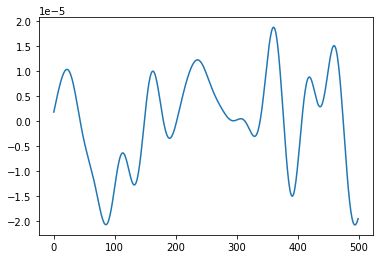

In [ ]:
import matplotlib.pyplot as plt
plt.plot(epo[0][0][0:500])

In [ ]:
from sklearn.model_selection import train_test_split

# CHECK IF DATA SCALING REQUIRED STANDARD SCALAR/OR MINMAX SCALE

In [ ]:
# create array of labels and data


In [ ]:


# create array of labels and data

In [ ]:
print(eegfiles[0].split('/'))

['', 'content', 'drive', 'MyDrive', 'Thesis', 'EEG Data', 'MDD S16 EO.edf']


In [ ]:
print(eegfiles[0].split('/')[-1])

MDD S16 EO.edf


In [ ]:
for i in eegfiles:
  print(i.split('/')[-1],'\t',len(mne.io.read_raw_edf(i,verbose=0).info['ch_names']))



MDD S16 EO.edf 	 20
H S22 TASK.edf 	 22
H S8 EO.edf 	 22
MDD S9 EC.edf 	 20
H S4 EC.edf 	 22
MDD S5 EC.edf 	 22
MDD S31 EC.edf 	 20
MDD S6 TASK.edf 	 22
H S13 EC.edf 	 22
MDD S2  EC.edf 	 20
H S20 EC.edf 	 22
H S5 EC.edf 	 22
H S14 EO.edf 	 22
H S14 EC.edf 	 22
H S13 EO.edf 	 22
MDD S5 EO.edf 	 22
MDD S7 TASK.edf 	 22
H S6 TASK.edf 	 22
H S3 EO.edf 	 22
MDD S10 EC.edf 	 20
H S9 TASK.edf 	 22
6921959_H S15 EO.edf 	 22
MDD S31 TASK.edf 	 22
H S17 EC.edf 	 22
MDD S15 EC.edf 	 20
H S6 EO.edf 	 22
MDD S26 EO.edf 	 20
MDD S28 EC.edf 	 20
MDD S1 EC.edf 	 20
MDD S23 EC.edf 	 20
H S25 EC.edf 	 20
H S7 EC.edf 	 22
MDD S34 EC.edf 	 20
H S8 TASK.edf 	 22
H S2 EO.edf 	 20
MDD S30 EO.edf 	 20
H S24 EO.edf 	 20
MDD S26 TASK.edf 	 22
MDD S33 EC.edf 	 20
MDD S25 TASK.edf 	 22
MDD S34 TASK.edf 	 22
MDD S12 TASK.edf 	 22
MDD S6 EO.edf 	 20
MDD S19 EO.edf 	 20
H S20 EO.edf 	 22
H S16 EO.edf 	 20
H S18 EO.edf 	 22
MDD S22 EO.edf 	 20
MDD S32 TASK.edf 	 22
H S29 TASK.edf 	 22
H S8 EC.edf 	 22
H S10 EO.edf 	